In [1095]:
import pandas as pd # type:ignore
import numpy as np # type:ignore
import matplotlib.pyplot as plt # type:ignore
import seaborn as sns # type:ignore
from sklearn.datasets import make_blobs # type:ignore
from scipy.stats import multivariate_normal # type:ignore
from sklearn.metrics import confusion_matrix,classification_report # type:ignore
from scipy.optimize import linear_sum_assignment # type:ignore
from matplotlib.lines import Line2D # type:ignore
from sklearn.preprocessing import StandardScaler # type:ignore
from sklearn.decomposition import PCA # type:ignore
from sklearn.manifold import TSNE # type:ignore
import umap # type:ignore
from sklearn.cluster import KMeans,DBSCAN # type:ignore
from sklearn.mixture import GaussianMixture # type:ignore
from sklearn.neighbors import NearestNeighbors # type:ignore
import kmedoids # type:ignore
from pyclustering.cluster.kmedoids import kmedoids # type:ignore
from pyclustering.utils import distance_metric,type_metric # type:ignore
import warnings # type:ignore
warnings.filterwarnings("ignore",category=UserWarning) # type:ignore
from main import CorrelatedClusterGenerator

# data

In [1096]:
np.random.seed(42)

In [1097]:
cluster_generator = CorrelatedClusterGenerator(n_samples=10000,n_features=20,n_clusters=7,correlation=0.2,random_state=42)

In [1098]:
X, y = cluster_generator.generate_clusters()

In [1099]:
X = X + np.random.normal(scale=9,size=X.shape) 

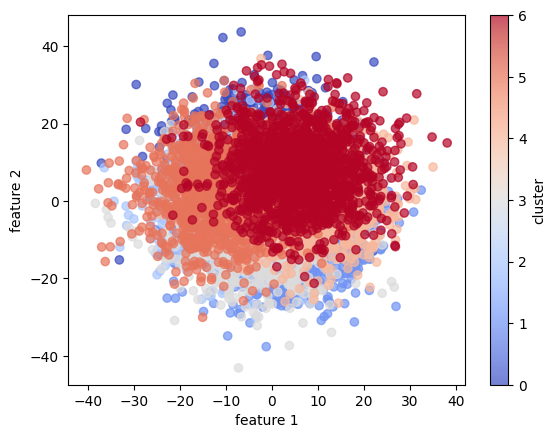

In [1100]:
plt.scatter(X[:,0],X[:,1],c=y,cmap='coolwarm',alpha=0.7)
plt.xlabel("feature 1")
plt.ylabel("feature 2")
plt.colorbar(label="cluster")
plt.show()

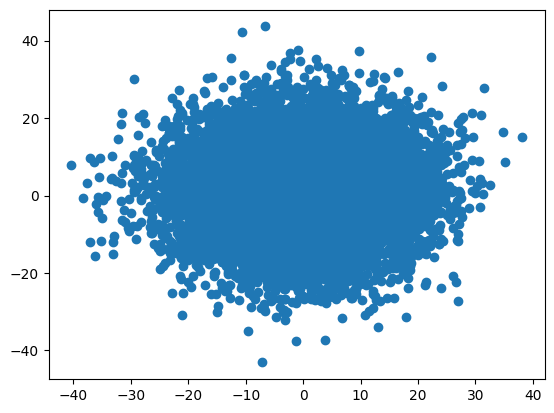

In [1101]:
plt.scatter(X[:,0],X[:,1])
plt.show()

In [1102]:
corr_dataset = pd.DataFrame(X) 

In [1103]:
corr_dataset.columns = [f"vab_{col+1}" for col in corr_dataset.columns]

In [1104]:
corr_dataset['target'] = y

In [1105]:
corr_dataset

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_12,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target
0,1.135599,-10.400164,22.240662,-14.375857,0.285828,-9.783858,-26.381334,-4.637778,-2.740705,1.743482,...,7.176549,11.350963,-31.249533,-9.930586,-0.504532,-11.931650,-10.868683,-9.337304,-14.927016,0
1,-15.869938,30.712240,-0.025704,0.628227,-17.122823,18.190145,-0.849106,15.540172,-2.035509,5.398190,...,1.660853,20.635088,-3.838711,0.645310,-7.577490,-11.899058,-5.253737,-6.015310,-18.292091,0
2,3.316589,8.227358,-7.540726,-7.554103,-20.017507,5.402220,-0.876915,16.187409,11.503358,7.266798,...,-3.781260,4.752239,0.735842,1.421823,-7.926857,-12.432923,5.163713,-0.165397,-0.865351,0
3,-8.785581,8.997587,14.979347,8.468662,4.665399,-5.067845,-6.632648,-0.394280,-1.918146,8.114945,...,12.227111,0.289233,2.665186,-9.949996,-17.098222,2.250262,1.172018,8.048921,-14.501370,0
4,12.464566,8.084375,-5.661159,-10.314443,-9.338559,-21.631719,-3.503240,10.117544,1.547501,-1.978617,...,0.928384,7.975446,-3.748869,-9.303115,-18.775814,2.284411,-3.585064,-0.298347,-0.286966,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9991,13.602651,12.648593,-4.732800,-11.572356,5.292685,15.708583,7.092831,18.167018,-3.220895,11.391614,...,-10.544464,1.435046,-20.917259,-1.677670,-8.697209,6.713519,1.937871,0.365403,-4.306066,6
9992,14.248154,4.176920,10.842006,9.077210,-3.409314,-4.760856,3.128806,-1.921522,-2.321112,-5.009046,...,-0.864038,-30.782598,-2.936667,15.868474,8.922822,-14.560461,12.943139,6.379438,15.065089,6
9993,6.828329,20.077587,7.990726,-16.197304,-8.602133,-11.404849,4.256457,18.669150,-19.029304,-12.182654,...,7.374158,-3.038526,3.793316,26.509104,-0.027349,-0.629210,-4.523955,-2.546196,18.075697,6
9994,7.850504,9.102936,8.316825,4.925269,3.083185,9.232224,-1.591306,19.958951,-10.621306,-6.009115,...,-4.226808,-2.341835,-2.623850,-9.134532,-0.850230,-3.572674,-15.113896,-15.954749,4.366197,6


In [1106]:
# sns.pairplot(corr_dataset)

## correlation matrix

In [1107]:
corr_dataset.iloc[:,:-1].corr()

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,vab_11,vab_12,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20
vab_1,1.000000,0.022705,0.009353,-0.230817,-0.114433,0.009086,0.150471,-0.009604,0.057049,0.059247,-0.092906,-0.014595,-0.171318,-0.116266,0.129496,-0.140518,-0.004413,0.141571,-0.100463,0.040327
vab_2,0.022705,1.000000,0.004147,-0.016255,-0.056108,-0.166066,0.102091,0.099095,-0.006496,0.055135,-0.194105,0.156075,0.165995,-0.230770,-0.129139,-0.192134,-0.011542,0.225482,-0.029260,0.118749
vab_3,0.009353,0.004147,1.000000,-0.059391,-0.058036,-0.077438,-0.119939,0.106757,-0.076460,0.238811,-0.084902,-0.016964,-0.105579,-0.077364,-0.098893,-0.119530,0.112331,-0.008158,0.043478,-0.072426
vab_4,-0.230817,-0.016255,-0.059391,1.000000,0.025897,0.035796,-0.161141,-0.025161,0.041960,-0.079104,0.121919,0.128894,0.182800,0.089746,-0.128917,0.112179,-0.108335,-0.089791,0.003078,-0.055442
vab_5,-0.114433,-0.056108,-0.058036,0.025897,1.000000,0.002714,-0.000078,-0.009843,-0.040651,-0.164701,-0.007699,-0.140157,0.074226,0.127553,0.031406,0.142520,0.095245,-0.103980,0.191827,0.031825
vab_6,0.009086,-0.166066,-0.077438,0.035796,0.002714,1.000000,-0.040455,-0.083942,-0.007840,-0.057467,0.204846,-0.066585,-0.141333,0.147927,0.094047,0.126962,-0.065639,-0.100253,-0.032005,-0.001745
vab_7,0.150471,0.102091,-0.119939,-0.161141,-0.000078,-0.040455,1.000000,0.001266,-0.027850,-0.035028,-0.045891,-0.052045,-0.003708,-0.070869,0.143602,-0.046991,0.038034,0.120672,-0.070956,0.158252
vab_8,-0.009604,0.099095,0.106757,-0.025161,-0.009843,-0.083942,0.001266,1.000000,-0.102477,0.109959,-0.076331,-0.012963,-0.011172,-0.096593,-0.048096,-0.091895,0.075832,0.075468,0.027235,0.047165
vab_9,0.057049,-0.006496,-0.076460,0.041960,-0.040651,-0.007840,-0.027850,-0.102477,1.000000,-0.093197,-0.090747,0.220960,0.185137,-0.002237,-0.071106,-0.002621,-0.138885,-0.007378,-0.116879,-0.161675
vab_10,0.059247,0.055135,0.238811,-0.079104,-0.164701,-0.057467,-0.035028,0.109959,-0.093197,1.000000,-0.045714,0.056155,-0.124709,-0.125802,-0.106513,-0.151414,0.086767,0.054468,-0.118821,-0.099283


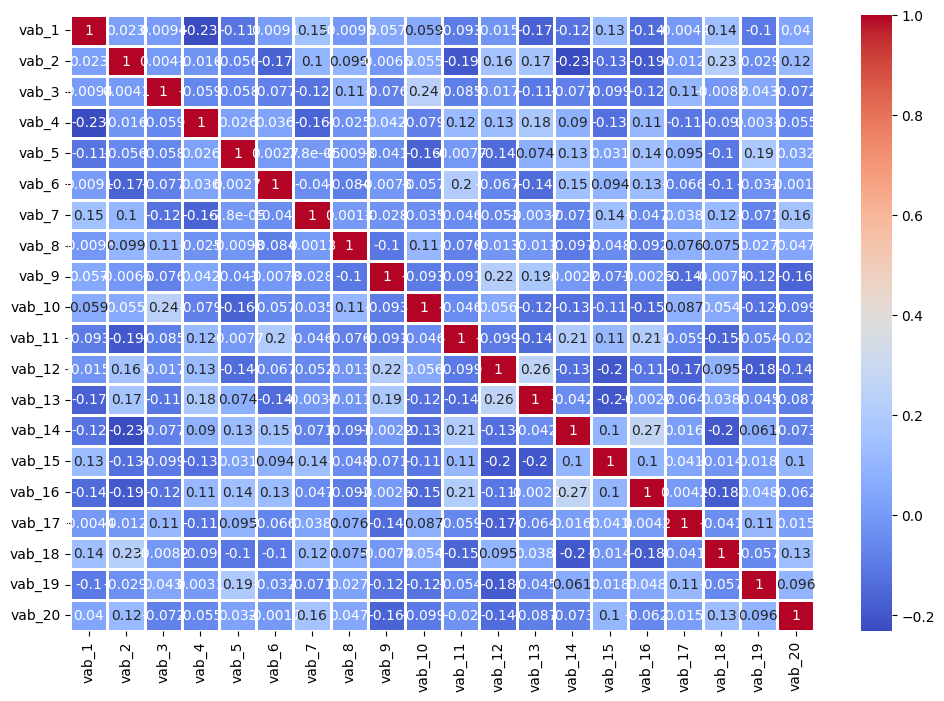

In [1108]:
plt.figure(figsize=(12,8))
sns.heatmap(corr_dataset.iloc[:,:-1].corr(),cmap='coolwarm',annot=True,linewidths=1)
plt.show()

## data standardization

In [1109]:
X_values = corr_dataset.iloc[:,:-1].values

In [1110]:
y_values = corr_dataset.iloc[:,-1].values

In [1111]:
scaler = StandardScaler()

In [1112]:
X_values = scaler.fit_transform(X_values)

In [1113]:
np.mean(X_values),np.std(X_values)

(6.205520291302195e-17, 0.9999999999999998)

In [1114]:
pd.DataFrame(X_values)

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19
0,0.186501,-1.110263,2.310707,-1.189663,0.257665,-0.878970,-2.269090,-0.931602,-0.091067,0.294563,-0.028877,0.712505,0.903637,-3.250631,-1.309399,-0.290479,-1.105398,-0.704948,-0.677525,-1.234830
1,-1.392186,2.728124,0.155807,0.231556,-1.461622,1.938778,0.145297,1.207020,-0.025864,0.623808,-1.602841,0.215152,1.664350,-0.647149,-0.288463,-0.967746,-1.102203,-0.154469,-0.368662,-1.556015
2,0.388970,0.628863,-0.571484,-0.543492,-1.747503,0.650684,0.142667,1.275620,1.225945,0.792148,-0.164378,-0.275566,0.362957,-0.212657,-0.213503,-1.001200,-1.154535,0.866837,0.175235,0.107307
3,-0.734519,0.700774,1.607969,0.974219,0.690194,-0.403938,-0.401608,-0.481841,-0.015013,0.868556,-1.840256,1.167918,-0.002728,-0.029408,-1.311272,-1.879399,0.284784,0.475499,0.938964,-1.194204
4,1.238211,0.615513,-0.389582,-0.804957,-0.692844,-2.072374,-0.105684,0.632287,0.305422,-0.040754,-1.575306,0.149105,0.627057,-0.638615,-1.248826,-2.040036,0.288132,0.009124,0.162874,0.162512
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9991,1.343863,1.041643,-0.299738,-0.924109,0.752145,1.688817,0.896305,1.485435,-0.135466,1.163744,0.926095,-0.885408,0.091156,-2.269271,-0.512710,-1.074964,0.722295,0.550582,0.224587,-0.221097
9992,1.403788,0.250701,1.207565,1.031862,-0.107269,-0.373016,0.521458,-0.643711,-0.052271,-0.313760,0.543116,-0.012519,-2.548662,-0.561472,1.181094,0.612232,-1.363087,1.629517,0.783743,1.627812
9993,0.714978,1.735238,0.931623,-1.362195,-0.620114,-1.042248,0.628091,1.538655,-1.597118,-0.960016,-0.394352,0.730324,-0.275395,0.077742,2.208279,-0.244786,0.002524,-0.082923,-0.046120,1.915164
9994,0.809870,0.710610,0.963182,0.638581,0.533934,1.036470,0.075113,1.675358,-0.819711,-0.403854,-0.435065,-0.315742,-0.218310,-0.531761,-1.232552,-0.323581,-0.286009,-1.121140,-1.292784,0.606640


<Axes: ylabel='Density'>

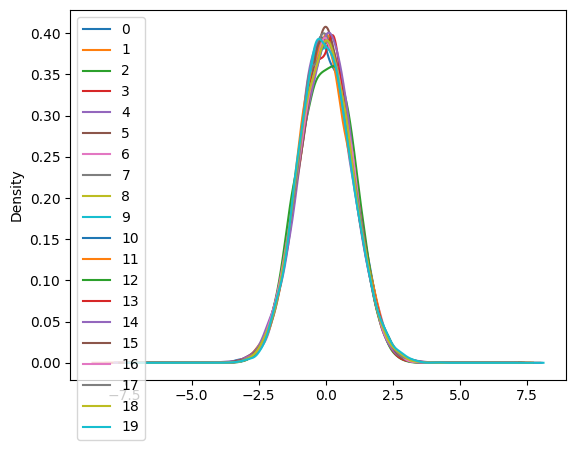

In [1115]:
pd.DataFrame(X_values).plot(kind='density')

## pca 

In [1116]:
pca_general = PCA()

In [1117]:
pca_general.fit(X_values)

PCA()

In [1118]:
explained_variance = pca_general.explained_variance_ratio_

In [1119]:
explained_variance

array([0.1190398 , 0.09878364, 0.07853285, 0.07639114, 0.05847304,
       0.04964329, 0.04443778, 0.04205431, 0.04019633, 0.03919552,
       0.03784236, 0.03750441, 0.03670766, 0.0362487 , 0.03607157,
       0.03567743, 0.03489439, 0.03417508, 0.03355459, 0.03057612])

In [1120]:
eigenvalues = pca_general.explained_variance_

In [1121]:
pd.DataFrame(eigenvalues)

,0
0,2.381034
1,1.975870
2,1.570814
3,1.527976
4,1.169578
5,0.992965
6,0.888844
7,0.841170
8,0.804007
9,0.783989


In [1122]:
eigenvectors = pca_general.components_

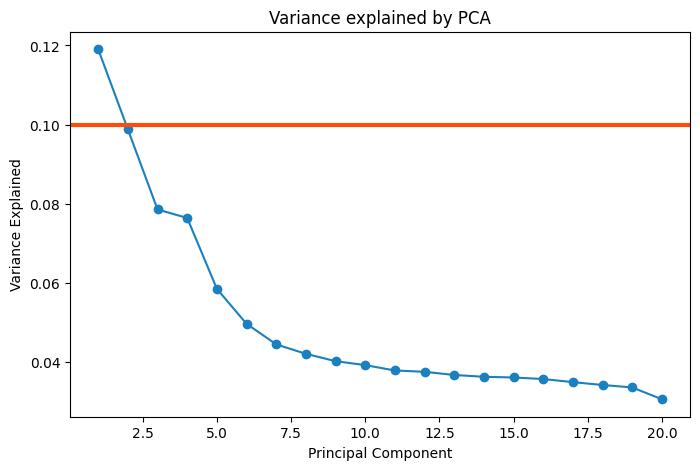

In [1123]:
plt.figure(figsize=(8,5))
plt.plot(range(1, len(explained_variance) + 1), explained_variance, marker='o', linestyle='-', color='#1B80BF')
plt.axhline(y=0.1, color='#FC4E07', linewidth=3)
plt.title('Variance explained by PCA')
plt.xlabel('Principal Component')
plt.ylabel('Variance Explained')
plt.show()

In [1124]:
pca = PCA(n_components=3)

In [1125]:
principal_components = pca.fit_transform(X_values)

In [1126]:
pd.DataFrame(principal_components).head(8)

,0,1,2
0,-1.715720,1.342589,1.793702
1,-2.300038,1.687990,0.391262
2,-1.731464,0.031239,-0.933090
3,-2.100920,1.145231,2.340559
4,-3.096393,-0.189974,0.317409
5,-1.800420,0.290328,0.743280
6,-2.444777,0.015852,0.692524
7,-1.642475,0.916267,0.804439


In [1127]:
principal_df = pd.DataFrame(data = principal_components,columns = ['principal component 1','principal component 2','principal component 3'])

In [1128]:
final_df = pd.concat([principal_df,corr_dataset[['target']]],axis = 1)

In [1129]:
final_df

,principal component 1,principal component 2,principal component 3,target
0,-1.715720,1.342589,1.793702,0
1,-2.300038,1.687990,0.391262,0
2,-1.731464,0.031239,-0.933090,0
3,-2.100920,1.145231,2.340559,0
4,-3.096393,-0.189974,0.317409,0
...,...,...,...,...
9991,-1.583551,-1.831076,-0.059624,6
9992,-0.078286,-1.893098,-1.285061,6
9993,-1.328154,-2.489518,-0.602577,6
9994,-0.626432,-0.248515,0.709617,6


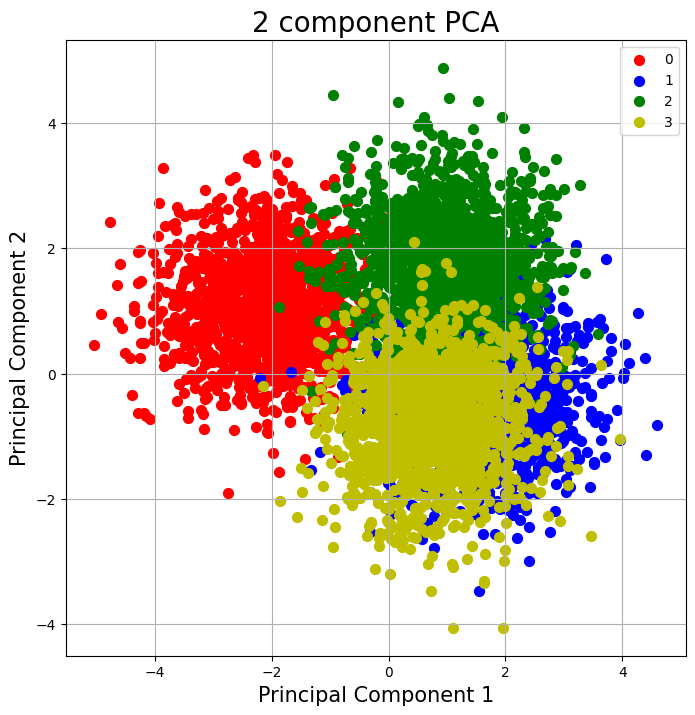

In [1130]:
fig = plt.figure(figsize = (8,8))
ax = fig.add_subplot(1,1,1) 
ax.set_xlabel('Principal Component 1',fontsize = 15)
ax.set_ylabel('Principal Component 2',fontsize = 15)
ax.set_title('2 component PCA',fontsize = 20)

targets = [0,1,2,3]
colors = ['r','b','g','y']
for target, color in zip(targets,colors):
    indicesToKeep = final_df['target'] == target
    ax.scatter(final_df.loc[indicesToKeep, 'principal component 1']
               ,final_df.loc[indicesToKeep, 'principal component 2']
               ,c = color
               ,s = 50)
ax.legend(targets)
ax.grid()

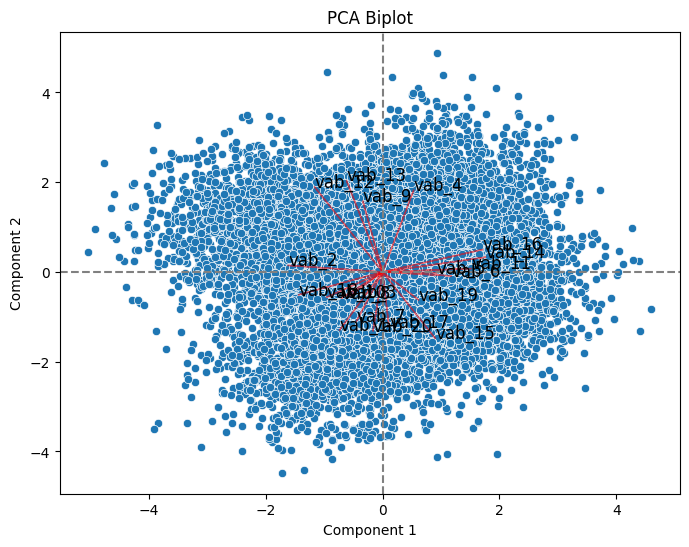

In [1131]:
scores = pca.transform(X_values)
plt.figure(figsize=(8, 6))
sns.scatterplot(x=scores[:, 0], y=scores[:, 1])
for i, col in enumerate(corr_dataset.iloc[:,:-1].columns):
    plt.arrow(0, 0, eigenvectors[0, i] * max(scores[:, 0]), eigenvectors[1, i] * max(scores[:, 1]), color='r', alpha=0.5)
    plt.text(eigenvectors[0, i] * max(scores[:, 0]), eigenvectors[1, i] * max(scores[:, 1]), col, fontsize=12)
plt.xlabel('Component 1')
plt.ylabel('Component 2')
plt.title('PCA Biplot')
plt.axhline(0, color='gray', linestyle='--')
plt.axvline(0, color='gray', linestyle='--')
plt.show()

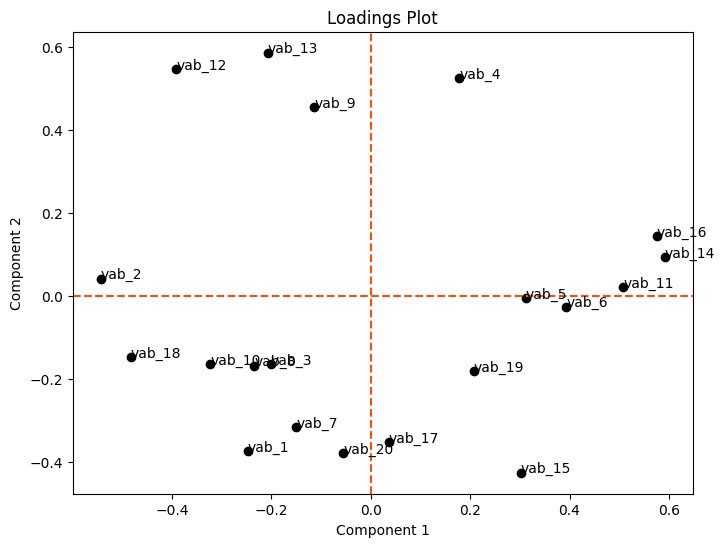

In [1132]:
loadings = pca.components_.T * np.sqrt(pca.explained_variance_)
plt.figure(figsize=(8, 6))
plt.scatter(loadings[:, 0], loadings[:, 1], color='black')
for i, txt in enumerate(corr_dataset.iloc[:,:-1].columns):
    plt.text(loadings[i, 0], loadings[i, 1], txt, fontsize=10)
plt.axhline(0, color='#FC4E07', linestyle='--')
plt.axvline(0, color='#FC4E07', linestyle='--')
plt.xlabel('Component 1')
plt.ylabel('Component 2')
plt.title('Loadings Plot')
plt.show()

In [1133]:
X_pca = pca.transform(X_values)

In [1134]:
pd.DataFrame(X_pca).head()

,0,1,2
0,-1.715720,1.342589,1.793702
1,-2.300038,1.687990,0.391262
2,-1.731464,0.031239,-0.933090
3,-2.100920,1.145231,2.340559
4,-3.096393,-0.189974,0.317409


## t-SNE

In [1135]:
tsne = TSNE(n_components=3,random_state=42)

In [1136]:
X_tsne = tsne.fit_transform(X_values)

In [1137]:
tsne_data = pd.concat([pd.DataFrame(X_tsne,columns=('dim_1','dim_2','dim_3')),corr_dataset['target']],axis=1)

In [1138]:
tsne_data

,dim_1,dim_2,dim_3,target
0,-45.873524,-7.146034,5.612429,0
1,-33.162704,-8.485264,4.852139,0
2,-9.405703,0.247303,5.412324,0
3,-46.095783,0.397697,14.176429,0
4,-26.056284,1.806600,5.338884,0
...,...,...,...,...
9991,-7.788613,10.332136,0.310927,6
9992,-1.805286,29.641180,-11.744405,6
9993,-7.338990,33.369244,3.773545,6
9994,-9.072105,9.484162,25.313629,6


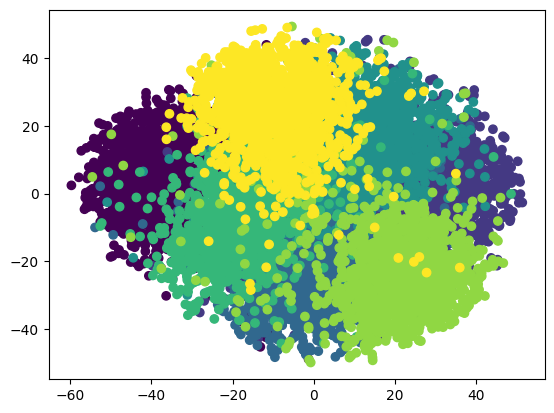

In [1139]:
plt.scatter(x=tsne_data['dim_1'],y=tsne_data['dim_2'],c=tsne_data['target'])
plt.show()

In [1140]:
tsne.kl_divergence_

3.2769479751586914

## umap

In [1141]:
umap = umap.UMAP(n_components=3,random_state=42)

In [1142]:
X_umap = umap.fit_transform(X_values)

In [1143]:
X_umap

array([[4.3285456, 7.3185253, 4.5952253],
       [4.736312 , 7.155076 , 4.685065 ],
       [5.4853   , 6.474758 , 5.611725 ],
       ...,
       [6.7272396, 4.5083904, 5.704528 ],
       [7.369183 , 5.9425254, 6.063711 ],
       [5.974971 , 5.1360307, 5.7110057]], dtype=float32)

In [1144]:
umap_data = pd.concat([pd.DataFrame(X_umap,columns=('dim_1','dim_2','dim_3')),corr_dataset['target']],axis=1)

In [1145]:
umap_data

,dim_1,dim_2,dim_3,target
0,4.328546,7.318525,4.595225,0
1,4.736312,7.155076,4.685065,0
2,5.485300,6.474758,5.611725,0
3,4.809858,7.894096,4.111679,0
4,4.536273,6.695493,4.779453,0
...,...,...,...,...
9991,6.219847,5.218749,5.679378,6
9992,6.246494,4.283538,6.144180,6
9993,6.727240,4.508390,5.704528,6
9994,7.369183,5.942525,6.063711,6


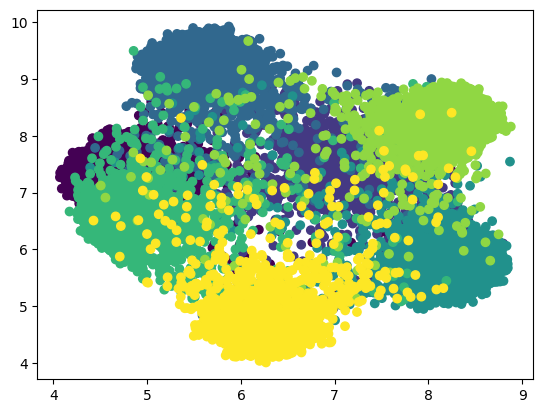

In [1146]:
plt.scatter(umap_data['dim_1'],umap_data['dim_2'],c=umap_data['target'])
plt.show()

## k-means 

In [1147]:
kmeans = KMeans(n_clusters=7,init='k-means++',random_state=42)

In [1148]:
kmeans.fit(X_values)

KMeans(n_clusters=7, random_state=42)

In [1149]:
df_kmeans = corr_dataset.copy()

In [1150]:
df_kmeans['k_means'] = kmeans.labels_

In [1151]:
df_kmeans

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,k_means
0,1.135599,-10.400164,22.240662,-14.375857,0.285828,-9.783858,-26.381334,-4.637778,-2.740705,1.743482,...,11.350963,-31.249533,-9.930586,-0.504532,-11.931650,-10.868683,-9.337304,-14.927016,0,2
1,-15.869938,30.712240,-0.025704,0.628227,-17.122823,18.190145,-0.849106,15.540172,-2.035509,5.398190,...,20.635088,-3.838711,0.645310,-7.577490,-11.899058,-5.253737,-6.015310,-18.292091,0,2
2,3.316589,8.227358,-7.540726,-7.554103,-20.017507,5.402220,-0.876915,16.187409,11.503358,7.266798,...,4.752239,0.735842,1.421823,-7.926857,-12.432923,5.163713,-0.165397,-0.865351,0,0
3,-8.785581,8.997587,14.979347,8.468662,4.665399,-5.067845,-6.632648,-0.394280,-1.918146,8.114945,...,0.289233,2.665186,-9.949996,-17.098222,2.250262,1.172018,8.048921,-14.501370,0,2
4,12.464566,8.084375,-5.661159,-10.314443,-9.338559,-21.631719,-3.503240,10.117544,1.547501,-1.978617,...,7.975446,-3.748869,-9.303115,-18.775814,2.284411,-3.585064,-0.298347,-0.286966,0,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9991,13.602651,12.648593,-4.732800,-11.572356,5.292685,15.708583,7.092831,18.167018,-3.220895,11.391614,...,1.435046,-20.917259,-1.677670,-8.697209,6.713519,1.937871,0.365403,-4.306066,6,3
9992,14.248154,4.176920,10.842006,9.077210,-3.409314,-4.760856,3.128806,-1.921522,-2.321112,-5.009046,...,-30.782598,-2.936667,15.868474,8.922822,-14.560461,12.943139,6.379438,15.065089,6,3
9993,6.828329,20.077587,7.990726,-16.197304,-8.602133,-11.404849,4.256457,18.669150,-19.029304,-12.182654,...,-3.038526,3.793316,26.509104,-0.027349,-0.629210,-4.523955,-2.546196,18.075697,6,3
9994,7.850504,9.102936,8.316825,4.925269,3.083185,9.232224,-1.591306,19.958951,-10.621306,-6.009115,...,-2.341835,-2.623850,-9.134532,-0.850230,-3.572674,-15.113896,-15.954749,4.366197,6,2


In [1152]:
y_true = df_kmeans['target'].values  
y_kmeans = df_kmeans['k_means'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_kmeans['k_means'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_kmeans['k_means'] == y_true))

accuracy before: 0.018107242897158864
accuracy after: 0.8982593037214885


In [1153]:
df_kmeans

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,k_means
0,1.135599,-10.400164,22.240662,-14.375857,0.285828,-9.783858,-26.381334,-4.637778,-2.740705,1.743482,...,11.350963,-31.249533,-9.930586,-0.504532,-11.931650,-10.868683,-9.337304,-14.927016,0,0
1,-15.869938,30.712240,-0.025704,0.628227,-17.122823,18.190145,-0.849106,15.540172,-2.035509,5.398190,...,20.635088,-3.838711,0.645310,-7.577490,-11.899058,-5.253737,-6.015310,-18.292091,0,0
2,3.316589,8.227358,-7.540726,-7.554103,-20.017507,5.402220,-0.876915,16.187409,11.503358,7.266798,...,4.752239,0.735842,1.421823,-7.926857,-12.432923,5.163713,-0.165397,-0.865351,0,4
3,-8.785581,8.997587,14.979347,8.468662,4.665399,-5.067845,-6.632648,-0.394280,-1.918146,8.114945,...,0.289233,2.665186,-9.949996,-17.098222,2.250262,1.172018,8.048921,-14.501370,0,0
4,12.464566,8.084375,-5.661159,-10.314443,-9.338559,-21.631719,-3.503240,10.117544,1.547501,-1.978617,...,7.975446,-3.748869,-9.303115,-18.775814,2.284411,-3.585064,-0.298347,-0.286966,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9991,13.602651,12.648593,-4.732800,-11.572356,5.292685,15.708583,7.092831,18.167018,-3.220895,11.391614,...,1.435046,-20.917259,-1.677670,-8.697209,6.713519,1.937871,0.365403,-4.306066,6,6
9992,14.248154,4.176920,10.842006,9.077210,-3.409314,-4.760856,3.128806,-1.921522,-2.321112,-5.009046,...,-30.782598,-2.936667,15.868474,8.922822,-14.560461,12.943139,6.379438,15.065089,6,6
9993,6.828329,20.077587,7.990726,-16.197304,-8.602133,-11.404849,4.256457,18.669150,-19.029304,-12.182654,...,-3.038526,3.793316,26.509104,-0.027349,-0.629210,-4.523955,-2.546196,18.075697,6,6
9994,7.850504,9.102936,8.316825,4.925269,3.083185,9.232224,-1.591306,19.958951,-10.621306,-6.009115,...,-2.341835,-2.623850,-9.134532,-0.850230,-3.572674,-15.113896,-15.954749,4.366197,6,0


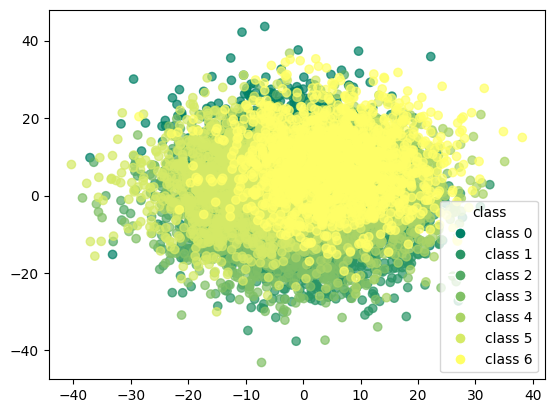

In [1154]:
scatter = plt.scatter(df_kmeans.iloc[:, 0],df_kmeans.iloc[:, 1], 
                      c=df_kmeans['target'],cmap='summer',alpha=0.7)

unique_labels = np.unique(df_kmeans['target'])
legend_elements = [Line2D([0], [0],marker='o',color='w',label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements,title="class")
plt.show()

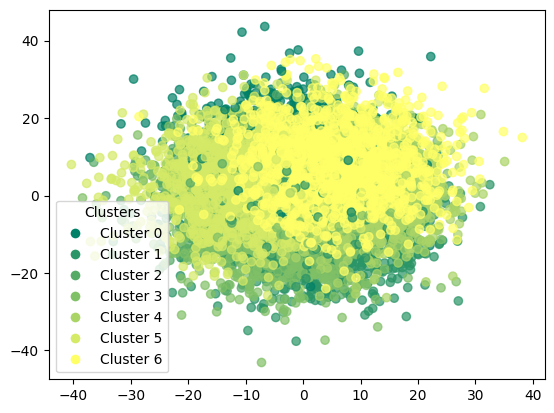

In [1155]:
scatter = plt.scatter(df_kmeans.iloc[:, 0], df_kmeans.iloc[:, 1], 
                      c=df_kmeans['k_means'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_kmeans['k_means'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

In [1156]:
kmeans.cluster_centers_

array([[ 0.77875311,  0.07690272, -0.16798234, -0.65815746, -0.12816783,
        -0.27043342,  0.65364605, -0.16748579,  0.94115422,  0.09932475,
        -0.62475683,  0.4433913 ,  0.38290486, -0.20039205,  0.14926263,
        -0.17807965,  0.09413909,  0.20768168, -0.67556189, -0.5899379 ],
       [-0.799581  ,  0.1565341 , -0.17265126,  0.21409793,  1.0697527 ,
        -0.41640546,  0.07351007,  0.1444703 , -0.32058209, -0.64605477,
        -0.28516113, -0.53831977,  0.67532508,  0.3342007 , -0.05774261,
         0.48514533,  0.66007815, -0.30032723,  0.95430017,  0.28264948],
       [-0.14924242,  0.7191861 ,  0.62694933,  0.35905253, -0.42787716,
        -0.54929084, -0.66022006,  0.32987461,  0.30733193,  0.47929929,
        -0.82059318,  0.89917105,  0.54806213, -0.83730613, -1.03212544,
        -0.86295917, -0.34251744,  0.41964189,  0.04386584, -0.17156212],
       [ 0.62064593,  0.60760575, -0.16213988, -0.59948817, -0.29350914,
        -0.07599466,  0.87354082,  0.28865965, -

In [1157]:
print(confusion_matrix(df_kmeans['target'],df_kmeans['k_means']))

[[1302    3   19   18   56   12   18]
 [   2 1213   43   72   25   42   31]
 [  10   45 1308   15   26   21    3]
 [  13   63    9 1298   14    9   22]
 [  60   27   35   15 1228   14   49]
 [  14   34   24   21   17 1305   13]
 [  12   16    2   33   25   15 1325]]


In [1158]:
print(classification_report(df_kmeans['target'],df_kmeans['k_means']))

              precision    recall  f1-score   support

           0       0.92      0.91      0.92      1428
           1       0.87      0.85      0.86      1428
           2       0.91      0.92      0.91      1428
           3       0.88      0.91      0.90      1428
           4       0.88      0.86      0.87      1428
           5       0.92      0.91      0.92      1428
           6       0.91      0.93      0.92      1428

    accuracy                           0.90      9996
   macro avg       0.90      0.90      0.90      9996
weighted avg       0.90      0.90      0.90      9996



### k-means with pca

In [1159]:
kmeans_pca = KMeans(n_clusters=7,init='k-means++',random_state=42)

In [1160]:
kmeans_pca.fit(X_pca)

KMeans(n_clusters=7, random_state=42)

In [1161]:
df_pca_kmeans = corr_dataset.copy()

In [1162]:
df_pca_kmeans["kmeans_pca"] = kmeans_pca.labels_

In [1163]:
df_pca_kmeans

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,kmeans_pca
0,1.135599,-10.400164,22.240662,-14.375857,0.285828,-9.783858,-26.381334,-4.637778,-2.740705,1.743482,...,11.350963,-31.249533,-9.930586,-0.504532,-11.931650,-10.868683,-9.337304,-14.927016,0,2
1,-15.869938,30.712240,-0.025704,0.628227,-17.122823,18.190145,-0.849106,15.540172,-2.035509,5.398190,...,20.635088,-3.838711,0.645310,-7.577490,-11.899058,-5.253737,-6.015310,-18.292091,0,2
2,3.316589,8.227358,-7.540726,-7.554103,-20.017507,5.402220,-0.876915,16.187409,11.503358,7.266798,...,4.752239,0.735842,1.421823,-7.926857,-12.432923,5.163713,-0.165397,-0.865351,0,0
3,-8.785581,8.997587,14.979347,8.468662,4.665399,-5.067845,-6.632648,-0.394280,-1.918146,8.114945,...,0.289233,2.665186,-9.949996,-17.098222,2.250262,1.172018,8.048921,-14.501370,0,2
4,12.464566,8.084375,-5.661159,-10.314443,-9.338559,-21.631719,-3.503240,10.117544,1.547501,-1.978617,...,7.975446,-3.748869,-9.303115,-18.775814,2.284411,-3.585064,-0.298347,-0.286966,0,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9991,13.602651,12.648593,-4.732800,-11.572356,5.292685,15.708583,7.092831,18.167018,-3.220895,11.391614,...,1.435046,-20.917259,-1.677670,-8.697209,6.713519,1.937871,0.365403,-4.306066,6,4
9992,14.248154,4.176920,10.842006,9.077210,-3.409314,-4.760856,3.128806,-1.921522,-2.321112,-5.009046,...,-30.782598,-2.936667,15.868474,8.922822,-14.560461,12.943139,6.379438,15.065089,6,4
9993,6.828329,20.077587,7.990726,-16.197304,-8.602133,-11.404849,4.256457,18.669150,-19.029304,-12.182654,...,-3.038526,3.793316,26.509104,-0.027349,-0.629210,-4.523955,-2.546196,18.075697,6,4
9994,7.850504,9.102936,8.316825,4.925269,3.083185,9.232224,-1.591306,19.958951,-10.621306,-6.009115,...,-2.341835,-2.623850,-9.134532,-0.850230,-3.572674,-15.113896,-15.954749,4.366197,6,1


In [1164]:
y_true = df_pca_kmeans['target'].values  
y_kmeans = df_pca_kmeans['kmeans_pca'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_pca_kmeans['kmeans_pca'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_pca_kmeans['kmeans_pca'] == y_true))

accuracy before: 0.0819327731092437
accuracy after: 0.7204881952781113


In [1165]:
df_pca_kmeans

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,kmeans_pca
0,1.135599,-10.400164,22.240662,-14.375857,0.285828,-9.783858,-26.381334,-4.637778,-2.740705,1.743482,...,11.350963,-31.249533,-9.930586,-0.504532,-11.931650,-10.868683,-9.337304,-14.927016,0,0
1,-15.869938,30.712240,-0.025704,0.628227,-17.122823,18.190145,-0.849106,15.540172,-2.035509,5.398190,...,20.635088,-3.838711,0.645310,-7.577490,-11.899058,-5.253737,-6.015310,-18.292091,0,0
2,3.316589,8.227358,-7.540726,-7.554103,-20.017507,5.402220,-0.876915,16.187409,11.503358,7.266798,...,4.752239,0.735842,1.421823,-7.926857,-12.432923,5.163713,-0.165397,-0.865351,0,4
3,-8.785581,8.997587,14.979347,8.468662,4.665399,-5.067845,-6.632648,-0.394280,-1.918146,8.114945,...,0.289233,2.665186,-9.949996,-17.098222,2.250262,1.172018,8.048921,-14.501370,0,0
4,12.464566,8.084375,-5.661159,-10.314443,-9.338559,-21.631719,-3.503240,10.117544,1.547501,-1.978617,...,7.975446,-3.748869,-9.303115,-18.775814,2.284411,-3.585064,-0.298347,-0.286966,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9991,13.602651,12.648593,-4.732800,-11.572356,5.292685,15.708583,7.092831,18.167018,-3.220895,11.391614,...,1.435046,-20.917259,-1.677670,-8.697209,6.713519,1.937871,0.365403,-4.306066,6,6
9992,14.248154,4.176920,10.842006,9.077210,-3.409314,-4.760856,3.128806,-1.921522,-2.321112,-5.009046,...,-30.782598,-2.936667,15.868474,8.922822,-14.560461,12.943139,6.379438,15.065089,6,6
9993,6.828329,20.077587,7.990726,-16.197304,-8.602133,-11.404849,4.256457,18.669150,-19.029304,-12.182654,...,-3.038526,3.793316,26.509104,-0.027349,-0.629210,-4.523955,-2.546196,18.075697,6,6
9994,7.850504,9.102936,8.316825,4.925269,3.083185,9.232224,-1.591306,19.958951,-10.621306,-6.009115,...,-2.341835,-2.623850,-9.134532,-0.850230,-3.572674,-15.113896,-15.954749,4.366197,6,3


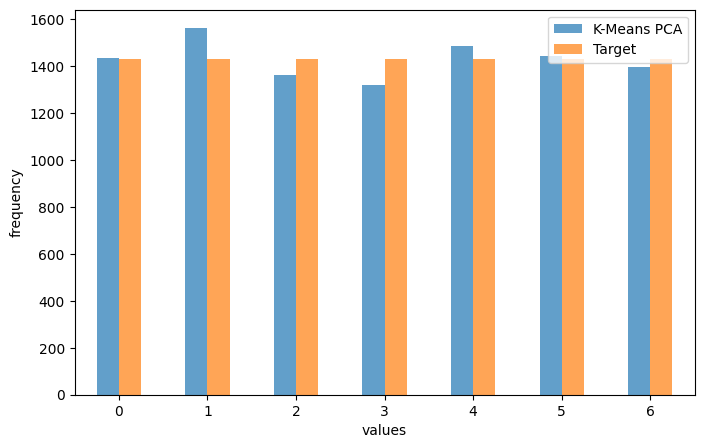

In [1166]:
counts_kmeans = df_pca_kmeans['kmeans_pca'].value_counts().sort_index()
counts_target = df_pca_kmeans['target'].value_counts().sort_index()

df_counts = pd.DataFrame({'K-Means PCA': counts_kmeans, 'Target': counts_target}).fillna(0)

df_counts.plot(kind='bar', figsize=(8, 5), alpha=0.7)
plt.xlabel("values")
plt.ylabel("frequency")
plt.legend(["K-Means PCA", "Target"])
plt.xticks(rotation=0)  
plt.show()


In [1167]:
print(confusion_matrix(df_pca_kmeans['target'],df_pca_kmeans['kmeans_pca']))

[[1237    0   11   14  129   31    6]
 [   0 1025   89   82   52  154   26]
 [  12   75 1127    0   94  119    1]
 [  17  135    5  878   19  343   31]
 [ 127   58   66   19  991   17  150]
 [  30  228   63  258   61  775   13]
 [   9   40    0   68  140    2 1169]]


In [1168]:
print(classification_report(df_pca_kmeans['target'],df_pca_kmeans['kmeans_pca']))

              precision    recall  f1-score   support

           0       0.86      0.87      0.87      1428
           1       0.66      0.72      0.69      1428
           2       0.83      0.79      0.81      1428
           3       0.67      0.61      0.64      1428
           4       0.67      0.69      0.68      1428
           5       0.54      0.54      0.54      1428
           6       0.84      0.82      0.83      1428

    accuracy                           0.72      9996
   macro avg       0.72      0.72      0.72      9996
weighted avg       0.72      0.72      0.72      9996



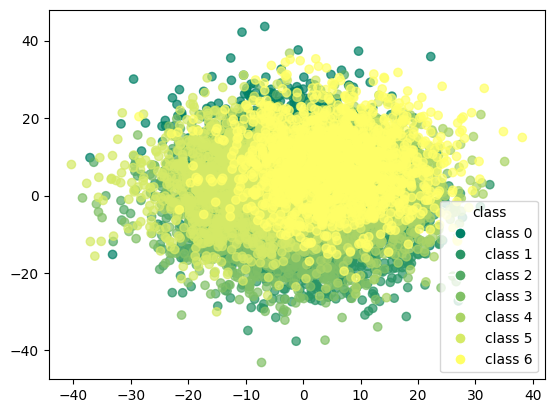

In [1169]:
scatter = plt.scatter(df_pca_kmeans.iloc[:, 0], df_pca_kmeans.iloc[:, 1], 
                      c=df_pca_kmeans['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_pca_kmeans['target'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements, title="class")
plt.show()

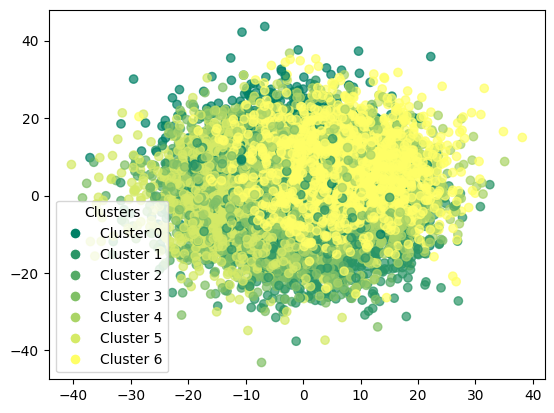

In [1170]:
scatter = plt.scatter(df_pca_kmeans.iloc[:, 0], df_pca_kmeans.iloc[:, 1], 
                      c=df_pca_kmeans['kmeans_pca'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_pca_kmeans['kmeans_pca'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

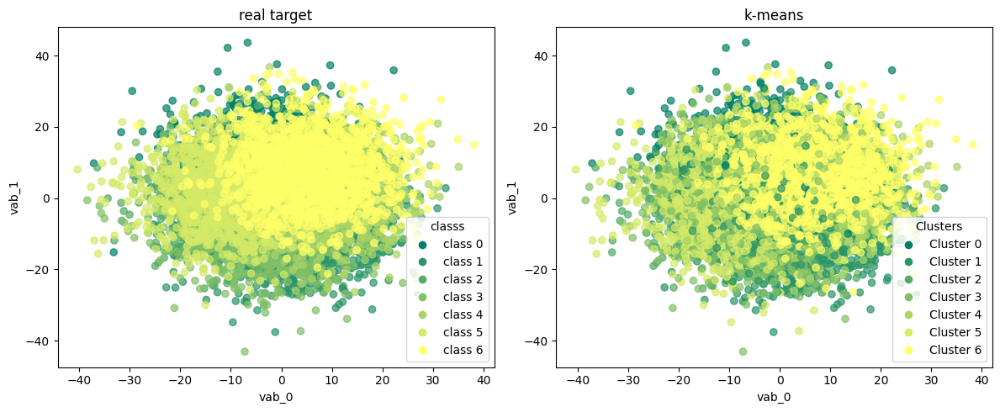

In [1171]:
fig, axes = plt.subplots(1, 2, figsize=(12, 5))  

scatter1 = axes[0].scatter(df_pca_kmeans.iloc[:, 0], df_pca_kmeans.iloc[:, 1], 
                           c=df_pca_kmeans['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_pca_kmeans['target'])
legend_elements1 = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',
                           markerfacecolor=scatter1.cmap(scatter1.norm(label)), markersize=8) 
                    for label in unique_labels]
axes[0].legend(handles=legend_elements1, title="classs")
axes[0].set_title("real target")

scatter2 = axes[1].scatter(df_pca_kmeans.iloc[:, 0], df_pca_kmeans.iloc[:, 1], 
                           c=df_pca_kmeans['kmeans_pca'], cmap='summer', alpha=0.7)

unique_clusters = np.unique(df_pca_kmeans['kmeans_pca'])
legend_elements2 = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                           markerfacecolor=scatter2.cmap(scatter2.norm(cluster)), markersize=8) 
                    for cluster in unique_clusters]
axes[1].legend(handles=legend_elements2, title="Clusters")
axes[1].set_title("k-means")

for ax in axes:
    ax.set_xlabel("vab_0")
    ax.set_ylabel("vab_1")

plt.tight_layout()  
plt.show()

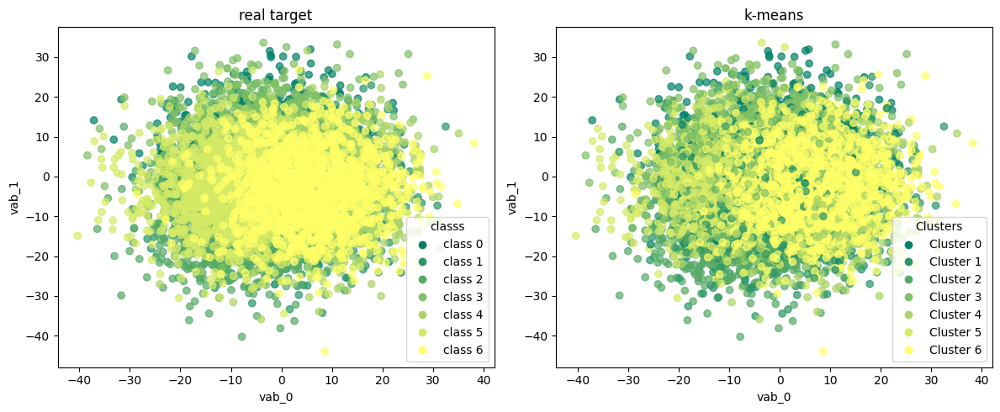

In [1172]:
fig, axes = plt.subplots(1, 2, figsize=(12, 5))  

scatter1 = axes[0].scatter(df_pca_kmeans.iloc[:, 0], df_pca_kmeans.iloc[:, 2], 
                           c=df_pca_kmeans['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_pca_kmeans['target'])
legend_elements1 = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',
                           markerfacecolor=scatter1.cmap(scatter1.norm(label)), markersize=8) 
                    for label in unique_labels]
axes[0].legend(handles=legend_elements1, title="classs")
axes[0].set_title("real target")

scatter2 = axes[1].scatter(df_pca_kmeans.iloc[:, 0], df_pca_kmeans.iloc[:, 2], 
                           c=df_pca_kmeans['kmeans_pca'], cmap='summer', alpha=0.7)

unique_clusters = np.unique(df_pca_kmeans['kmeans_pca'])
legend_elements2 = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                           markerfacecolor=scatter2.cmap(scatter2.norm(cluster)), markersize=8) 
                    for cluster in unique_clusters]
axes[1].legend(handles=legend_elements2, title="Clusters")
axes[1].set_title("k-means")

for ax in axes:
    ax.set_xlabel("vab_0")
    ax.set_ylabel("vab_1")

plt.tight_layout()  
plt.show()

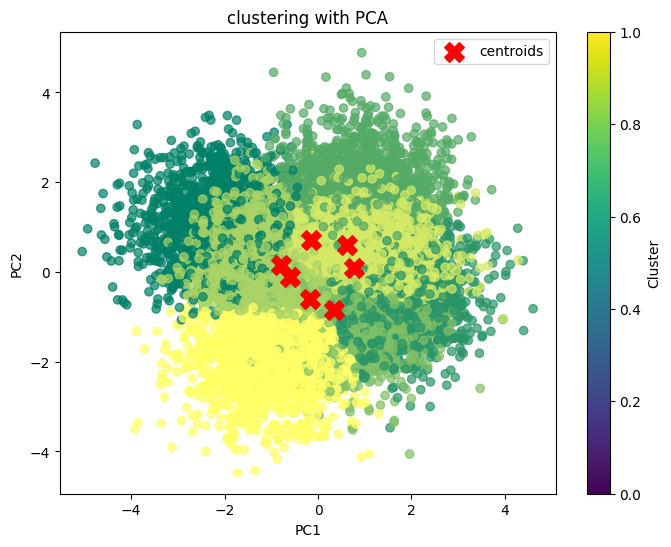

In [1173]:
plt.figure(figsize=(8, 6))
plt.scatter(final_df['principal component 1'], final_df['principal component 2'] , c=df_pca_kmeans['kmeans_pca'], cmap='summer', alpha=0.7)
plt.scatter(kmeans.cluster_centers_[:, 0], kmeans.cluster_centers_[:, 1], 
            c='red', marker='X', s=200, label='centroids')

plt.xlabel('PC1')
plt.ylabel('PC2')
plt.title('clustering with PCA')
plt.colorbar(label='Cluster')
plt.legend()
plt.show()

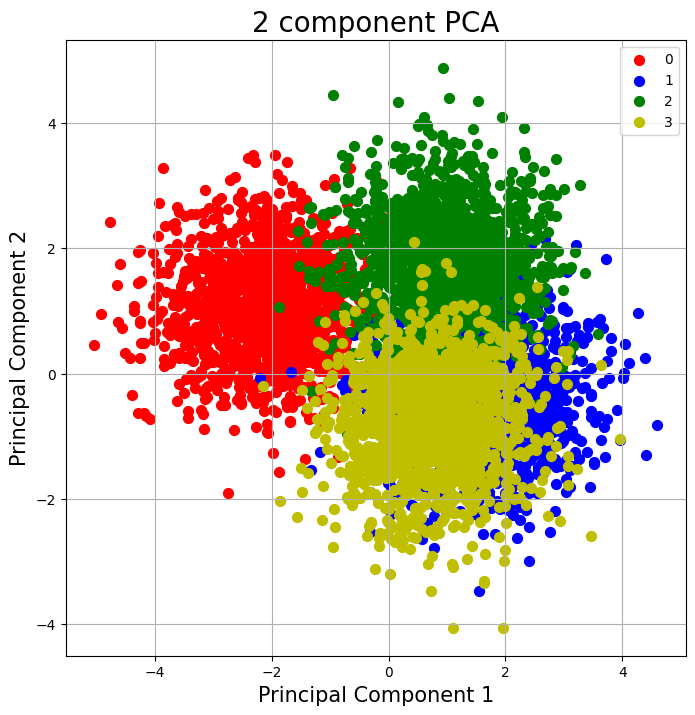

In [1174]:
fig = plt.figure(figsize = (8,8))
ax = fig.add_subplot(1,1,1) 
ax.set_xlabel('Principal Component 1',fontsize = 15)
ax.set_ylabel('Principal Component 2',fontsize = 15)
ax.set_title('2 component PCA',fontsize = 20)

targets = [0,1,2,3]
colors = ['r','b','g','y']
for target, color in zip(targets,colors):
    indicesToKeep = final_df['target'] == target
    ax.scatter(final_df.loc[indicesToKeep, 'principal component 1']
               ,final_df.loc[indicesToKeep, 'principal component 2']
               ,c = color
               ,s = 50)
ax.legend(targets)
ax.grid()

### k-means with t-SNE

In [1175]:
kmeans_tsne = KMeans(n_clusters=7,init='k-means++',random_state=42)

In [1176]:
kmeans_tsne.fit(X_tsne)

KMeans(n_clusters=7, random_state=42)

In [1177]:
df_tsne_kmeans = corr_dataset.copy()

In [1178]:
df_tsne_kmeans['kmeans_tsne'] = kmeans_tsne.labels_

In [1179]:
df_tsne_kmeans

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,kmeans_tsne
0,1.135599,-10.400164,22.240662,-14.375857,0.285828,-9.783858,-26.381334,-4.637778,-2.740705,1.743482,...,11.350963,-31.249533,-9.930586,-0.504532,-11.931650,-10.868683,-9.337304,-14.927016,0,2
1,-15.869938,30.712240,-0.025704,0.628227,-17.122823,18.190145,-0.849106,15.540172,-2.035509,5.398190,...,20.635088,-3.838711,0.645310,-7.577490,-11.899058,-5.253737,-6.015310,-18.292091,0,2
2,3.316589,8.227358,-7.540726,-7.554103,-20.017507,5.402220,-0.876915,16.187409,11.503358,7.266798,...,4.752239,0.735842,1.421823,-7.926857,-12.432923,5.163713,-0.165397,-0.865351,0,5
3,-8.785581,8.997587,14.979347,8.468662,4.665399,-5.067845,-6.632648,-0.394280,-1.918146,8.114945,...,0.289233,2.665186,-9.949996,-17.098222,2.250262,1.172018,8.048921,-14.501370,0,2
4,12.464566,8.084375,-5.661159,-10.314443,-9.338559,-21.631719,-3.503240,10.117544,1.547501,-1.978617,...,7.975446,-3.748869,-9.303115,-18.775814,2.284411,-3.585064,-0.298347,-0.286966,0,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9991,13.602651,12.648593,-4.732800,-11.572356,5.292685,15.708583,7.092831,18.167018,-3.220895,11.391614,...,1.435046,-20.917259,-1.677670,-8.697209,6.713519,1.937871,0.365403,-4.306066,6,3
9992,14.248154,4.176920,10.842006,9.077210,-3.409314,-4.760856,3.128806,-1.921522,-2.321112,-5.009046,...,-30.782598,-2.936667,15.868474,8.922822,-14.560461,12.943139,6.379438,15.065089,6,3
9993,6.828329,20.077587,7.990726,-16.197304,-8.602133,-11.404849,4.256457,18.669150,-19.029304,-12.182654,...,-3.038526,3.793316,26.509104,-0.027349,-0.629210,-4.523955,-2.546196,18.075697,6,3
9994,7.850504,9.102936,8.316825,4.925269,3.083185,9.232224,-1.591306,19.958951,-10.621306,-6.009115,...,-2.341835,-2.623850,-9.134532,-0.850230,-3.572674,-15.113896,-15.954749,4.366197,6,6


In [1180]:
y_true = df_tsne_kmeans['target'].values  
y_kmeans = df_tsne_kmeans['kmeans_tsne'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_tsne_kmeans['kmeans_tsne'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_tsne_kmeans['kmeans_tsne'] == y_true))

accuracy before: 0.1325530212084834
accuracy after: 0.7336934773909564


In [1181]:
df_tsne_kmeans

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,kmeans_tsne
0,1.135599,-10.400164,22.240662,-14.375857,0.285828,-9.783858,-26.381334,-4.637778,-2.740705,1.743482,...,11.350963,-31.249533,-9.930586,-0.504532,-11.931650,-10.868683,-9.337304,-14.927016,0,0
1,-15.869938,30.712240,-0.025704,0.628227,-17.122823,18.190145,-0.849106,15.540172,-2.035509,5.398190,...,20.635088,-3.838711,0.645310,-7.577490,-11.899058,-5.253737,-6.015310,-18.292091,0,0
2,3.316589,8.227358,-7.540726,-7.554103,-20.017507,5.402220,-0.876915,16.187409,11.503358,7.266798,...,4.752239,0.735842,1.421823,-7.926857,-12.432923,5.163713,-0.165397,-0.865351,0,4
3,-8.785581,8.997587,14.979347,8.468662,4.665399,-5.067845,-6.632648,-0.394280,-1.918146,8.114945,...,0.289233,2.665186,-9.949996,-17.098222,2.250262,1.172018,8.048921,-14.501370,0,0
4,12.464566,8.084375,-5.661159,-10.314443,-9.338559,-21.631719,-3.503240,10.117544,1.547501,-1.978617,...,7.975446,-3.748869,-9.303115,-18.775814,2.284411,-3.585064,-0.298347,-0.286966,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9991,13.602651,12.648593,-4.732800,-11.572356,5.292685,15.708583,7.092831,18.167018,-3.220895,11.391614,...,1.435046,-20.917259,-1.677670,-8.697209,6.713519,1.937871,0.365403,-4.306066,6,6
9992,14.248154,4.176920,10.842006,9.077210,-3.409314,-4.760856,3.128806,-1.921522,-2.321112,-5.009046,...,-30.782598,-2.936667,15.868474,8.922822,-14.560461,12.943139,6.379438,15.065089,6,6
9993,6.828329,20.077587,7.990726,-16.197304,-8.602133,-11.404849,4.256457,18.669150,-19.029304,-12.182654,...,-3.038526,3.793316,26.509104,-0.027349,-0.629210,-4.523955,-2.546196,18.075697,6,6
9994,7.850504,9.102936,8.316825,4.925269,3.083185,9.232224,-1.591306,19.958951,-10.621306,-6.009115,...,-2.341835,-2.623850,-9.134532,-0.850230,-3.572674,-15.113896,-15.954749,4.366197,6,3


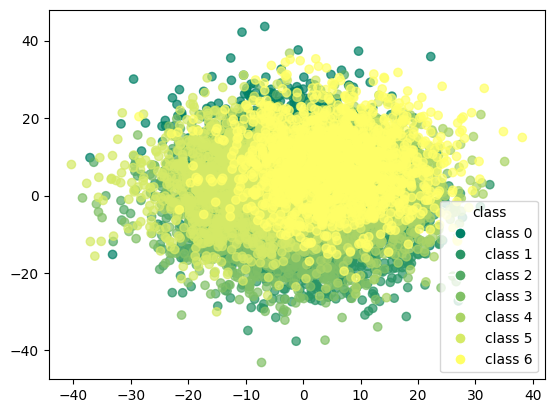

In [1182]:
scatter = plt.scatter(df_tsne_kmeans.iloc[:, 0], df_tsne_kmeans.iloc[:, 1], 
                      c=df_tsne_kmeans['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_tsne_kmeans['target'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements, title="class")
plt.show()

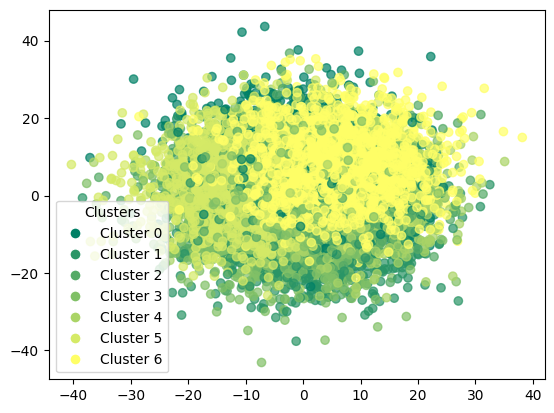

In [1183]:
scatter = plt.scatter(df_tsne_kmeans.iloc[:, 0], df_tsne_kmeans.iloc[:, 1], 
                      c=df_tsne_kmeans['kmeans_tsne'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_tsne_kmeans['kmeans_tsne'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

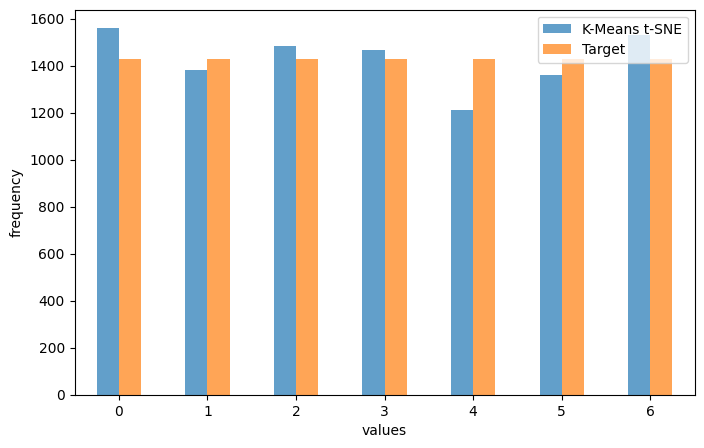

In [1184]:
counts_kmeans = df_tsne_kmeans['kmeans_tsne'].value_counts().sort_index()
counts_target = df_tsne_kmeans['target'].value_counts().sort_index()

df_counts = pd.DataFrame({'K-Means t-SNE': counts_kmeans, 'Target': counts_target}).fillna(0)

df_counts.plot(kind='bar', figsize=(8, 5), alpha=0.7)
plt.xlabel("values")
plt.ylabel("frequency")
plt.legend(["K-Means t-SNE", "Target"])
plt.xticks(rotation=0)  
plt.show()

In [1185]:
print(confusion_matrix(df_tsne_kmeans['target'],df_tsne_kmeans['kmeans_tsne']))

[[1260    3   21   30   84    4   26]
 [   4 1022  103  106   53   79   61]
 [  10   59  960   17  260  114    8]
 [   8  216   16 1061   36   14   77]
 [ 239    9  309   50  688    4  129]
 [  12   61   46   75   64 1142   28]
 [  27   13   28  127   27    5 1201]]


In [1186]:
print(classification_report(df_tsne_kmeans['target'],df_tsne_kmeans['kmeans_tsne'])) 

              precision    recall  f1-score   support

           0       0.81      0.88      0.84      1428
           1       0.74      0.72      0.73      1428
           2       0.65      0.67      0.66      1428
           3       0.72      0.74      0.73      1428
           4       0.57      0.48      0.52      1428
           5       0.84      0.80      0.82      1428
           6       0.78      0.84      0.81      1428

    accuracy                           0.73      9996
   macro avg       0.73      0.73      0.73      9996
weighted avg       0.73      0.73      0.73      9996



### k-means with umap

In [1187]:
kmeans_umap = KMeans(n_clusters=7,init='k-means++',random_state=42)

In [1188]:
kmeans_umap.fit(X_umap)

KMeans(n_clusters=7, random_state=42)

In [1189]:
df_umap_kmeans = corr_dataset.copy()

In [1190]:
df_umap_kmeans['kmeans_umap'] = kmeans_umap.labels_

In [1191]:
df_umap_kmeans

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,kmeans_umap
0,1.135599,-10.400164,22.240662,-14.375857,0.285828,-9.783858,-26.381334,-4.637778,-2.740705,1.743482,...,11.350963,-31.249533,-9.930586,-0.504532,-11.931650,-10.868683,-9.337304,-14.927016,0,2
1,-15.869938,30.712240,-0.025704,0.628227,-17.122823,18.190145,-0.849106,15.540172,-2.035509,5.398190,...,20.635088,-3.838711,0.645310,-7.577490,-11.899058,-5.253737,-6.015310,-18.292091,0,2
2,3.316589,8.227358,-7.540726,-7.554103,-20.017507,5.402220,-0.876915,16.187409,11.503358,7.266798,...,4.752239,0.735842,1.421823,-7.926857,-12.432923,5.163713,-0.165397,-0.865351,0,1
3,-8.785581,8.997587,14.979347,8.468662,4.665399,-5.067845,-6.632648,-0.394280,-1.918146,8.114945,...,0.289233,2.665186,-9.949996,-17.098222,2.250262,1.172018,8.048921,-14.501370,0,2
4,12.464566,8.084375,-5.661159,-10.314443,-9.338559,-21.631719,-3.503240,10.117544,1.547501,-1.978617,...,7.975446,-3.748869,-9.303115,-18.775814,2.284411,-3.585064,-0.298347,-0.286966,0,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9991,13.602651,12.648593,-4.732800,-11.572356,5.292685,15.708583,7.092831,18.167018,-3.220895,11.391614,...,1.435046,-20.917259,-1.677670,-8.697209,6.713519,1.937871,0.365403,-4.306066,6,4
9992,14.248154,4.176920,10.842006,9.077210,-3.409314,-4.760856,3.128806,-1.921522,-2.321112,-5.009046,...,-30.782598,-2.936667,15.868474,8.922822,-14.560461,12.943139,6.379438,15.065089,6,4
9993,6.828329,20.077587,7.990726,-16.197304,-8.602133,-11.404849,4.256457,18.669150,-19.029304,-12.182654,...,-3.038526,3.793316,26.509104,-0.027349,-0.629210,-4.523955,-2.546196,18.075697,6,4
9994,7.850504,9.102936,8.316825,4.925269,3.083185,9.232224,-1.591306,19.958951,-10.621306,-6.009115,...,-2.341835,-2.623850,-9.134532,-0.850230,-3.572674,-15.113896,-15.954749,4.366197,6,4


In [1192]:
y_true = df_umap_kmeans['target'].values  
y_kmeans = df_umap_kmeans['kmeans_umap'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_umap_kmeans['kmeans_umap'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_umap_kmeans['kmeans_umap'] == y_true))

accuracy before: 0.02611044417767107
accuracy after: 0.8686474589835934


In [1193]:
df_umap_kmeans

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,kmeans_umap
0,1.135599,-10.400164,22.240662,-14.375857,0.285828,-9.783858,-26.381334,-4.637778,-2.740705,1.743482,...,11.350963,-31.249533,-9.930586,-0.504532,-11.931650,-10.868683,-9.337304,-14.927016,0,0
1,-15.869938,30.712240,-0.025704,0.628227,-17.122823,18.190145,-0.849106,15.540172,-2.035509,5.398190,...,20.635088,-3.838711,0.645310,-7.577490,-11.899058,-5.253737,-6.015310,-18.292091,0,0
2,3.316589,8.227358,-7.540726,-7.554103,-20.017507,5.402220,-0.876915,16.187409,11.503358,7.266798,...,4.752239,0.735842,1.421823,-7.926857,-12.432923,5.163713,-0.165397,-0.865351,0,4
3,-8.785581,8.997587,14.979347,8.468662,4.665399,-5.067845,-6.632648,-0.394280,-1.918146,8.114945,...,0.289233,2.665186,-9.949996,-17.098222,2.250262,1.172018,8.048921,-14.501370,0,0
4,12.464566,8.084375,-5.661159,-10.314443,-9.338559,-21.631719,-3.503240,10.117544,1.547501,-1.978617,...,7.975446,-3.748869,-9.303115,-18.775814,2.284411,-3.585064,-0.298347,-0.286966,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9991,13.602651,12.648593,-4.732800,-11.572356,5.292685,15.708583,7.092831,18.167018,-3.220895,11.391614,...,1.435046,-20.917259,-1.677670,-8.697209,6.713519,1.937871,0.365403,-4.306066,6,6
9992,14.248154,4.176920,10.842006,9.077210,-3.409314,-4.760856,3.128806,-1.921522,-2.321112,-5.009046,...,-30.782598,-2.936667,15.868474,8.922822,-14.560461,12.943139,6.379438,15.065089,6,6
9993,6.828329,20.077587,7.990726,-16.197304,-8.602133,-11.404849,4.256457,18.669150,-19.029304,-12.182654,...,-3.038526,3.793316,26.509104,-0.027349,-0.629210,-4.523955,-2.546196,18.075697,6,6
9994,7.850504,9.102936,8.316825,4.925269,3.083185,9.232224,-1.591306,19.958951,-10.621306,-6.009115,...,-2.341835,-2.623850,-9.134532,-0.850230,-3.572674,-15.113896,-15.954749,4.366197,6,6


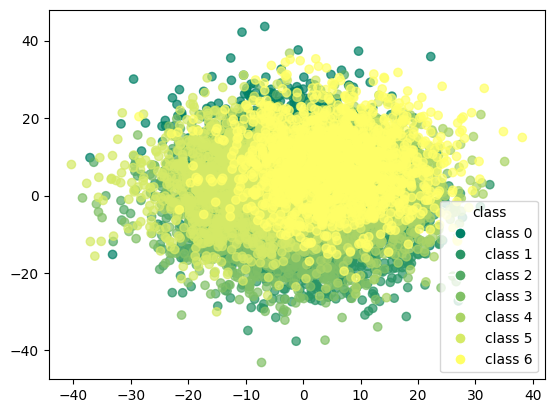

In [1194]:
scatter = plt.scatter(df_umap_kmeans.iloc[:, 0], df_umap_kmeans.iloc[:, 1], 
                      c=df_umap_kmeans['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_umap_kmeans['target'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements, title="class")
plt.show()

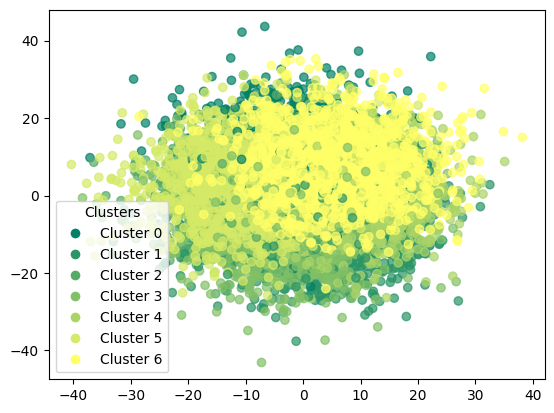

In [1195]:
scatter = plt.scatter(df_umap_kmeans.iloc[:, 0], df_umap_kmeans.iloc[:, 1], 
                      c=df_umap_kmeans['kmeans_umap'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_umap_kmeans['kmeans_umap'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

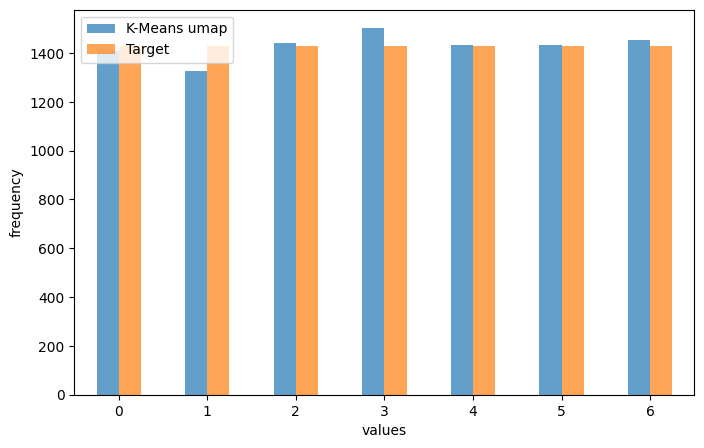

In [1196]:
counts_kmeans = df_umap_kmeans['kmeans_umap'].value_counts().sort_index()
counts_target = df_umap_kmeans['target'].value_counts().sort_index()

df_counts = pd.DataFrame({'K-Means umap': counts_kmeans, 'Target': counts_target}).fillna(0)

df_counts.plot(kind='bar', figsize=(8, 5), alpha=0.7)
plt.xlabel("values")
plt.ylabel("frequency")
plt.legend(["K-Means umap", "Target"])
plt.xticks(rotation=0)  
plt.show()

In [1197]:
print(confusion_matrix(df_umap_kmeans['target'],df_umap_kmeans['kmeans_umap']))

[[1272    4   30   14   71    9   28]
 [   3 1123   59  111   46   60   26]
 [   9   40 1279   18   43   35    4]
 [  15   66   10 1268   25   15   29]
 [  81   27   33   20 1180   16   71]
 [  18   44   29   25   19 1279   14]
 [  12   21    1   46   47   19 1282]]


In [1198]:
print(classification_report(df_umap_kmeans['target'],df_umap_kmeans['kmeans_umap'])) 

              precision    recall  f1-score   support

           0       0.90      0.89      0.90      1428
           1       0.85      0.79      0.82      1428
           2       0.89      0.90      0.89      1428
           3       0.84      0.89      0.87      1428
           4       0.82      0.83      0.83      1428
           5       0.89      0.90      0.89      1428
           6       0.88      0.90      0.89      1428

    accuracy                           0.87      9996
   macro avg       0.87      0.87      0.87      9996
weighted avg       0.87      0.87      0.87      9996



## trimmed k-means

In [1199]:
def trimmed_clustering(X,n_clusters,trim_fraction=0.1):

    kmeans = KMeans(n_clusters=n_clusters,random_state=42).fit(X)
    distances = np.min(kmeans.transform(X),axis=1)
    
    trim_threshold = np.percentile(distances,100 * (1 - trim_fraction))
    trimmed_X = X[distances < trim_threshold]
    trimmed_indices = np.where(distances < trim_threshold)[0]
    trimmed_kmeans = KMeans(n_clusters=n_clusters,random_state=42).fit(trimmed_X)
    
    return trimmed_kmeans,trimmed_indices

In [1200]:
trimmed_kmeans,trimmmed_indces = trimmed_clustering(X_values,n_clusters=7,trim_fraction=0.1)

In [1201]:
trimmed_kmeans

KMeans(n_clusters=7, random_state=42)

In [1202]:
df_trim_kmeans = corr_dataset.copy()

In [1203]:
df_trim_kmeans = df_trim_kmeans.iloc[trimmmed_indces]  

In [1204]:
df_trim_kmeans['trim_kmeans'] = trimmed_kmeans.labels_

In [1205]:
df_trim_kmeans

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,trim_kmeans
1,-15.869938,30.712240,-0.025704,0.628227,-17.122823,18.190145,-0.849106,15.540172,-2.035509,5.398190,...,20.635088,-3.838711,0.645310,-7.577490,-11.899058,-5.253737,-6.015310,-18.292091,0,2
2,3.316589,8.227358,-7.540726,-7.554103,-20.017507,5.402220,-0.876915,16.187409,11.503358,7.266798,...,4.752239,0.735842,1.421823,-7.926857,-12.432923,5.163713,-0.165397,-0.865351,0,6
3,-8.785581,8.997587,14.979347,8.468662,4.665399,-5.067845,-6.632648,-0.394280,-1.918146,8.114945,...,0.289233,2.665186,-9.949996,-17.098222,2.250262,1.172018,8.048921,-14.501370,0,2
4,12.464566,8.084375,-5.661159,-10.314443,-9.338559,-21.631719,-3.503240,10.117544,1.547501,-1.978617,...,7.975446,-3.748869,-9.303115,-18.775814,2.284411,-3.585064,-0.298347,-0.286966,0,2
5,0.963753,6.333141,10.651524,8.606922,-4.334759,-8.715001,-1.909480,1.280557,5.993989,8.584965,...,3.479784,4.783514,3.232748,-17.454303,2.530796,4.703797,11.048583,6.020571,0,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9991,13.602651,12.648593,-4.732800,-11.572356,5.292685,15.708583,7.092831,18.167018,-3.220895,11.391614,...,1.435046,-20.917259,-1.677670,-8.697209,6.713519,1.937871,0.365403,-4.306066,6,1
9992,14.248154,4.176920,10.842006,9.077210,-3.409314,-4.760856,3.128806,-1.921522,-2.321112,-5.009046,...,-30.782598,-2.936667,15.868474,8.922822,-14.560461,12.943139,6.379438,15.065089,6,1
9993,6.828329,20.077587,7.990726,-16.197304,-8.602133,-11.404849,4.256457,18.669150,-19.029304,-12.182654,...,-3.038526,3.793316,26.509104,-0.027349,-0.629210,-4.523955,-2.546196,18.075697,6,1
9994,7.850504,9.102936,8.316825,4.925269,3.083185,9.232224,-1.591306,19.958951,-10.621306,-6.009115,...,-2.341835,-2.623850,-9.134532,-0.850230,-3.572674,-15.113896,-15.954749,4.366197,6,2


In [1206]:
y_true = df_trim_kmeans['target'].values  
y_kmeans = df_trim_kmeans['trim_kmeans'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_trim_kmeans['trim_kmeans'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_trim_kmeans['trim_kmeans'] == y_true))

accuracy before: 0.014450867052023121
accuracy after: 0.9006224988883949


In [1207]:
df_trim_kmeans

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,trim_kmeans
1,-15.869938,30.712240,-0.025704,0.628227,-17.122823,18.190145,-0.849106,15.540172,-2.035509,5.398190,...,20.635088,-3.838711,0.645310,-7.577490,-11.899058,-5.253737,-6.015310,-18.292091,0,0
2,3.316589,8.227358,-7.540726,-7.554103,-20.017507,5.402220,-0.876915,16.187409,11.503358,7.266798,...,4.752239,0.735842,1.421823,-7.926857,-12.432923,5.163713,-0.165397,-0.865351,0,4
3,-8.785581,8.997587,14.979347,8.468662,4.665399,-5.067845,-6.632648,-0.394280,-1.918146,8.114945,...,0.289233,2.665186,-9.949996,-17.098222,2.250262,1.172018,8.048921,-14.501370,0,0
4,12.464566,8.084375,-5.661159,-10.314443,-9.338559,-21.631719,-3.503240,10.117544,1.547501,-1.978617,...,7.975446,-3.748869,-9.303115,-18.775814,2.284411,-3.585064,-0.298347,-0.286966,0,0
5,0.963753,6.333141,10.651524,8.606922,-4.334759,-8.715001,-1.909480,1.280557,5.993989,8.584965,...,3.479784,4.783514,3.232748,-17.454303,2.530796,4.703797,11.048583,6.020571,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9991,13.602651,12.648593,-4.732800,-11.572356,5.292685,15.708583,7.092831,18.167018,-3.220895,11.391614,...,1.435046,-20.917259,-1.677670,-8.697209,6.713519,1.937871,0.365403,-4.306066,6,6
9992,14.248154,4.176920,10.842006,9.077210,-3.409314,-4.760856,3.128806,-1.921522,-2.321112,-5.009046,...,-30.782598,-2.936667,15.868474,8.922822,-14.560461,12.943139,6.379438,15.065089,6,6
9993,6.828329,20.077587,7.990726,-16.197304,-8.602133,-11.404849,4.256457,18.669150,-19.029304,-12.182654,...,-3.038526,3.793316,26.509104,-0.027349,-0.629210,-4.523955,-2.546196,18.075697,6,6
9994,7.850504,9.102936,8.316825,4.925269,3.083185,9.232224,-1.591306,19.958951,-10.621306,-6.009115,...,-2.341835,-2.623850,-9.134532,-0.850230,-3.572674,-15.113896,-15.954749,4.366197,6,0


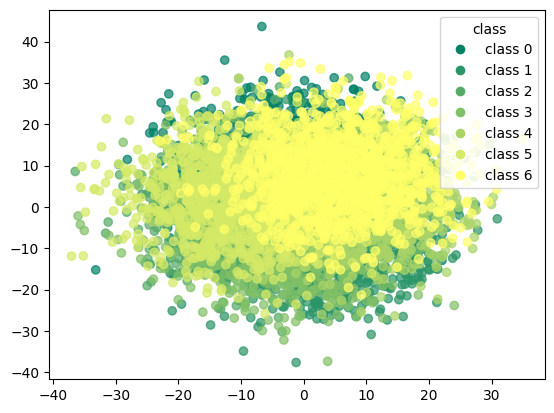

In [1208]:
scatter = plt.scatter(df_trim_kmeans.iloc[:, 0], df_trim_kmeans.iloc[:, 1], 
                      c=df_trim_kmeans['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_trim_kmeans['target'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements, title="class")
plt.show()

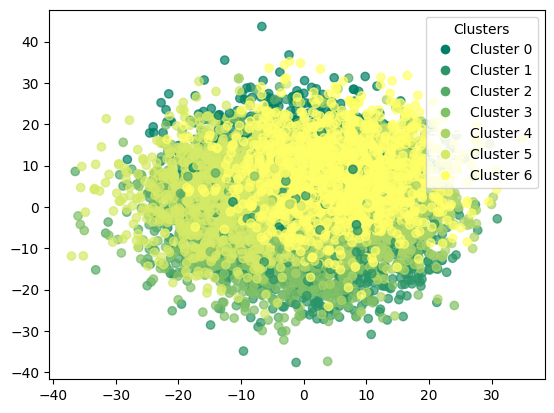

In [1209]:
scatter = plt.scatter(df_trim_kmeans.iloc[:, 0], df_trim_kmeans.iloc[:, 1], 
                      c=df_trim_kmeans['trim_kmeans'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_trim_kmeans['trim_kmeans'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

In [1210]:
print(confusion_matrix(df_trim_kmeans['target'],df_trim_kmeans['trim_kmeans']))

[[1173    2   17   14   53    9   12]
 [   2 1100   38   64   22   35   28]
 [  11   40 1181   13   22   17    2]
 [  13   54    9 1165   10    7   20]
 [  54   24   27   13 1105   15   47]
 [  12   34   24   15   16 1181   11]
 [  10   15    1   28   20   14 1197]]


In [1211]:
print(classification_report(df_trim_kmeans['target'],df_trim_kmeans['trim_kmeans']))

              precision    recall  f1-score   support

           0       0.92      0.92      0.92      1280
           1       0.87      0.85      0.86      1289
           2       0.91      0.92      0.91      1286
           3       0.89      0.91      0.90      1278
           4       0.89      0.86      0.87      1285
           5       0.92      0.91      0.92      1293
           6       0.91      0.93      0.92      1285

    accuracy                           0.90      8996
   macro avg       0.90      0.90      0.90      8996
weighted avg       0.90      0.90      0.90      8996



### trimmed k-means with pca

In [1212]:
trim_kmeans_pca,trimmmed_indices = trimmed_clustering(X_pca,n_clusters=7,trim_fraction=0.1)

In [1213]:
trim_kmeans_pca

KMeans(n_clusters=7, random_state=42)

In [1214]:
df_pca_trim_kmeans = corr_dataset.copy()

In [1215]:
df_pca_trim_kmeans = df_pca_trim_kmeans.iloc[trimmmed_indces]  

In [1216]:
df_pca_trim_kmeans["trim_kmeans_pca"] = trim_kmeans_pca.labels_

In [1217]:
df_pca_trim_kmeans

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,trim_kmeans_pca
1,-15.869938,30.712240,-0.025704,0.628227,-17.122823,18.190145,-0.849106,15.540172,-2.035509,5.398190,...,20.635088,-3.838711,0.645310,-7.577490,-11.899058,-5.253737,-6.015310,-18.292091,0,2
2,3.316589,8.227358,-7.540726,-7.554103,-20.017507,5.402220,-0.876915,16.187409,11.503358,7.266798,...,4.752239,0.735842,1.421823,-7.926857,-12.432923,5.163713,-0.165397,-0.865351,0,2
3,-8.785581,8.997587,14.979347,8.468662,4.665399,-5.067845,-6.632648,-0.394280,-1.918146,8.114945,...,0.289233,2.665186,-9.949996,-17.098222,2.250262,1.172018,8.048921,-14.501370,0,3
4,12.464566,8.084375,-5.661159,-10.314443,-9.338559,-21.631719,-3.503240,10.117544,1.547501,-1.978617,...,7.975446,-3.748869,-9.303115,-18.775814,2.284411,-3.585064,-0.298347,-0.286966,0,2
5,0.963753,6.333141,10.651524,8.606922,-4.334759,-8.715001,-1.909480,1.280557,5.993989,8.584965,...,3.479784,4.783514,3.232748,-17.454303,2.530796,4.703797,11.048583,6.020571,0,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9991,13.602651,12.648593,-4.732800,-11.572356,5.292685,15.708583,7.092831,18.167018,-3.220895,11.391614,...,1.435046,-20.917259,-1.677670,-8.697209,6.713519,1.937871,0.365403,-4.306066,6,4
9992,14.248154,4.176920,10.842006,9.077210,-3.409314,-4.760856,3.128806,-1.921522,-2.321112,-5.009046,...,-30.782598,-2.936667,15.868474,8.922822,-14.560461,12.943139,6.379438,15.065089,6,4
9993,6.828329,20.077587,7.990726,-16.197304,-8.602133,-11.404849,4.256457,18.669150,-19.029304,-12.182654,...,-3.038526,3.793316,26.509104,-0.027349,-0.629210,-4.523955,-2.546196,18.075697,6,4
9994,7.850504,9.102936,8.316825,4.925269,3.083185,9.232224,-1.591306,19.958951,-10.621306,-6.009115,...,-2.341835,-2.623850,-9.134532,-0.850230,-3.572674,-15.113896,-15.954749,4.366197,6,1


In [1218]:
y_true = df_pca_trim_kmeans['target'].values  
y_kmeans = df_pca_trim_kmeans['trim_kmeans_pca'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_pca_trim_kmeans['trim_kmeans_pca'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_pca_trim_kmeans['trim_kmeans_pca'] == y_true))

accuracy before: 0.05580257892396621
accuracy after: 0.6987550022232103


In [1219]:
df_pca_trim_kmeans

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,trim_kmeans_pca
1,-15.869938,30.712240,-0.025704,0.628227,-17.122823,18.190145,-0.849106,15.540172,-2.035509,5.398190,...,20.635088,-3.838711,0.645310,-7.577490,-11.899058,-5.253737,-6.015310,-18.292091,0,0
2,3.316589,8.227358,-7.540726,-7.554103,-20.017507,5.402220,-0.876915,16.187409,11.503358,7.266798,...,4.752239,0.735842,1.421823,-7.926857,-12.432923,5.163713,-0.165397,-0.865351,0,0
3,-8.785581,8.997587,14.979347,8.468662,4.665399,-5.067845,-6.632648,-0.394280,-1.918146,8.114945,...,0.289233,2.665186,-9.949996,-17.098222,2.250262,1.172018,8.048921,-14.501370,0,4
4,12.464566,8.084375,-5.661159,-10.314443,-9.338559,-21.631719,-3.503240,10.117544,1.547501,-1.978617,...,7.975446,-3.748869,-9.303115,-18.775814,2.284411,-3.585064,-0.298347,-0.286966,0,0
5,0.963753,6.333141,10.651524,8.606922,-4.334759,-8.715001,-1.909480,1.280557,5.993989,8.584965,...,3.479784,4.783514,3.232748,-17.454303,2.530796,4.703797,11.048583,6.020571,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9991,13.602651,12.648593,-4.732800,-11.572356,5.292685,15.708583,7.092831,18.167018,-3.220895,11.391614,...,1.435046,-20.917259,-1.677670,-8.697209,6.713519,1.937871,0.365403,-4.306066,6,6
9992,14.248154,4.176920,10.842006,9.077210,-3.409314,-4.760856,3.128806,-1.921522,-2.321112,-5.009046,...,-30.782598,-2.936667,15.868474,8.922822,-14.560461,12.943139,6.379438,15.065089,6,6
9993,6.828329,20.077587,7.990726,-16.197304,-8.602133,-11.404849,4.256457,18.669150,-19.029304,-12.182654,...,-3.038526,3.793316,26.509104,-0.027349,-0.629210,-4.523955,-2.546196,18.075697,6,6
9994,7.850504,9.102936,8.316825,4.925269,3.083185,9.232224,-1.591306,19.958951,-10.621306,-6.009115,...,-2.341835,-2.623850,-9.134532,-0.850230,-3.572674,-15.113896,-15.954749,4.366197,6,3


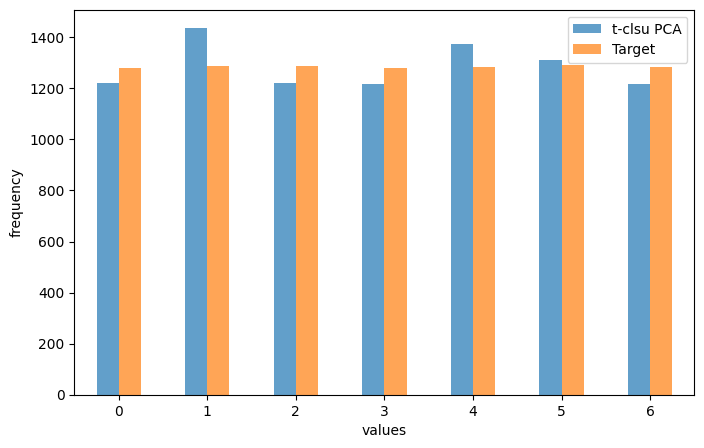

In [1220]:
counts_kmeans = df_pca_trim_kmeans['trim_kmeans_pca'].value_counts().sort_index()
counts_target = df_pca_trim_kmeans['target'].value_counts().sort_index()

df_counts = pd.DataFrame({'t-clust PCA': counts_kmeans, 'Target': counts_target}).fillna(0)

df_counts.plot(kind='bar', figsize=(8, 5), alpha=0.7)
plt.xlabel("values")
plt.ylabel("frequency")
plt.legend(["t-clsu PCA", "Target"])
plt.xticks(rotation=0)  
plt.show()


In [1221]:
print(confusion_matrix(df_pca_trim_kmeans['target'],df_pca_trim_kmeans['trim_kmeans_pca']))

[[1066   38   11   10  122   30    3]
 [   0  895  116   78   51  125   24]
 [   6   76  964   43   76  119    2]
 [  15  122   10  757   52  294   28]
 [ 106   54   61   22  885   34  123]
 [  22  215   54  240   61  692    9]
 [   4   36    5   68  128   17 1027]]


In [1222]:
print(classification_report(df_pca_trim_kmeans['target'],df_pca_trim_kmeans['trim_kmeans_pca']))

              precision    recall  f1-score   support

           0       0.87      0.83      0.85      1280
           1       0.62      0.69      0.66      1289
           2       0.79      0.75      0.77      1286
           3       0.62      0.59      0.61      1278
           4       0.64      0.69      0.67      1285
           5       0.53      0.54      0.53      1293
           6       0.84      0.80      0.82      1285

    accuracy                           0.70      8996
   macro avg       0.70      0.70      0.70      8996
weighted avg       0.70      0.70      0.70      8996



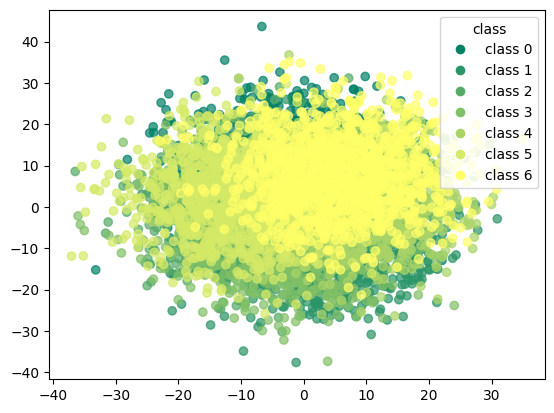

In [1223]:
scatter = plt.scatter(df_pca_trim_kmeans.iloc[:, 0], df_pca_trim_kmeans.iloc[:, 1], 
                      c=df_pca_trim_kmeans['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_pca_trim_kmeans['target'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements, title="class")
plt.show()

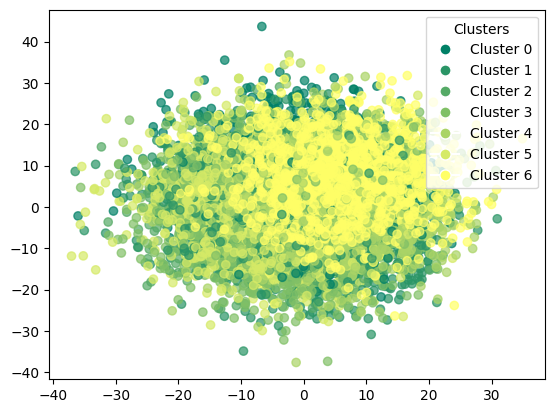

In [1224]:
scatter = plt.scatter(df_pca_trim_kmeans.iloc[:, 0], df_pca_trim_kmeans.iloc[:, 1], 
                      c=df_pca_trim_kmeans['trim_kmeans_pca'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_pca_trim_kmeans['trim_kmeans_pca'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

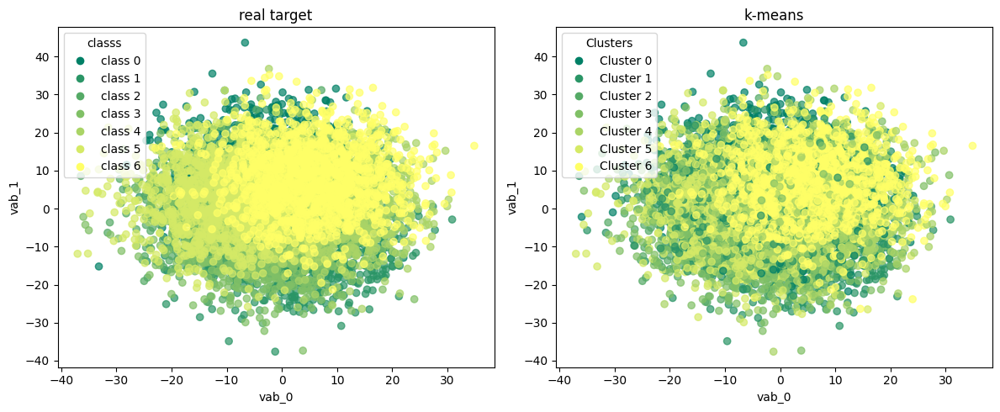

In [1225]:
fig, axes = plt.subplots(1, 2, figsize=(12, 5))  

scatter1 = axes[0].scatter(df_pca_trim_kmeans.iloc[:, 0], df_pca_trim_kmeans.iloc[:, 1], 
                           c=df_pca_trim_kmeans['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_pca_trim_kmeans['target'])
legend_elements1 = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',
                           markerfacecolor=scatter1.cmap(scatter1.norm(label)), markersize=8) 
                    for label in unique_labels]
axes[0].legend(handles=legend_elements1, title="classs")
axes[0].set_title("real target")

scatter2 = axes[1].scatter(df_pca_trim_kmeans.iloc[:, 0], df_pca_trim_kmeans.iloc[:, 1], 
                           c=df_pca_trim_kmeans['trim_kmeans_pca'], cmap='summer', alpha=0.7)

unique_clusters = np.unique(df_pca_trim_kmeans['trim_kmeans_pca'])
legend_elements2 = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                           markerfacecolor=scatter2.cmap(scatter2.norm(cluster)), markersize=8) 
                    for cluster in unique_clusters]
axes[1].legend(handles=legend_elements2, title="Clusters")
axes[1].set_title("k-means")

for ax in axes:
    ax.set_xlabel("vab_0")
    ax.set_ylabel("vab_1")

plt.tight_layout()  
plt.show()

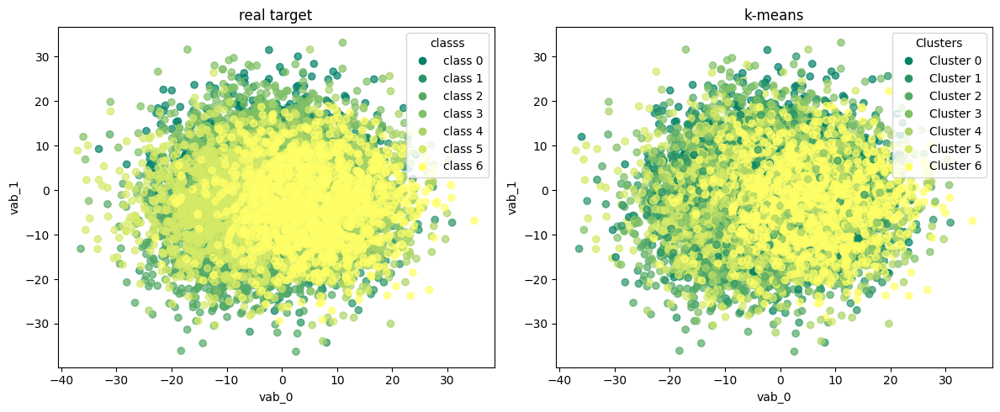

In [1226]:
fig, axes = plt.subplots(1, 2, figsize=(12, 5))  

scatter1 = axes[0].scatter(df_pca_trim_kmeans.iloc[:, 0], df_pca_trim_kmeans.iloc[:, 2], 
                           c=df_pca_trim_kmeans['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_pca_trim_kmeans['target'])
legend_elements1 = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',
                           markerfacecolor=scatter1.cmap(scatter1.norm(label)), markersize=8) 
                    for label in unique_labels]
axes[0].legend(handles=legend_elements1, title="classs")
axes[0].set_title("real target")

scatter2 = axes[1].scatter(df_pca_trim_kmeans.iloc[:, 0], df_pca_trim_kmeans.iloc[:, 2], 
                           c=df_pca_trim_kmeans['trim_kmeans_pca'], cmap='summer', alpha=0.7)

unique_clusters = np.unique(df_pca_trim_kmeans['trim_kmeans_pca'])
legend_elements2 = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                           markerfacecolor=scatter2.cmap(scatter2.norm(cluster)), markersize=8) 
                    for cluster in unique_clusters]
axes[1].legend(handles=legend_elements2, title="Clusters")
axes[1].set_title("k-means")

for ax in axes:
    ax.set_xlabel("vab_0")
    ax.set_ylabel("vab_1")

plt.tight_layout()  
plt.show()

### trimmed k-means with t-SNE

In [1227]:
trim_kmeans_tsne,trimmmed_indices = trimmed_clustering(X_tsne,n_clusters=7,trim_fraction=0.1)

In [1228]:
trim_kmeans_tsne

KMeans(n_clusters=7, random_state=42)

In [1229]:
df_tsne_trim_kmeans = corr_dataset.copy()

In [1230]:
df_tsne_trim_kmeans = df_tsne_trim_kmeans.iloc[trimmmed_indces]  

In [1231]:
df_tsne_trim_kmeans['trim_kmeans_tsne'] = trim_kmeans_tsne.labels_

In [1232]:
df_tsne_trim_kmeans

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,trim_kmeans_tsne
1,-15.869938,30.712240,-0.025704,0.628227,-17.122823,18.190145,-0.849106,15.540172,-2.035509,5.398190,...,20.635088,-3.838711,0.645310,-7.577490,-11.899058,-5.253737,-6.015310,-18.292091,0,2
2,3.316589,8.227358,-7.540726,-7.554103,-20.017507,5.402220,-0.876915,16.187409,11.503358,7.266798,...,4.752239,0.735842,1.421823,-7.926857,-12.432923,5.163713,-0.165397,-0.865351,0,2
3,-8.785581,8.997587,14.979347,8.468662,4.665399,-5.067845,-6.632648,-0.394280,-1.918146,8.114945,...,0.289233,2.665186,-9.949996,-17.098222,2.250262,1.172018,8.048921,-14.501370,0,0
4,12.464566,8.084375,-5.661159,-10.314443,-9.338559,-21.631719,-3.503240,10.117544,1.547501,-1.978617,...,7.975446,-3.748869,-9.303115,-18.775814,2.284411,-3.585064,-0.298347,-0.286966,0,2
5,0.963753,6.333141,10.651524,8.606922,-4.334759,-8.715001,-1.909480,1.280557,5.993989,8.584965,...,3.479784,4.783514,3.232748,-17.454303,2.530796,4.703797,11.048583,6.020571,0,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9991,13.602651,12.648593,-4.732800,-11.572356,5.292685,15.708583,7.092831,18.167018,-3.220895,11.391614,...,1.435046,-20.917259,-1.677670,-8.697209,6.713519,1.937871,0.365403,-4.306066,6,3
9992,14.248154,4.176920,10.842006,9.077210,-3.409314,-4.760856,3.128806,-1.921522,-2.321112,-5.009046,...,-30.782598,-2.936667,15.868474,8.922822,-14.560461,12.943139,6.379438,15.065089,6,3
9993,6.828329,20.077587,7.990726,-16.197304,-8.602133,-11.404849,4.256457,18.669150,-19.029304,-12.182654,...,-3.038526,3.793316,26.509104,-0.027349,-0.629210,-4.523955,-2.546196,18.075697,6,3
9994,7.850504,9.102936,8.316825,4.925269,3.083185,9.232224,-1.591306,19.958951,-10.621306,-6.009115,...,-2.341835,-2.623850,-9.134532,-0.850230,-3.572674,-15.113896,-15.954749,4.366197,6,1


In [1233]:
y_true = df_tsne_trim_kmeans['target'].values  
y_kmeans = df_tsne_trim_kmeans['trim_kmeans_tsne'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_tsne_trim_kmeans['trim_kmeans_tsne'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_tsne_trim_kmeans['trim_kmeans_tsne'] == y_true))

accuracy before: 0.0344597598932859
accuracy after: 0.762338817252112


In [1234]:
df_tsne_trim_kmeans

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,trim_kmeans_tsne
1,-15.869938,30.712240,-0.025704,0.628227,-17.122823,18.190145,-0.849106,15.540172,-2.035509,5.398190,...,20.635088,-3.838711,0.645310,-7.577490,-11.899058,-5.253737,-6.015310,-18.292091,0,0
2,3.316589,8.227358,-7.540726,-7.554103,-20.017507,5.402220,-0.876915,16.187409,11.503358,7.266798,...,4.752239,0.735842,1.421823,-7.926857,-12.432923,5.163713,-0.165397,-0.865351,0,0
3,-8.785581,8.997587,14.979347,8.468662,4.665399,-5.067845,-6.632648,-0.394280,-1.918146,8.114945,...,0.289233,2.665186,-9.949996,-17.098222,2.250262,1.172018,8.048921,-14.501370,0,4
4,12.464566,8.084375,-5.661159,-10.314443,-9.338559,-21.631719,-3.503240,10.117544,1.547501,-1.978617,...,7.975446,-3.748869,-9.303115,-18.775814,2.284411,-3.585064,-0.298347,-0.286966,0,0
5,0.963753,6.333141,10.651524,8.606922,-4.334759,-8.715001,-1.909480,1.280557,5.993989,8.584965,...,3.479784,4.783514,3.232748,-17.454303,2.530796,4.703797,11.048583,6.020571,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9991,13.602651,12.648593,-4.732800,-11.572356,5.292685,15.708583,7.092831,18.167018,-3.220895,11.391614,...,1.435046,-20.917259,-1.677670,-8.697209,6.713519,1.937871,0.365403,-4.306066,6,6
9992,14.248154,4.176920,10.842006,9.077210,-3.409314,-4.760856,3.128806,-1.921522,-2.321112,-5.009046,...,-30.782598,-2.936667,15.868474,8.922822,-14.560461,12.943139,6.379438,15.065089,6,6
9993,6.828329,20.077587,7.990726,-16.197304,-8.602133,-11.404849,4.256457,18.669150,-19.029304,-12.182654,...,-3.038526,3.793316,26.509104,-0.027349,-0.629210,-4.523955,-2.546196,18.075697,6,6
9994,7.850504,9.102936,8.316825,4.925269,3.083185,9.232224,-1.591306,19.958951,-10.621306,-6.009115,...,-2.341835,-2.623850,-9.134532,-0.850230,-3.572674,-15.113896,-15.954749,4.366197,6,3


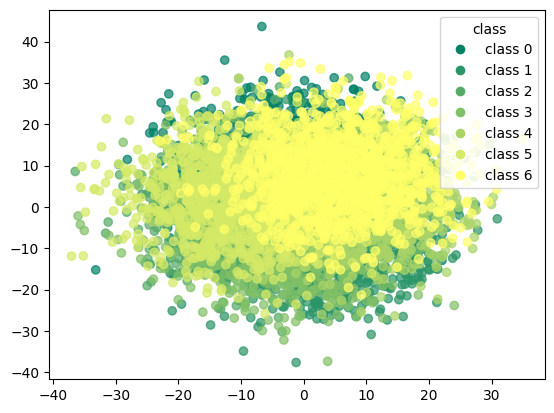

In [1235]:
scatter = plt.scatter(df_tsne_trim_kmeans.iloc[:, 0], df_tsne_trim_kmeans.iloc[:, 1], 
                      c=df_tsne_trim_kmeans['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_tsne_trim_kmeans['target'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements, title="class")
plt.show()

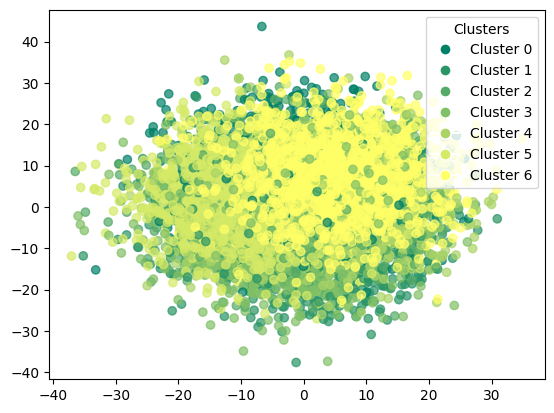

In [1236]:
scatter = plt.scatter(df_tsne_trim_kmeans.iloc[:, 0], df_tsne_trim_kmeans.iloc[:, 1], 
                      c=df_tsne_trim_kmeans['trim_kmeans_tsne'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_tsne_trim_kmeans['trim_kmeans_tsne'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

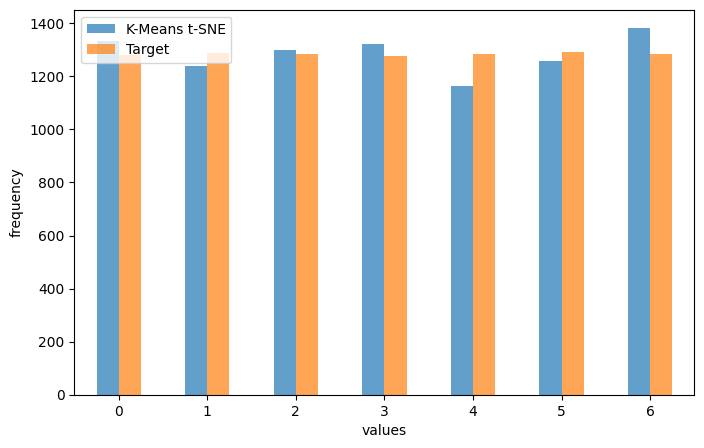

In [1237]:
counts_kmeans = df_tsne_trim_kmeans['trim_kmeans_tsne'].value_counts().sort_index()
counts_target = df_tsne_trim_kmeans['target'].value_counts().sort_index()

df_counts = pd.DataFrame({'K-Means t-SNE': counts_kmeans, 'Target': counts_target}).fillna(0)

df_counts.plot(kind='bar', figsize=(8, 5), alpha=0.7)
plt.xlabel("values")
plt.ylabel("frequency")
plt.legend(["K-Means t-SNE", "Target"])
plt.xticks(rotation=0)  
plt.show()

In [1238]:
print(confusion_matrix(df_tsne_trim_kmeans['target'],df_tsne_trim_kmeans['trim_kmeans_tsne']))

[[1145    1   10   17   80    4   23]
 [   2  945  100   89   55   57   41]
 [   6   52  886   20  208  107    7]
 [   7  165   13  991   30   10   62]
 [ 149   12  239   75  699    2  109]
 [  11   54   34   37   63 1073   21]
 [  12    9   17   94   29    5 1119]]


In [1239]:
print(classification_report(df_tsne_trim_kmeans['target'],df_tsne_trim_kmeans['trim_kmeans_tsne'])) 

              precision    recall  f1-score   support

           0       0.86      0.89      0.88      1280
           1       0.76      0.73      0.75      1289
           2       0.68      0.69      0.69      1286
           3       0.75      0.78      0.76      1278
           4       0.60      0.54      0.57      1285
           5       0.85      0.83      0.84      1293
           6       0.81      0.87      0.84      1285

    accuracy                           0.76      8996
   macro avg       0.76      0.76      0.76      8996
weighted avg       0.76      0.76      0.76      8996



### trimmed k-means with umap

In [1240]:
trim_kmeans_umap,trimmmed_indices = trimmed_clustering(X_umap,n_clusters=7,trim_fraction=0.1)

In [1241]:
trim_kmeans_umap

KMeans(n_clusters=7, random_state=42)

In [1242]:
df_umap_trim_kmeans = corr_dataset.copy()

In [1243]:
df_umap_trim_kmeans = df_umap_trim_kmeans.iloc[trimmmed_indices]

In [1244]:
df_umap_trim_kmeans['trim_kmeans_umap'] = trim_kmeans_umap.labels_

In [1245]:
df_umap_trim_kmeans

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,trim_kmeans_umap
0,1.135599,-10.400164,22.240662,-14.375857,0.285828,-9.783858,-26.381334,-4.637778,-2.740705,1.743482,...,11.350963,-31.249533,-9.930586,-0.504532,-11.931650,-10.868683,-9.337304,-14.927016,0,2
1,-15.869938,30.712240,-0.025704,0.628227,-17.122823,18.190145,-0.849106,15.540172,-2.035509,5.398190,...,20.635088,-3.838711,0.645310,-7.577490,-11.899058,-5.253737,-6.015310,-18.292091,0,2
2,3.316589,8.227358,-7.540726,-7.554103,-20.017507,5.402220,-0.876915,16.187409,11.503358,7.266798,...,4.752239,0.735842,1.421823,-7.926857,-12.432923,5.163713,-0.165397,-0.865351,0,4
3,-8.785581,8.997587,14.979347,8.468662,4.665399,-5.067845,-6.632648,-0.394280,-1.918146,8.114945,...,0.289233,2.665186,-9.949996,-17.098222,2.250262,1.172018,8.048921,-14.501370,0,2
4,12.464566,8.084375,-5.661159,-10.314443,-9.338559,-21.631719,-3.503240,10.117544,1.547501,-1.978617,...,7.975446,-3.748869,-9.303115,-18.775814,2.284411,-3.585064,-0.298347,-0.286966,0,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9990,-5.382800,-3.463523,-20.546928,1.182095,-8.365253,-14.886715,11.457938,20.846830,-9.775785,5.065203,...,-10.137309,-15.056012,10.369359,6.850651,-3.422073,11.572617,16.914060,21.391064,6,1
9991,13.602651,12.648593,-4.732800,-11.572356,5.292685,15.708583,7.092831,18.167018,-3.220895,11.391614,...,1.435046,-20.917259,-1.677670,-8.697209,6.713519,1.937871,0.365403,-4.306066,6,1
9992,14.248154,4.176920,10.842006,9.077210,-3.409314,-4.760856,3.128806,-1.921522,-2.321112,-5.009046,...,-30.782598,-2.936667,15.868474,8.922822,-14.560461,12.943139,6.379438,15.065089,6,1
9993,6.828329,20.077587,7.990726,-16.197304,-8.602133,-11.404849,4.256457,18.669150,-19.029304,-12.182654,...,-3.038526,3.793316,26.509104,-0.027349,-0.629210,-4.523955,-2.546196,18.075697,6,1


In [1246]:
y_true = df_umap_trim_kmeans['target'].values  
y_kmeans = df_umap_trim_kmeans['trim_kmeans_umap'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_umap_trim_kmeans['trim_kmeans_umap'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_umap_trim_kmeans['trim_kmeans_umap'] == y_true))

accuracy before: 0.12894619831036017
accuracy after: 0.9104046242774566


In [1247]:
df_umap_trim_kmeans

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,trim_kmeans_umap
0,1.135599,-10.400164,22.240662,-14.375857,0.285828,-9.783858,-26.381334,-4.637778,-2.740705,1.743482,...,11.350963,-31.249533,-9.930586,-0.504532,-11.931650,-10.868683,-9.337304,-14.927016,0,0
1,-15.869938,30.712240,-0.025704,0.628227,-17.122823,18.190145,-0.849106,15.540172,-2.035509,5.398190,...,20.635088,-3.838711,0.645310,-7.577490,-11.899058,-5.253737,-6.015310,-18.292091,0,0
2,3.316589,8.227358,-7.540726,-7.554103,-20.017507,5.402220,-0.876915,16.187409,11.503358,7.266798,...,4.752239,0.735842,1.421823,-7.926857,-12.432923,5.163713,-0.165397,-0.865351,0,4
3,-8.785581,8.997587,14.979347,8.468662,4.665399,-5.067845,-6.632648,-0.394280,-1.918146,8.114945,...,0.289233,2.665186,-9.949996,-17.098222,2.250262,1.172018,8.048921,-14.501370,0,0
4,12.464566,8.084375,-5.661159,-10.314443,-9.338559,-21.631719,-3.503240,10.117544,1.547501,-1.978617,...,7.975446,-3.748869,-9.303115,-18.775814,2.284411,-3.585064,-0.298347,-0.286966,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9990,-5.382800,-3.463523,-20.546928,1.182095,-8.365253,-14.886715,11.457938,20.846830,-9.775785,5.065203,...,-10.137309,-15.056012,10.369359,6.850651,-3.422073,11.572617,16.914060,21.391064,6,6
9991,13.602651,12.648593,-4.732800,-11.572356,5.292685,15.708583,7.092831,18.167018,-3.220895,11.391614,...,1.435046,-20.917259,-1.677670,-8.697209,6.713519,1.937871,0.365403,-4.306066,6,6
9992,14.248154,4.176920,10.842006,9.077210,-3.409314,-4.760856,3.128806,-1.921522,-2.321112,-5.009046,...,-30.782598,-2.936667,15.868474,8.922822,-14.560461,12.943139,6.379438,15.065089,6,6
9993,6.828329,20.077587,7.990726,-16.197304,-8.602133,-11.404849,4.256457,18.669150,-19.029304,-12.182654,...,-3.038526,3.793316,26.509104,-0.027349,-0.629210,-4.523955,-2.546196,18.075697,6,6


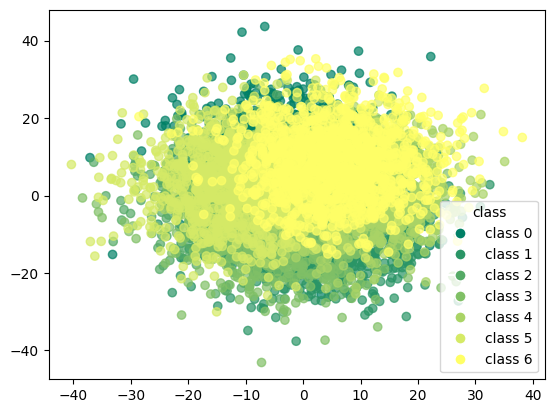

In [1248]:
scatter = plt.scatter(df_umap_trim_kmeans.iloc[:, 0], df_umap_trim_kmeans.iloc[:, 1], 
                      c=df_umap_trim_kmeans['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_umap_trim_kmeans['target'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements, title="class")
plt.show()

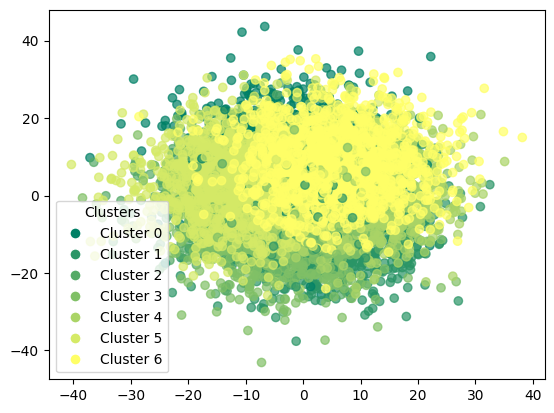

In [1249]:
scatter = plt.scatter(df_umap_trim_kmeans.iloc[:, 0], df_umap_trim_kmeans.iloc[:, 1], 
                      c=df_umap_trim_kmeans['trim_kmeans_umap'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_umap_trim_kmeans['trim_kmeans_umap'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

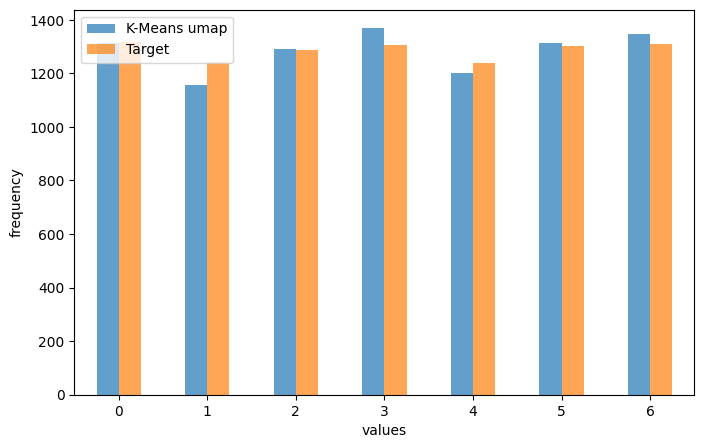

In [1250]:
counts_kmeans = df_umap_trim_kmeans['trim_kmeans_umap'].value_counts().sort_index()
counts_target = df_umap_trim_kmeans['target'].value_counts().sort_index()

df_counts = pd.DataFrame({'K-Means umap': counts_kmeans, 'Target': counts_target}).fillna(0)

df_counts.plot(kind='bar', figsize=(8, 5), alpha=0.7)
plt.xlabel("values")
plt.ylabel("frequency")
plt.legend(["K-Means umap", "Target"])
plt.xticks(rotation=0)  
plt.show()

In [1251]:
print(confusion_matrix(df_umap_trim_kmeans['target'],df_umap_trim_kmeans['trim_kmeans_umap']))

[[1219    3   11   13   53    6   13]
 [   1 1042   35   88   21   33   21]
 [   6   23 1204   16   14   19    4]
 [  12   39    7 1205   14    6   21]
 [  61   11   22   11 1068   12   53]
 [   8   25   13   13   12 1223    7]
 [   7   14    0   23   21   14 1229]]


In [1252]:
print(classification_report(df_umap_trim_kmeans['target'],df_umap_trim_kmeans['trim_kmeans_umap'])) 

              precision    recall  f1-score   support

           0       0.93      0.92      0.93      1318
           1       0.90      0.84      0.87      1241
           2       0.93      0.94      0.93      1286
           3       0.88      0.92      0.90      1304
           4       0.89      0.86      0.88      1238
           5       0.93      0.94      0.94      1301
           6       0.91      0.94      0.93      1308

    accuracy                           0.91      8996
   macro avg       0.91      0.91      0.91      8996
weighted avg       0.91      0.91      0.91      8996



## dbscan

In [1253]:
def plot_k_distance_graph(X, k):
    neigh = NearestNeighbors(n_neighbors=k)
    neigh.fit(X)
    distances, _ = neigh.kneighbors(X)
    distances = np.sort(distances[:, k-1])
    plt.figure(figsize=(10, 6))
    plt.plot(distances)
    plt.xlabel('Points')
    plt.ylabel(f'{k}-th nearest neighbor distance')
    plt.title('K-distance Graph')
    plt.show()

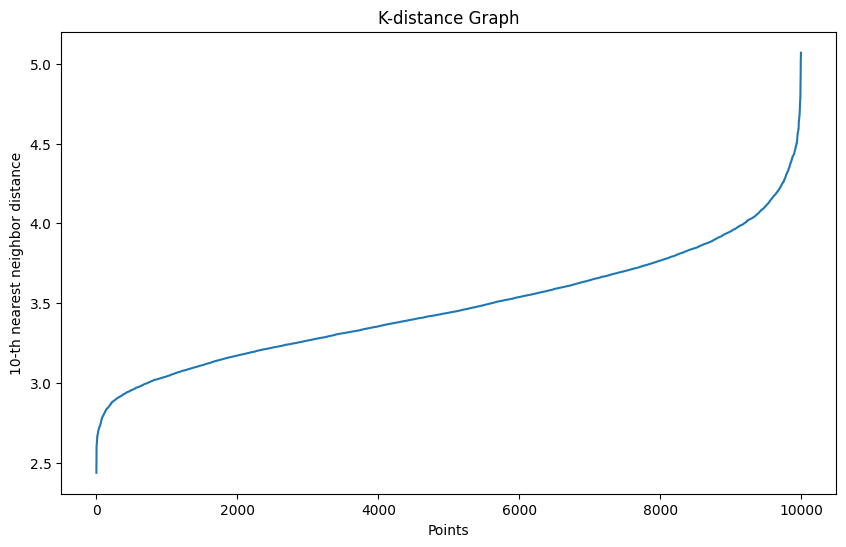

In [1254]:
plot_k_distance_graph(X_values,k=10) 

In [1255]:
dbscan = DBSCAN(eps=0.9,min_samples=10) # min_samples = 2*n_features

In [1256]:
dbscan.fit(X_values)

DBSCAN(eps=0.9, min_samples=10)

In [1257]:
df_dbscan = corr_dataset.copy()

In [1258]:
df_dbscan['dbscan'] = dbscan.labels_

In [1259]:
y_true = df_dbscan['target'].values  
y_kmeans = df_dbscan['dbscan'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_dbscan['dbscan'] = np.array([mapping[label] if label in mapping else -1 for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_dbscan['dbscan'] == y_true))

accuracy before: 0.0
accuracy after: 0.0


In [1260]:
df_dbscan

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,dbscan
0,1.135599,-10.400164,22.240662,-14.375857,0.285828,-9.783858,-26.381334,-4.637778,-2.740705,1.743482,...,11.350963,-31.249533,-9.930586,-0.504532,-11.931650,-10.868683,-9.337304,-14.927016,0,-1
1,-15.869938,30.712240,-0.025704,0.628227,-17.122823,18.190145,-0.849106,15.540172,-2.035509,5.398190,...,20.635088,-3.838711,0.645310,-7.577490,-11.899058,-5.253737,-6.015310,-18.292091,0,-1
2,3.316589,8.227358,-7.540726,-7.554103,-20.017507,5.402220,-0.876915,16.187409,11.503358,7.266798,...,4.752239,0.735842,1.421823,-7.926857,-12.432923,5.163713,-0.165397,-0.865351,0,-1
3,-8.785581,8.997587,14.979347,8.468662,4.665399,-5.067845,-6.632648,-0.394280,-1.918146,8.114945,...,0.289233,2.665186,-9.949996,-17.098222,2.250262,1.172018,8.048921,-14.501370,0,-1
4,12.464566,8.084375,-5.661159,-10.314443,-9.338559,-21.631719,-3.503240,10.117544,1.547501,-1.978617,...,7.975446,-3.748869,-9.303115,-18.775814,2.284411,-3.585064,-0.298347,-0.286966,0,-1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9991,13.602651,12.648593,-4.732800,-11.572356,5.292685,15.708583,7.092831,18.167018,-3.220895,11.391614,...,1.435046,-20.917259,-1.677670,-8.697209,6.713519,1.937871,0.365403,-4.306066,6,-1
9992,14.248154,4.176920,10.842006,9.077210,-3.409314,-4.760856,3.128806,-1.921522,-2.321112,-5.009046,...,-30.782598,-2.936667,15.868474,8.922822,-14.560461,12.943139,6.379438,15.065089,6,-1
9993,6.828329,20.077587,7.990726,-16.197304,-8.602133,-11.404849,4.256457,18.669150,-19.029304,-12.182654,...,-3.038526,3.793316,26.509104,-0.027349,-0.629210,-4.523955,-2.546196,18.075697,6,-1
9994,7.850504,9.102936,8.316825,4.925269,3.083185,9.232224,-1.591306,19.958951,-10.621306,-6.009115,...,-2.341835,-2.623850,-9.134532,-0.850230,-3.572674,-15.113896,-15.954749,4.366197,6,-1


In [1261]:
print(df_dbscan['dbscan'].value_counts())

dbscan
-1    9996
Name: count, dtype: int64


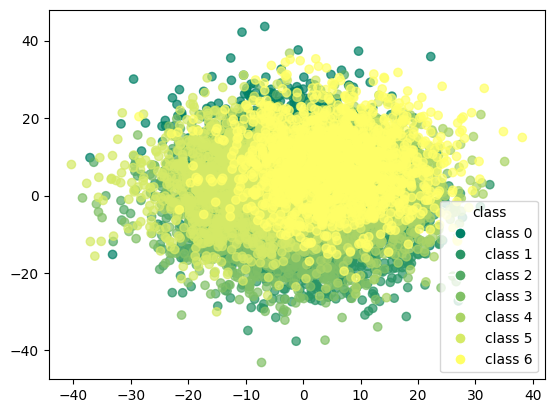

In [1262]:
scatter = plt.scatter(df_dbscan.iloc[:, 0], df_dbscan.iloc[:, 1], 
                      c=df_dbscan['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_dbscan['target'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements, title="class")
plt.show()

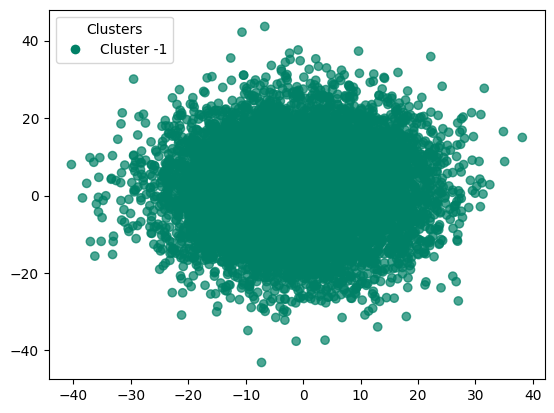

In [1263]:
scatter = plt.scatter(df_dbscan.iloc[:, 0], df_dbscan.iloc[:, 1], 
                      c=df_dbscan['dbscan'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_dbscan['dbscan'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

In [1264]:
print(confusion_matrix(df_dbscan['target'],df_dbscan['dbscan']))

[[   0    0    0    0    0    0    0    0]
 [1428    0    0    0    0    0    0    0]
 [1428    0    0    0    0    0    0    0]
 [1428    0    0    0    0    0    0    0]
 [1428    0    0    0    0    0    0    0]
 [1428    0    0    0    0    0    0    0]
 [1428    0    0    0    0    0    0    0]
 [1428    0    0    0    0    0    0    0]]


In [1265]:
print(classification_report(df_dbscan['target'],df_dbscan['dbscan']))

              precision    recall  f1-score   support

          -1       0.00      0.00      0.00       0.0
           0       0.00      0.00      0.00    1428.0
           1       0.00      0.00      0.00    1428.0
           2       0.00      0.00      0.00    1428.0
           3       0.00      0.00      0.00    1428.0
           4       0.00      0.00      0.00    1428.0
           5       0.00      0.00      0.00    1428.0
           6       0.00      0.00      0.00    1428.0

    accuracy                           0.00    9996.0
   macro avg       0.00      0.00      0.00    9996.0
weighted avg       0.00      0.00      0.00    9996.0



### dbscan with pca

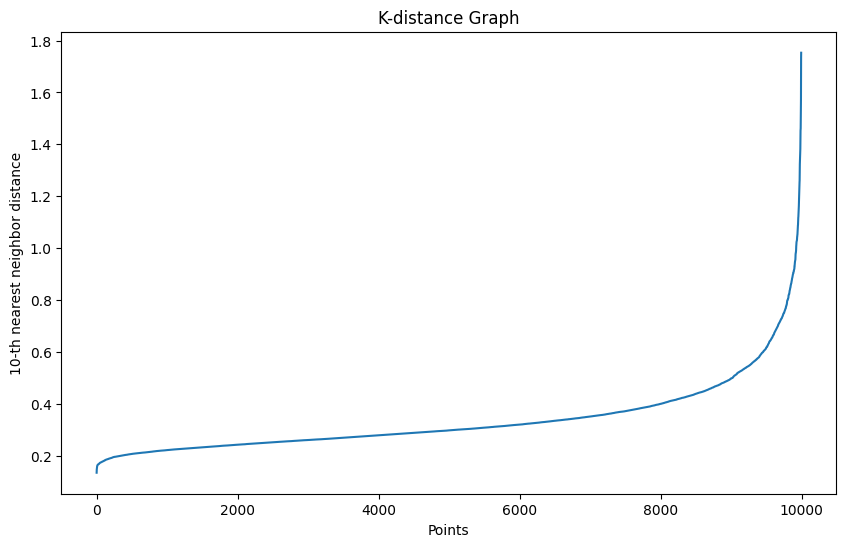

In [1266]:
plot_k_distance_graph(X_pca,k=10)

In [1267]:
dbscan_pca = DBSCAN(eps=0.4,min_samples=10)

In [1268]:
dbscan_pca.fit(X_pca)

DBSCAN(eps=0.4, min_samples=10)

In [1269]:
df_pca_dbscan = corr_dataset.copy()

In [1270]:
df_pca_dbscan["dbscan_pca"] = dbscan_pca.labels_

In [1271]:
y_true = df_pca_dbscan['target'].values  
y_kmeans = df_pca_dbscan['dbscan_pca'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_pca_dbscan['dbscan_pca'] = np.array([mapping[label] if label in mapping else -1 for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_pca_dbscan['dbscan_pca'] == y_true))

accuracy before: 0.12324929971988796
accuracy after: 0.13055222088835533


In [1272]:
df_pca_dbscan

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,dbscan_pca
0,1.135599,-10.400164,22.240662,-14.375857,0.285828,-9.783858,-26.381334,-4.637778,-2.740705,1.743482,...,11.350963,-31.249533,-9.930586,-0.504532,-11.931650,-10.868683,-9.337304,-14.927016,0,3
1,-15.869938,30.712240,-0.025704,0.628227,-17.122823,18.190145,-0.849106,15.540172,-2.035509,5.398190,...,20.635088,-3.838711,0.645310,-7.577490,-11.899058,-5.253737,-6.015310,-18.292091,0,3
2,3.316589,8.227358,-7.540726,-7.554103,-20.017507,5.402220,-0.876915,16.187409,11.503358,7.266798,...,4.752239,0.735842,1.421823,-7.926857,-12.432923,5.163713,-0.165397,-0.865351,0,3
3,-8.785581,8.997587,14.979347,8.468662,4.665399,-5.067845,-6.632648,-0.394280,-1.918146,8.114945,...,0.289233,2.665186,-9.949996,-17.098222,2.250262,1.172018,8.048921,-14.501370,0,3
4,12.464566,8.084375,-5.661159,-10.314443,-9.338559,-21.631719,-3.503240,10.117544,1.547501,-1.978617,...,7.975446,-3.748869,-9.303115,-18.775814,2.284411,-3.585064,-0.298347,-0.286966,0,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9991,13.602651,12.648593,-4.732800,-11.572356,5.292685,15.708583,7.092831,18.167018,-3.220895,11.391614,...,1.435046,-20.917259,-1.677670,-8.697209,6.713519,1.937871,0.365403,-4.306066,6,3
9992,14.248154,4.176920,10.842006,9.077210,-3.409314,-4.760856,3.128806,-1.921522,-2.321112,-5.009046,...,-30.782598,-2.936667,15.868474,8.922822,-14.560461,12.943139,6.379438,15.065089,6,3
9993,6.828329,20.077587,7.990726,-16.197304,-8.602133,-11.404849,4.256457,18.669150,-19.029304,-12.182654,...,-3.038526,3.793316,26.509104,-0.027349,-0.629210,-4.523955,-2.546196,18.075697,6,3
9994,7.850504,9.102936,8.316825,4.925269,3.083185,9.232224,-1.591306,19.958951,-10.621306,-6.009115,...,-2.341835,-2.623850,-9.134532,-0.850230,-3.572674,-15.113896,-15.954749,4.366197,6,3


In [1273]:
print(df_pca_dbscan['dbscan_pca'].value_counts())

dbscan_pca
 3    8955
-1    1025
 6      16
Name: count, dtype: int64


In [1274]:
print(confusion_matrix(df_pca_dbscan['target'],df_pca_dbscan['dbscan_pca']))

[[   0    0    0    0    0    0    0    0]
 [ 196    0    0    0 1232    0    0    0]
 [ 118    0    0    0 1310    0    0    0]
 [ 210    0    0    0 1218    0    0    0]
 [ 139    0    0    0 1289    0    0    0]
 [ 109    0    0    0 1319    0    0    0]
 [  53    0    0    0 1375    0    0    0]
 [ 200    0    0    0 1212    0    0   16]]


In [1275]:
print(classification_report(df_pca_dbscan['target'],df_pca_dbscan['dbscan_pca']))

              precision    recall  f1-score   support

          -1       0.00      0.00      0.00         0
           0       0.00      0.00      0.00      1428
           1       0.00      0.00      0.00      1428
           2       0.00      0.00      0.00      1428
           3       0.14      0.90      0.25      1428
           4       0.00      0.00      0.00      1428
           5       0.00      0.00      0.00      1428
           6       1.00      0.01      0.02      1428

    accuracy                           0.13      9996
   macro avg       0.14      0.11      0.03      9996
weighted avg       0.16      0.13      0.04      9996



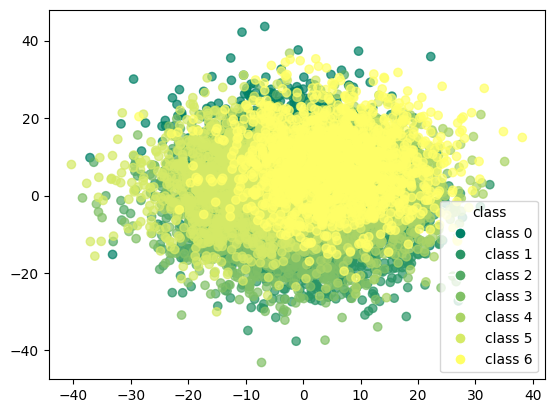

In [1276]:
scatter = plt.scatter(df_pca_dbscan.iloc[:, 0], df_pca_dbscan.iloc[:, 1], 
                      c=df_pca_dbscan['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_pca_dbscan['target'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements, title="class")
plt.show()

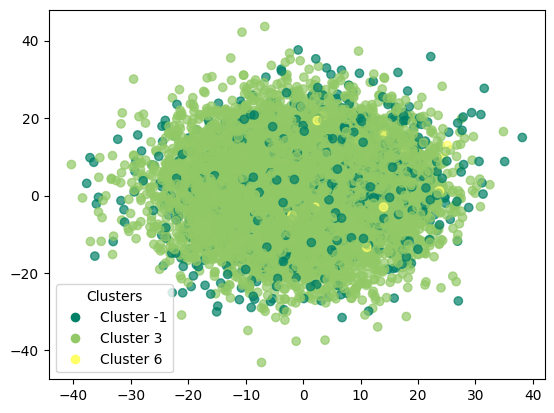

In [1277]:
scatter = plt.scatter(df_pca_dbscan.iloc[:, 0], df_pca_dbscan.iloc[:, 1], 
                      c=df_pca_dbscan['dbscan_pca'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_pca_dbscan['dbscan_pca'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

### dbscan with t-SNE

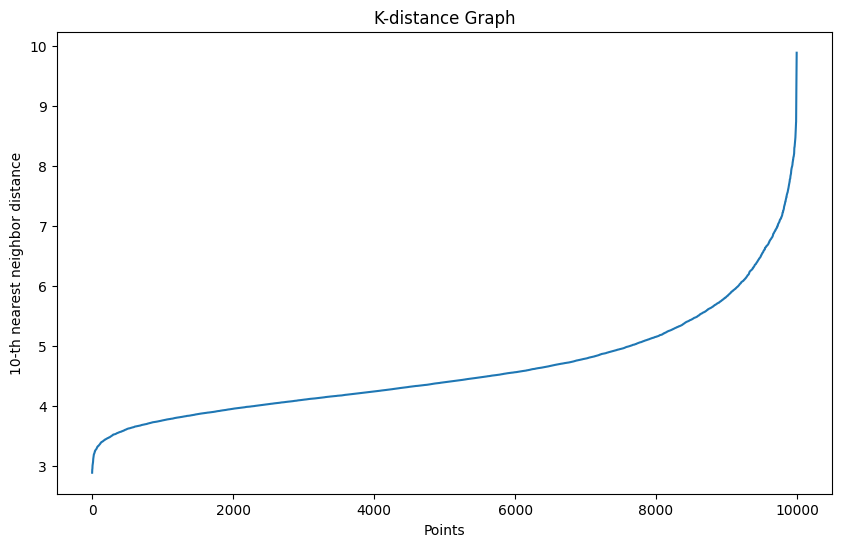

In [1278]:
plot_k_distance_graph(X_tsne,k=10)

In [1279]:
dbscan_tsne = DBSCAN(eps=3,min_samples=10)

In [1280]:
dbscan_tsne.fit(X_tsne)

DBSCAN(eps=3, min_samples=10)

In [1281]:
df_tsne_dbscan = corr_dataset.copy()

In [1282]:
df_tsne_dbscan['dbscan_tsne'] = dbscan_tsne.labels_

In [1283]:
y_true = df_tsne_dbscan['target'].values  
y_kmeans = df_tsne_dbscan['dbscan_tsne'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_tsne_dbscan['dbscan_tsne'] = np.array([mapping[label] if label in mapping else -1 for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_tsne_dbscan['dbscan_tsne'] == y_true))

accuracy before: 0.001800720288115246
accuracy after: 0.001800720288115246


In [1284]:
df_tsne_dbscan

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,dbscan_tsne
0,1.135599,-10.400164,22.240662,-14.375857,0.285828,-9.783858,-26.381334,-4.637778,-2.740705,1.743482,...,11.350963,-31.249533,-9.930586,-0.504532,-11.931650,-10.868683,-9.337304,-14.927016,0,-1
1,-15.869938,30.712240,-0.025704,0.628227,-17.122823,18.190145,-0.849106,15.540172,-2.035509,5.398190,...,20.635088,-3.838711,0.645310,-7.577490,-11.899058,-5.253737,-6.015310,-18.292091,0,-1
2,3.316589,8.227358,-7.540726,-7.554103,-20.017507,5.402220,-0.876915,16.187409,11.503358,7.266798,...,4.752239,0.735842,1.421823,-7.926857,-12.432923,5.163713,-0.165397,-0.865351,0,-1
3,-8.785581,8.997587,14.979347,8.468662,4.665399,-5.067845,-6.632648,-0.394280,-1.918146,8.114945,...,0.289233,2.665186,-9.949996,-17.098222,2.250262,1.172018,8.048921,-14.501370,0,-1
4,12.464566,8.084375,-5.661159,-10.314443,-9.338559,-21.631719,-3.503240,10.117544,1.547501,-1.978617,...,7.975446,-3.748869,-9.303115,-18.775814,2.284411,-3.585064,-0.298347,-0.286966,0,-1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9991,13.602651,12.648593,-4.732800,-11.572356,5.292685,15.708583,7.092831,18.167018,-3.220895,11.391614,...,1.435046,-20.917259,-1.677670,-8.697209,6.713519,1.937871,0.365403,-4.306066,6,-1
9992,14.248154,4.176920,10.842006,9.077210,-3.409314,-4.760856,3.128806,-1.921522,-2.321112,-5.009046,...,-30.782598,-2.936667,15.868474,8.922822,-14.560461,12.943139,6.379438,15.065089,6,-1
9993,6.828329,20.077587,7.990726,-16.197304,-8.602133,-11.404849,4.256457,18.669150,-19.029304,-12.182654,...,-3.038526,3.793316,26.509104,-0.027349,-0.629210,-4.523955,-2.546196,18.075697,6,-1
9994,7.850504,9.102936,8.316825,4.925269,3.083185,9.232224,-1.591306,19.958951,-10.621306,-6.009115,...,-2.341835,-2.623850,-9.134532,-0.850230,-3.572674,-15.113896,-15.954749,4.366197,6,-1


In [1285]:
print(df_tsne_dbscan['dbscan_tsne'].value_counts())

dbscan_tsne
-1    9935
 1      11
 0      10
 2      10
 4      10
 6      10
 5      10
Name: count, dtype: int64


In [1286]:
print(confusion_matrix(df_tsne_dbscan['target'],df_tsne_dbscan['dbscan_tsne']))

[[   0    0    0    0    0    0    0    0]
 [1408   10    0   10    0    0    0    0]
 [1428    0    0    0    0    0    0    0]
 [1428    0    0    0    0    0    0    0]
 [1428    0    0    0    0    0    0    0]
 [1420    0    0    0    0    8    0    0]
 [1407    0   11    0    0    0    0   10]
 [1416    0    0    0    0    2   10    0]]


In [1287]:
print(classification_report(df_tsne_dbscan['target'],df_tsne_dbscan['dbscan_tsne']))

              precision    recall  f1-score   support

          -1       0.00      0.00      0.00         0
           0       1.00      0.01      0.01      1428
           1       0.00      0.00      0.00      1428
           2       0.00      0.00      0.00      1428
           3       0.00      0.00      0.00      1428
           4       0.80      0.01      0.01      1428
           5       0.00      0.00      0.00      1428
           6       0.00      0.00      0.00      1428

    accuracy                           0.00      9996
   macro avg       0.23      0.00      0.00      9996
weighted avg       0.26      0.00      0.00      9996



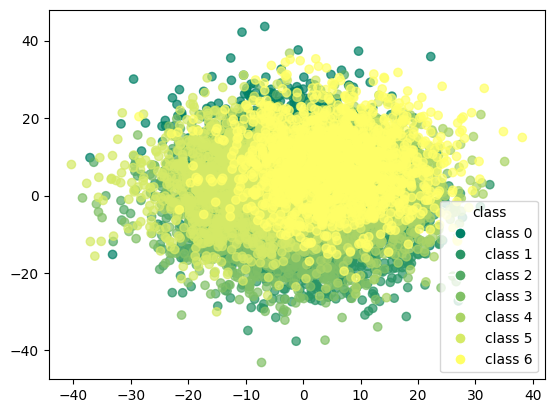

In [1288]:
scatter = plt.scatter(df_tsne_dbscan.iloc[:, 0], df_tsne_dbscan.iloc[:, 1], 
                      c=df_tsne_dbscan['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_tsne_dbscan['target'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements, title="class")
plt.show()

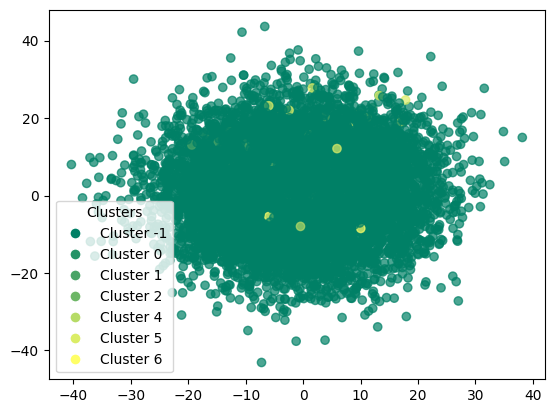

In [1289]:
scatter = plt.scatter(df_tsne_dbscan.iloc[:, 0], df_tsne_dbscan.iloc[:, 1], 
                      c=df_tsne_dbscan['dbscan_tsne'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_tsne_dbscan['dbscan_tsne'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

### dbscan with umap

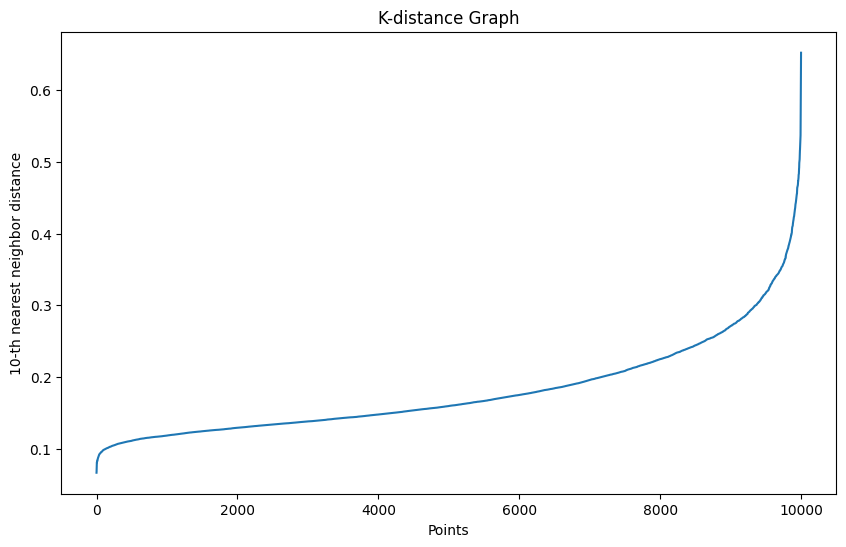

In [1290]:
plot_k_distance_graph(X_umap,k=10)

In [1291]:
dbscan_umap = DBSCAN(eps=0.6,min_samples=10)

In [1292]:
dbscan_umap.fit(X_umap)

DBSCAN(eps=0.6, min_samples=10)

In [1293]:
df_umap_dbscan = corr_dataset.copy()

In [1294]:
df_umap_dbscan['dbscan_umap'] = dbscan_umap.labels_

In [1295]:
y_true = df_umap_dbscan['target'].values  
y_kmeans = df_umap_dbscan['dbscan_umap'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_umap_dbscan['dbscan_umap'] = np.array([mapping[label] if label in mapping else -1 for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_umap_dbscan['dbscan_umap'] == y_true))

accuracy before: 0.14285714285714285
accuracy after: 0.14285714285714285


In [1296]:
df_umap_dbscan

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,dbscan_umap
0,1.135599,-10.400164,22.240662,-14.375857,0.285828,-9.783858,-26.381334,-4.637778,-2.740705,1.743482,...,11.350963,-31.249533,-9.930586,-0.504532,-11.931650,-10.868683,-9.337304,-14.927016,0,0
1,-15.869938,30.712240,-0.025704,0.628227,-17.122823,18.190145,-0.849106,15.540172,-2.035509,5.398190,...,20.635088,-3.838711,0.645310,-7.577490,-11.899058,-5.253737,-6.015310,-18.292091,0,0
2,3.316589,8.227358,-7.540726,-7.554103,-20.017507,5.402220,-0.876915,16.187409,11.503358,7.266798,...,4.752239,0.735842,1.421823,-7.926857,-12.432923,5.163713,-0.165397,-0.865351,0,0
3,-8.785581,8.997587,14.979347,8.468662,4.665399,-5.067845,-6.632648,-0.394280,-1.918146,8.114945,...,0.289233,2.665186,-9.949996,-17.098222,2.250262,1.172018,8.048921,-14.501370,0,0
4,12.464566,8.084375,-5.661159,-10.314443,-9.338559,-21.631719,-3.503240,10.117544,1.547501,-1.978617,...,7.975446,-3.748869,-9.303115,-18.775814,2.284411,-3.585064,-0.298347,-0.286966,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9991,13.602651,12.648593,-4.732800,-11.572356,5.292685,15.708583,7.092831,18.167018,-3.220895,11.391614,...,1.435046,-20.917259,-1.677670,-8.697209,6.713519,1.937871,0.365403,-4.306066,6,0
9992,14.248154,4.176920,10.842006,9.077210,-3.409314,-4.760856,3.128806,-1.921522,-2.321112,-5.009046,...,-30.782598,-2.936667,15.868474,8.922822,-14.560461,12.943139,6.379438,15.065089,6,0
9993,6.828329,20.077587,7.990726,-16.197304,-8.602133,-11.404849,4.256457,18.669150,-19.029304,-12.182654,...,-3.038526,3.793316,26.509104,-0.027349,-0.629210,-4.523955,-2.546196,18.075697,6,0
9994,7.850504,9.102936,8.316825,4.925269,3.083185,9.232224,-1.591306,19.958951,-10.621306,-6.009115,...,-2.341835,-2.623850,-9.134532,-0.850230,-3.572674,-15.113896,-15.954749,4.366197,6,0


In [1297]:
print(df_umap_dbscan['dbscan_umap'].value_counts())

dbscan_umap
0    9996
Name: count, dtype: int64


In [1298]:
print(confusion_matrix(df_umap_dbscan['target'],df_umap_dbscan['dbscan_umap']))

[[1428    0    0    0    0    0    0]
 [1428    0    0    0    0    0    0]
 [1428    0    0    0    0    0    0]
 [1428    0    0    0    0    0    0]
 [1428    0    0    0    0    0    0]
 [1428    0    0    0    0    0    0]
 [1428    0    0    0    0    0    0]]


In [1299]:
print(classification_report(df_umap_dbscan['target'],df_umap_dbscan['dbscan_umap']))

              precision    recall  f1-score   support

           0       0.14      1.00      0.25      1428
           1       0.00      0.00      0.00      1428
           2       0.00      0.00      0.00      1428
           3       0.00      0.00      0.00      1428
           4       0.00      0.00      0.00      1428
           5       0.00      0.00      0.00      1428
           6       0.00      0.00      0.00      1428

    accuracy                           0.14      9996
   macro avg       0.02      0.14      0.04      9996
weighted avg       0.02      0.14      0.04      9996



## GMM - Gaussian Mixture Models

In [1300]:
gmm = GaussianMixture(n_components=7,init_params='k-means++',random_state=42)

In [1301]:
gmm.fit(X_values)

GaussianMixture(init_params='k-means++', n_components=7, random_state=42)

In [1302]:
df_gmm = corr_dataset.copy()

In [1303]:
df_gmm['gmm'] = gmm.predict(X_values)

In [1304]:
df_gmm

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,gmm
0,1.135599,-10.400164,22.240662,-14.375857,0.285828,-9.783858,-26.381334,-4.637778,-2.740705,1.743482,...,11.350963,-31.249533,-9.930586,-0.504532,-11.931650,-10.868683,-9.337304,-14.927016,0,2
1,-15.869938,30.712240,-0.025704,0.628227,-17.122823,18.190145,-0.849106,15.540172,-2.035509,5.398190,...,20.635088,-3.838711,0.645310,-7.577490,-11.899058,-5.253737,-6.015310,-18.292091,0,4
2,3.316589,8.227358,-7.540726,-7.554103,-20.017507,5.402220,-0.876915,16.187409,11.503358,7.266798,...,4.752239,0.735842,1.421823,-7.926857,-12.432923,5.163713,-0.165397,-0.865351,0,2
3,-8.785581,8.997587,14.979347,8.468662,4.665399,-5.067845,-6.632648,-0.394280,-1.918146,8.114945,...,0.289233,2.665186,-9.949996,-17.098222,2.250262,1.172018,8.048921,-14.501370,0,4
4,12.464566,8.084375,-5.661159,-10.314443,-9.338559,-21.631719,-3.503240,10.117544,1.547501,-1.978617,...,7.975446,-3.748869,-9.303115,-18.775814,2.284411,-3.585064,-0.298347,-0.286966,0,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9991,13.602651,12.648593,-4.732800,-11.572356,5.292685,15.708583,7.092831,18.167018,-3.220895,11.391614,...,1.435046,-20.917259,-1.677670,-8.697209,6.713519,1.937871,0.365403,-4.306066,6,3
9992,14.248154,4.176920,10.842006,9.077210,-3.409314,-4.760856,3.128806,-1.921522,-2.321112,-5.009046,...,-30.782598,-2.936667,15.868474,8.922822,-14.560461,12.943139,6.379438,15.065089,6,3
9993,6.828329,20.077587,7.990726,-16.197304,-8.602133,-11.404849,4.256457,18.669150,-19.029304,-12.182654,...,-3.038526,3.793316,26.509104,-0.027349,-0.629210,-4.523955,-2.546196,18.075697,6,3
9994,7.850504,9.102936,8.316825,4.925269,3.083185,9.232224,-1.591306,19.958951,-10.621306,-6.009115,...,-2.341835,-2.623850,-9.134532,-0.850230,-3.572674,-15.113896,-15.954749,4.366197,6,4


In [1305]:
y_true = df_gmm['target'].values  
y_kmeans = df_gmm['gmm'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_gmm['gmm'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_gmm['gmm'] == y_true))

accuracy before: 0.02230892356942777
accuracy after: 0.7480992396958783


In [1306]:
df_gmm

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,gmm
0,1.135599,-10.400164,22.240662,-14.375857,0.285828,-9.783858,-26.381334,-4.637778,-2.740705,1.743482,...,11.350963,-31.249533,-9.930586,-0.504532,-11.931650,-10.868683,-9.337304,-14.927016,0,1
1,-15.869938,30.712240,-0.025704,0.628227,-17.122823,18.190145,-0.849106,15.540172,-2.035509,5.398190,...,20.635088,-3.838711,0.645310,-7.577490,-11.899058,-5.253737,-6.015310,-18.292091,0,0
2,3.316589,8.227358,-7.540726,-7.554103,-20.017507,5.402220,-0.876915,16.187409,11.503358,7.266798,...,4.752239,0.735842,1.421823,-7.926857,-12.432923,5.163713,-0.165397,-0.865351,0,1
3,-8.785581,8.997587,14.979347,8.468662,4.665399,-5.067845,-6.632648,-0.394280,-1.918146,8.114945,...,0.289233,2.665186,-9.949996,-17.098222,2.250262,1.172018,8.048921,-14.501370,0,0
4,12.464566,8.084375,-5.661159,-10.314443,-9.338559,-21.631719,-3.503240,10.117544,1.547501,-1.978617,...,7.975446,-3.748869,-9.303115,-18.775814,2.284411,-3.585064,-0.298347,-0.286966,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9991,13.602651,12.648593,-4.732800,-11.572356,5.292685,15.708583,7.092831,18.167018,-3.220895,11.391614,...,1.435046,-20.917259,-1.677670,-8.697209,6.713519,1.937871,0.365403,-4.306066,6,6
9992,14.248154,4.176920,10.842006,9.077210,-3.409314,-4.760856,3.128806,-1.921522,-2.321112,-5.009046,...,-30.782598,-2.936667,15.868474,8.922822,-14.560461,12.943139,6.379438,15.065089,6,6
9993,6.828329,20.077587,7.990726,-16.197304,-8.602133,-11.404849,4.256457,18.669150,-19.029304,-12.182654,...,-3.038526,3.793316,26.509104,-0.027349,-0.629210,-4.523955,-2.546196,18.075697,6,6
9994,7.850504,9.102936,8.316825,4.925269,3.083185,9.232224,-1.591306,19.958951,-10.621306,-6.009115,...,-2.341835,-2.623850,-9.134532,-0.850230,-3.572674,-15.113896,-15.954749,4.366197,6,0


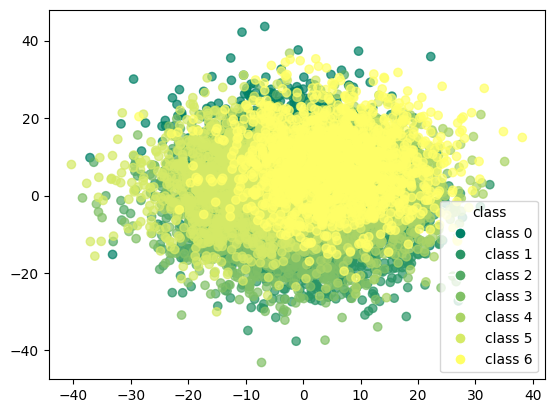

In [1307]:
scatter = plt.scatter(df_gmm.iloc[:, 0], df_gmm.iloc[:, 1], 
                      c=df_gmm['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_gmm['target'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements, title="class")
plt.show()

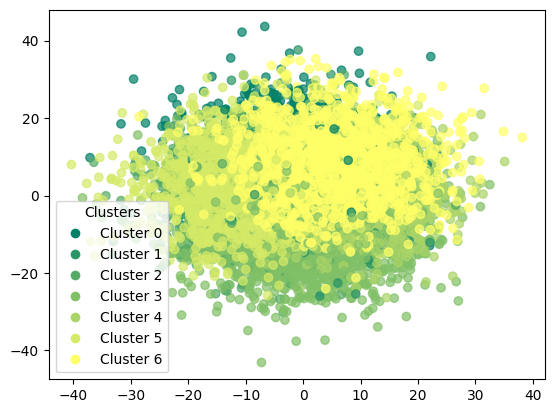

In [1308]:
scatter = plt.scatter(df_gmm.iloc[:, 0], df_gmm.iloc[:, 1], 
                      c=df_gmm['gmm'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_gmm['gmm'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

In [1309]:
print(confusion_matrix(df_gmm['target'],df_gmm['gmm']))

[[1130  179   23   23   34   17   22]
 [   1    1   41 1281   27   56   21]
 [   8    3 1283   62   22   45    5]
 [  14    1    6 1368   11    9   19]
 [  58  123   28   56 1075   24   64]
 [  11    2   19   52    8 1317   19]
 [   7   11    1   71   18   16 1304]]


In [1310]:
print(classification_report(df_gmm['target'],df_gmm['gmm']))

              precision    recall  f1-score   support

           0       0.92      0.79      0.85      1428
           1       0.00      0.00      0.00      1428
           2       0.92      0.90      0.91      1428
           3       0.47      0.96      0.63      1428
           4       0.90      0.75      0.82      1428
           5       0.89      0.92      0.90      1428
           6       0.90      0.91      0.90      1428

    accuracy                           0.75      9996
   macro avg       0.71      0.75      0.72      9996
weighted avg       0.71      0.75      0.72      9996



### GMM with pca

In [1311]:
gmm_pca = GaussianMixture(n_components=7,init_params='k-means++',random_state=42)

In [1312]:
gmm_pca.fit(X_pca)

GaussianMixture(init_params='k-means++', n_components=7, random_state=42)

In [1313]:
df_pca_gmm = corr_dataset.copy()

In [1314]:
df_pca_gmm['gmm_pca'] = gmm_pca.predict(X_pca)

In [1315]:
df_pca_gmm

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,gmm_pca
0,1.135599,-10.400164,22.240662,-14.375857,0.285828,-9.783858,-26.381334,-4.637778,-2.740705,1.743482,...,11.350963,-31.249533,-9.930586,-0.504532,-11.931650,-10.868683,-9.337304,-14.927016,0,2
1,-15.869938,30.712240,-0.025704,0.628227,-17.122823,18.190145,-0.849106,15.540172,-2.035509,5.398190,...,20.635088,-3.838711,0.645310,-7.577490,-11.899058,-5.253737,-6.015310,-18.292091,0,2
2,3.316589,8.227358,-7.540726,-7.554103,-20.017507,5.402220,-0.876915,16.187409,11.503358,7.266798,...,4.752239,0.735842,1.421823,-7.926857,-12.432923,5.163713,-0.165397,-0.865351,0,2
3,-8.785581,8.997587,14.979347,8.468662,4.665399,-5.067845,-6.632648,-0.394280,-1.918146,8.114945,...,0.289233,2.665186,-9.949996,-17.098222,2.250262,1.172018,8.048921,-14.501370,0,2
4,12.464566,8.084375,-5.661159,-10.314443,-9.338559,-21.631719,-3.503240,10.117544,1.547501,-1.978617,...,7.975446,-3.748869,-9.303115,-18.775814,2.284411,-3.585064,-0.298347,-0.286966,0,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9991,13.602651,12.648593,-4.732800,-11.572356,5.292685,15.708583,7.092831,18.167018,-3.220895,11.391614,...,1.435046,-20.917259,-1.677670,-8.697209,6.713519,1.937871,0.365403,-4.306066,6,4
9992,14.248154,4.176920,10.842006,9.077210,-3.409314,-4.760856,3.128806,-1.921522,-2.321112,-5.009046,...,-30.782598,-2.936667,15.868474,8.922822,-14.560461,12.943139,6.379438,15.065089,6,4
9993,6.828329,20.077587,7.990726,-16.197304,-8.602133,-11.404849,4.256457,18.669150,-19.029304,-12.182654,...,-3.038526,3.793316,26.509104,-0.027349,-0.629210,-4.523955,-2.546196,18.075697,6,4
9994,7.850504,9.102936,8.316825,4.925269,3.083185,9.232224,-1.591306,19.958951,-10.621306,-6.009115,...,-2.341835,-2.623850,-9.134532,-0.850230,-3.572674,-15.113896,-15.954749,4.366197,6,2


In [1316]:
y_true = df_pca_gmm['target'].values  
y_kmeans = df_pca_gmm['gmm_pca'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_pca_gmm['gmm_pca'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_pca_gmm['gmm_pca'] == y_true))

accuracy before: 0.12565026010404162
accuracy after: 0.5034013605442177


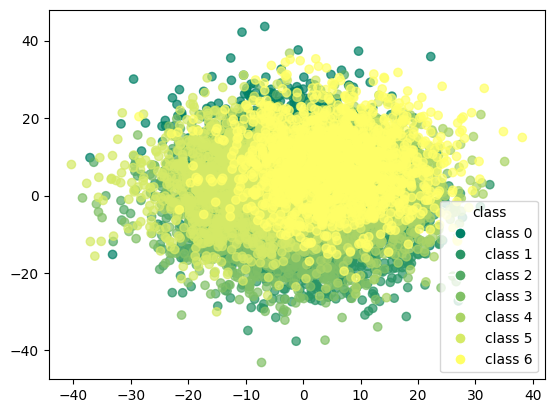

In [1317]:
scatter = plt.scatter(df_pca_gmm.iloc[:, 0], df_pca_gmm.iloc[:, 1], 
                      c=df_pca_gmm['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_pca_gmm['target'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements, title="class")
plt.show()

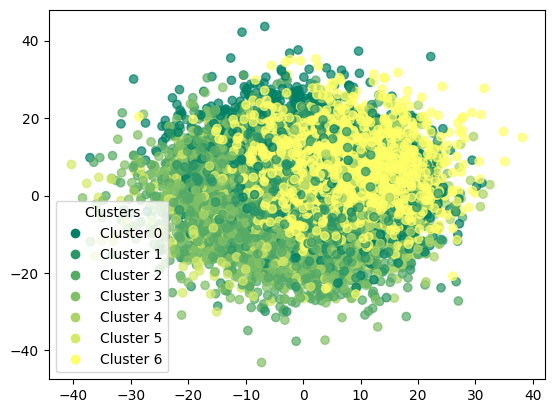

In [1318]:
scatter = plt.scatter(df_pca_gmm.iloc[:, 0], df_pca_gmm.iloc[:, 1], 
                      c=df_pca_gmm['gmm_pca'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_pca_gmm['gmm_pca'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

In [1319]:
print(confusion_matrix(df_pca_gmm['target'],df_pca_gmm['gmm_pca']))

[[1388    1   16   15    0    4    4]
 [  11  166  949   30  253   14    5]
 [  74    1 1252    5   36   59    1]
 [  46  205  268  820    8   75    6]
 [ 796   44  130    8  265    0  185]
 [  98  129  650  415   13  120    3]
 [  76  242    4   21   64    0 1021]]


In [1320]:
print(classification_report(df_pca_gmm['target'],df_pca_gmm['gmm_pca']))

              precision    recall  f1-score   support

           0       0.56      0.97      0.71      1428
           1       0.21      0.12      0.15      1428
           2       0.38      0.88      0.53      1428
           3       0.62      0.57      0.60      1428
           4       0.41      0.19      0.26      1428
           5       0.44      0.08      0.14      1428
           6       0.83      0.71      0.77      1428

    accuracy                           0.50      9996
   macro avg       0.49      0.50      0.45      9996
weighted avg       0.49      0.50      0.45      9996



### GMM with t-SNE

In [1321]:
gmm_tsne = GaussianMixture(n_components=7,init_params='k-means++',random_state=42)

In [1322]:
gmm_tsne.fit(X_tsne)

GaussianMixture(init_params='k-means++', n_components=7, random_state=42)

In [1323]:
df_tsne_gmm = corr_dataset.copy()

In [1324]:
df_tsne_gmm['gmm_tsne'] = gmm_tsne.predict(X_tsne)

In [1325]:
df_tsne_gmm

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,gmm_tsne
0,1.135599,-10.400164,22.240662,-14.375857,0.285828,-9.783858,-26.381334,-4.637778,-2.740705,1.743482,...,11.350963,-31.249533,-9.930586,-0.504532,-11.931650,-10.868683,-9.337304,-14.927016,0,2
1,-15.869938,30.712240,-0.025704,0.628227,-17.122823,18.190145,-0.849106,15.540172,-2.035509,5.398190,...,20.635088,-3.838711,0.645310,-7.577490,-11.899058,-5.253737,-6.015310,-18.292091,0,2
2,3.316589,8.227358,-7.540726,-7.554103,-20.017507,5.402220,-0.876915,16.187409,11.503358,7.266798,...,4.752239,0.735842,1.421823,-7.926857,-12.432923,5.163713,-0.165397,-0.865351,0,2
3,-8.785581,8.997587,14.979347,8.468662,4.665399,-5.067845,-6.632648,-0.394280,-1.918146,8.114945,...,0.289233,2.665186,-9.949996,-17.098222,2.250262,1.172018,8.048921,-14.501370,0,2
4,12.464566,8.084375,-5.661159,-10.314443,-9.338559,-21.631719,-3.503240,10.117544,1.547501,-1.978617,...,7.975446,-3.748869,-9.303115,-18.775814,2.284411,-3.585064,-0.298347,-0.286966,0,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9991,13.602651,12.648593,-4.732800,-11.572356,5.292685,15.708583,7.092831,18.167018,-3.220895,11.391614,...,1.435046,-20.917259,-1.677670,-8.697209,6.713519,1.937871,0.365403,-4.306066,6,0
9992,14.248154,4.176920,10.842006,9.077210,-3.409314,-4.760856,3.128806,-1.921522,-2.321112,-5.009046,...,-30.782598,-2.936667,15.868474,8.922822,-14.560461,12.943139,6.379438,15.065089,6,3
9993,6.828329,20.077587,7.990726,-16.197304,-8.602133,-11.404849,4.256457,18.669150,-19.029304,-12.182654,...,-3.038526,3.793316,26.509104,-0.027349,-0.629210,-4.523955,-2.546196,18.075697,6,3
9994,7.850504,9.102936,8.316825,4.925269,3.083185,9.232224,-1.591306,19.958951,-10.621306,-6.009115,...,-2.341835,-2.623850,-9.134532,-0.850230,-3.572674,-15.113896,-15.954749,4.366197,6,6


In [1326]:
y_true = df_tsne_gmm['target'].values  
y_kmeans = df_tsne_gmm['gmm_tsne'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_tsne_gmm['gmm_tsne'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_tsne_gmm['gmm_tsne'] == y_true))

accuracy before: 0.13845538215286116
accuracy after: 0.6543617446978791


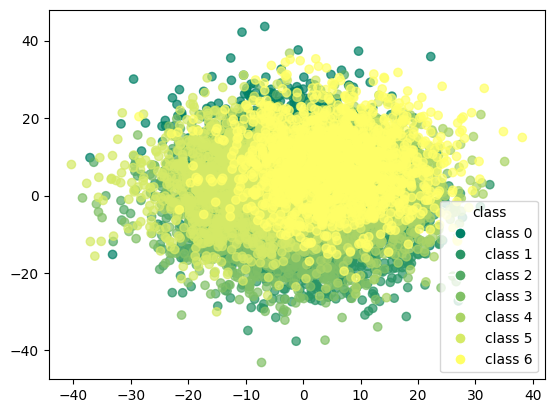

In [1327]:
scatter = plt.scatter(df_tsne_gmm.iloc[:, 0], df_tsne_gmm.iloc[:, 1], 
                      c=df_tsne_gmm['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_tsne_gmm['target'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements, title="class")
plt.show()

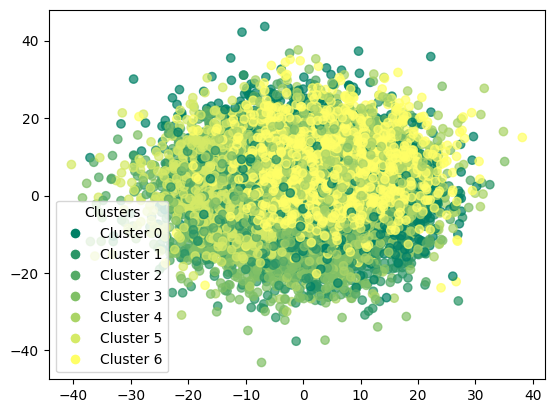

In [1328]:
scatter = plt.scatter(df_tsne_gmm.iloc[:, 0], df_tsne_gmm.iloc[:, 1], 
                      c=df_tsne_gmm['gmm_tsne'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_tsne_gmm['gmm_tsne'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

In [1329]:
print(confusion_matrix(df_tsne_gmm['target'],df_tsne_gmm['gmm_tsne']))

[[1275    0   26   28   75    3   21]
 [  19  879   83  170  220   18   39]
 [  19   26 1200   42  126   10    5]
 [  27   49    9 1122   90    5  126]
 [ 779    5  168   60  394    3   19]
 [  22  266  191  137   42  751   19]
 [  78    3    4   91  329    3  920]]


In [1330]:
print(classification_report(df_tsne_gmm['target'],df_tsne_gmm['gmm_tsne']))

              precision    recall  f1-score   support

           0       0.57      0.89      0.70      1428
           1       0.72      0.62      0.66      1428
           2       0.71      0.84      0.77      1428
           3       0.68      0.79      0.73      1428
           4       0.31      0.28      0.29      1428
           5       0.95      0.53      0.68      1428
           6       0.80      0.64      0.71      1428

    accuracy                           0.65      9996
   macro avg       0.68      0.65      0.65      9996
weighted avg       0.68      0.65      0.65      9996



### GMM with umap

In [1331]:
gmm_umap = GaussianMixture(n_components=7,init_params='k-means++',random_state=42)

In [1332]:
gmm_umap.fit(X_umap)

GaussianMixture(init_params='k-means++', n_components=7, random_state=42)

In [1333]:
df_umap_gmm = corr_dataset.copy()

In [1334]:
df_umap_gmm['gmm_umap'] = gmm_umap.predict(X_umap)

In [1335]:
df_umap_gmm

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,gmm_umap
0,1.135599,-10.400164,22.240662,-14.375857,0.285828,-9.783858,-26.381334,-4.637778,-2.740705,1.743482,...,11.350963,-31.249533,-9.930586,-0.504532,-11.931650,-10.868683,-9.337304,-14.927016,0,2
1,-15.869938,30.712240,-0.025704,0.628227,-17.122823,18.190145,-0.849106,15.540172,-2.035509,5.398190,...,20.635088,-3.838711,0.645310,-7.577490,-11.899058,-5.253737,-6.015310,-18.292091,0,2
2,3.316589,8.227358,-7.540726,-7.554103,-20.017507,5.402220,-0.876915,16.187409,11.503358,7.266798,...,4.752239,0.735842,1.421823,-7.926857,-12.432923,5.163713,-0.165397,-0.865351,0,2
3,-8.785581,8.997587,14.979347,8.468662,4.665399,-5.067845,-6.632648,-0.394280,-1.918146,8.114945,...,0.289233,2.665186,-9.949996,-17.098222,2.250262,1.172018,8.048921,-14.501370,0,2
4,12.464566,8.084375,-5.661159,-10.314443,-9.338559,-21.631719,-3.503240,10.117544,1.547501,-1.978617,...,7.975446,-3.748869,-9.303115,-18.775814,2.284411,-3.585064,-0.298347,-0.286966,0,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9991,13.602651,12.648593,-4.732800,-11.572356,5.292685,15.708583,7.092831,18.167018,-3.220895,11.391614,...,1.435046,-20.917259,-1.677670,-8.697209,6.713519,1.937871,0.365403,-4.306066,6,4
9992,14.248154,4.176920,10.842006,9.077210,-3.409314,-4.760856,3.128806,-1.921522,-2.321112,-5.009046,...,-30.782598,-2.936667,15.868474,8.922822,-14.560461,12.943139,6.379438,15.065089,6,4
9993,6.828329,20.077587,7.990726,-16.197304,-8.602133,-11.404849,4.256457,18.669150,-19.029304,-12.182654,...,-3.038526,3.793316,26.509104,-0.027349,-0.629210,-4.523955,-2.546196,18.075697,6,4
9994,7.850504,9.102936,8.316825,4.925269,3.083185,9.232224,-1.591306,19.958951,-10.621306,-6.009115,...,-2.341835,-2.623850,-9.134532,-0.850230,-3.572674,-15.113896,-15.954749,4.366197,6,1


In [1336]:
y_true = df_umap_gmm['target'].values  
y_kmeans = df_umap_gmm['gmm_umap'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_umap_gmm['gmm_umap'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_umap_gmm['gmm_umap'] == y_true))

accuracy before: 0.02701080432172869
accuracy after: 0.7406962785114045


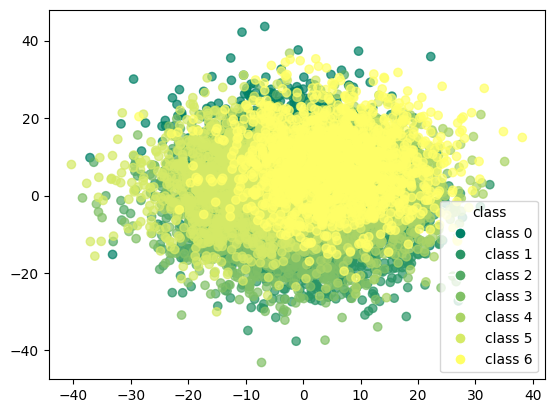

In [1337]:
scatter = plt.scatter(df_umap_gmm.iloc[:, 0], df_umap_gmm.iloc[:, 1], 
                      c=df_umap_gmm['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_umap_gmm['target'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements, title="class")
plt.show()

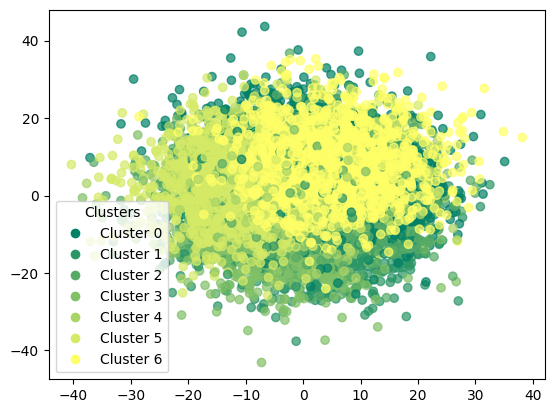

In [1338]:
scatter = plt.scatter(df_umap_gmm.iloc[:, 0], df_umap_gmm.iloc[:, 1], 
                      c=df_umap_gmm['gmm_umap'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_umap_gmm['gmm_umap'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

In [1339]:
print(confusion_matrix(df_umap_gmm['target'],df_umap_gmm['gmm_umap']))

[[1327    2   43    8   16    8   24]
 [  11 1066  108   60   93   67   23]
 [  16   32 1317   12   11   36    4]
 [  23   48   30 1144  151   11   21]
 [ 791   12  504    7   31   15   68]
 [  21   33   40    8   50 1267    9]
 [  29   12   30    6   83   16 1252]]


In [1340]:
print(classification_report(df_umap_gmm['target'],df_umap_gmm['gmm_umap']))

              precision    recall  f1-score   support

           0       0.60      0.93      0.73      1428
           1       0.88      0.75      0.81      1428
           2       0.64      0.92      0.75      1428
           3       0.92      0.80      0.86      1428
           4       0.07      0.02      0.03      1428
           5       0.89      0.89      0.89      1428
           6       0.89      0.88      0.89      1428

    accuracy                           0.74      9996
   macro avg       0.70      0.74      0.71      9996
weighted avg       0.70      0.74      0.71      9996



## pam

In [1341]:
initial_medoids = np.random.choice(len(X_values),7,replace=False)

In [1342]:
metric = distance_metric(type_metric.EUCLIDEAN)

In [1343]:
pam = kmedoids(X_values,initial_medoids,metric=metric)

In [1344]:
pam.process()

In [1345]:
clusters = pam.get_clusters()

In [1346]:
medoids = pam.get_medoids()

In [1347]:
labels = np.zeros(len(X_values))
for cluster_idx, cluster in enumerate(clusters):
    for data_idx in cluster:
        labels[data_idx] = cluster_idx

In [1348]:
df_pam = corr_dataset.copy()

In [1349]:
df_pam['pam'] = labels

In [1350]:
df_pam

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,pam
0,1.135599,-10.400164,22.240662,-14.375857,0.285828,-9.783858,-26.381334,-4.637778,-2.740705,1.743482,...,11.350963,-31.249533,-9.930586,-0.504532,-11.931650,-10.868683,-9.337304,-14.927016,0,3.0
1,-15.869938,30.712240,-0.025704,0.628227,-17.122823,18.190145,-0.849106,15.540172,-2.035509,5.398190,...,20.635088,-3.838711,0.645310,-7.577490,-11.899058,-5.253737,-6.015310,-18.292091,0,1.0
2,3.316589,8.227358,-7.540726,-7.554103,-20.017507,5.402220,-0.876915,16.187409,11.503358,7.266798,...,4.752239,0.735842,1.421823,-7.926857,-12.432923,5.163713,-0.165397,-0.865351,0,4.0
3,-8.785581,8.997587,14.979347,8.468662,4.665399,-5.067845,-6.632648,-0.394280,-1.918146,8.114945,...,0.289233,2.665186,-9.949996,-17.098222,2.250262,1.172018,8.048921,-14.501370,0,1.0
4,12.464566,8.084375,-5.661159,-10.314443,-9.338559,-21.631719,-3.503240,10.117544,1.547501,-1.978617,...,7.975446,-3.748869,-9.303115,-18.775814,2.284411,-3.585064,-0.298347,-0.286966,0,3.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9991,13.602651,12.648593,-4.732800,-11.572356,5.292685,15.708583,7.092831,18.167018,-3.220895,11.391614,...,1.435046,-20.917259,-1.677670,-8.697209,6.713519,1.937871,0.365403,-4.306066,6,4.0
9992,14.248154,4.176920,10.842006,9.077210,-3.409314,-4.760856,3.128806,-1.921522,-2.321112,-5.009046,...,-30.782598,-2.936667,15.868474,8.922822,-14.560461,12.943139,6.379438,15.065089,6,4.0
9993,6.828329,20.077587,7.990726,-16.197304,-8.602133,-11.404849,4.256457,18.669150,-19.029304,-12.182654,...,-3.038526,3.793316,26.509104,-0.027349,-0.629210,-4.523955,-2.546196,18.075697,6,4.0
9994,7.850504,9.102936,8.316825,4.925269,3.083185,9.232224,-1.591306,19.958951,-10.621306,-6.009115,...,-2.341835,-2.623850,-9.134532,-0.850230,-3.572674,-15.113896,-15.954749,4.366197,6,3.0


In [1351]:
y_true = df_pam['target'].values  
y_kmeans = df_pam['pam'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_pam['pam'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_pam['pam'] == y_true))

accuracy before: 0.16676670668267307
accuracy after: 0.7393957583033214


In [1352]:
df_pam

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,pam
0,1.135599,-10.400164,22.240662,-14.375857,0.285828,-9.783858,-26.381334,-4.637778,-2.740705,1.743482,...,11.350963,-31.249533,-9.930586,-0.504532,-11.931650,-10.868683,-9.337304,-14.927016,0,4
1,-15.869938,30.712240,-0.025704,0.628227,-17.122823,18.190145,-0.849106,15.540172,-2.035509,5.398190,...,20.635088,-3.838711,0.645310,-7.577490,-11.899058,-5.253737,-6.015310,-18.292091,0,0
2,3.316589,8.227358,-7.540726,-7.554103,-20.017507,5.402220,-0.876915,16.187409,11.503358,7.266798,...,4.752239,0.735842,1.421823,-7.926857,-12.432923,5.163713,-0.165397,-0.865351,0,6
3,-8.785581,8.997587,14.979347,8.468662,4.665399,-5.067845,-6.632648,-0.394280,-1.918146,8.114945,...,0.289233,2.665186,-9.949996,-17.098222,2.250262,1.172018,8.048921,-14.501370,0,0
4,12.464566,8.084375,-5.661159,-10.314443,-9.338559,-21.631719,-3.503240,10.117544,1.547501,-1.978617,...,7.975446,-3.748869,-9.303115,-18.775814,2.284411,-3.585064,-0.298347,-0.286966,0,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9991,13.602651,12.648593,-4.732800,-11.572356,5.292685,15.708583,7.092831,18.167018,-3.220895,11.391614,...,1.435046,-20.917259,-1.677670,-8.697209,6.713519,1.937871,0.365403,-4.306066,6,6
9992,14.248154,4.176920,10.842006,9.077210,-3.409314,-4.760856,3.128806,-1.921522,-2.321112,-5.009046,...,-30.782598,-2.936667,15.868474,8.922822,-14.560461,12.943139,6.379438,15.065089,6,6
9993,6.828329,20.077587,7.990726,-16.197304,-8.602133,-11.404849,4.256457,18.669150,-19.029304,-12.182654,...,-3.038526,3.793316,26.509104,-0.027349,-0.629210,-4.523955,-2.546196,18.075697,6,6
9994,7.850504,9.102936,8.316825,4.925269,3.083185,9.232224,-1.591306,19.958951,-10.621306,-6.009115,...,-2.341835,-2.623850,-9.134532,-0.850230,-3.572674,-15.113896,-15.954749,4.366197,6,4


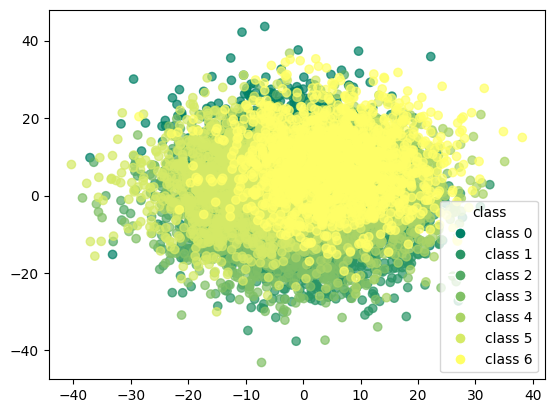

In [1353]:
scatter = plt.scatter(df_pam.iloc[:, 0],df_pam.iloc[:, 1], 
                      c=df_pam['target'],cmap='summer',alpha=0.7)

unique_labels = np.unique(df_pam['target'])
legend_elements = [Line2D([0], [0],marker='o',color='w',label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements,title="class")
plt.show()

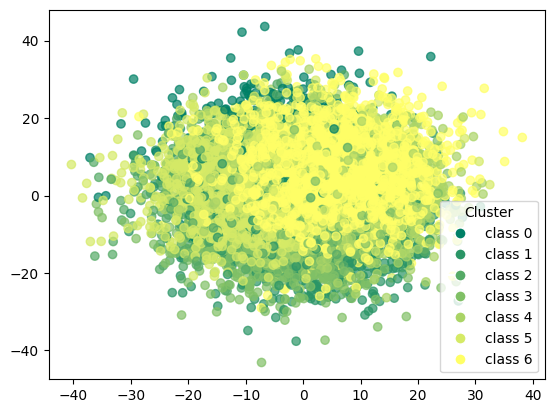

In [1354]:
scatter = plt.scatter(df_pam.iloc[:, 0],df_pam.iloc[:, 1], 
                      c=df_pam['pam'],cmap='summer',alpha=0.7)

unique_labels = np.unique(df_pam['pam'])
legend_elements = [Line2D([0], [0],marker='o',color='w',label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements,title="Cluster")
plt.show()

In [1355]:
print(confusion_matrix(df_pam['target'],df_pam['pam']))

[[1028    0   58   14  155   81   92]
 [   0  953   43   75   49  164  144]
 [  27  156 1162   13   18   13   39]
 [  14   95   61 1098   55   59   46]
 [  55   36   70    8  868   60  331]
 [  31   62  125   13   78 1061   58]
 [   7    8   10   39  100   43 1221]]


In [1356]:
print(classification_report(df_pam['target'],df_pam['pam']))

              precision    recall  f1-score   support

           0       0.88      0.72      0.79      1428
           1       0.73      0.67      0.70      1428
           2       0.76      0.81      0.79      1428
           3       0.87      0.77      0.82      1428
           4       0.66      0.61      0.63      1428
           5       0.72      0.74      0.73      1428
           6       0.63      0.86      0.73      1428

    accuracy                           0.74      9996
   macro avg       0.75      0.74      0.74      9996
weighted avg       0.75      0.74      0.74      9996



### pam with pca

In [1357]:
initial_medoids = np.random.choice(len(X_pca),7,replace=False)

In [1358]:
metric = distance_metric(type_metric.EUCLIDEAN)

In [1359]:
pam_pca = kmedoids(X_pca,initial_medoids,metric=metric)

In [1360]:
pam_pca.process()

In [1361]:
clusters = pam_pca.get_clusters()

In [1362]:
medoids = pam_pca.get_medoids()

In [1363]:
labels = np.zeros(len(X_pca))
for cluster_idx, cluster in enumerate(clusters):
    for data_idx in cluster:
        labels[data_idx] = cluster_idx

In [1364]:
df_pam_pca = corr_dataset.copy()

In [1365]:
df_pam_pca['pam_pca'] = labels

In [1366]:
df_pam_pca

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,pam_pca
0,1.135599,-10.400164,22.240662,-14.375857,0.285828,-9.783858,-26.381334,-4.637778,-2.740705,1.743482,...,11.350963,-31.249533,-9.930586,-0.504532,-11.931650,-10.868683,-9.337304,-14.927016,0,3.0
1,-15.869938,30.712240,-0.025704,0.628227,-17.122823,18.190145,-0.849106,15.540172,-2.035509,5.398190,...,20.635088,-3.838711,0.645310,-7.577490,-11.899058,-5.253737,-6.015310,-18.292091,0,3.0
2,3.316589,8.227358,-7.540726,-7.554103,-20.017507,5.402220,-0.876915,16.187409,11.503358,7.266798,...,4.752239,0.735842,1.421823,-7.926857,-12.432923,5.163713,-0.165397,-0.865351,0,4.0
3,-8.785581,8.997587,14.979347,8.468662,4.665399,-5.067845,-6.632648,-0.394280,-1.918146,8.114945,...,0.289233,2.665186,-9.949996,-17.098222,2.250262,1.172018,8.048921,-14.501370,0,3.0
4,12.464566,8.084375,-5.661159,-10.314443,-9.338559,-21.631719,-3.503240,10.117544,1.547501,-1.978617,...,7.975446,-3.748869,-9.303115,-18.775814,2.284411,-3.585064,-0.298347,-0.286966,0,3.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9991,13.602651,12.648593,-4.732800,-11.572356,5.292685,15.708583,7.092831,18.167018,-3.220895,11.391614,...,1.435046,-20.917259,-1.677670,-8.697209,6.713519,1.937871,0.365403,-4.306066,6,6.0
9992,14.248154,4.176920,10.842006,9.077210,-3.409314,-4.760856,3.128806,-1.921522,-2.321112,-5.009046,...,-30.782598,-2.936667,15.868474,8.922822,-14.560461,12.943139,6.379438,15.065089,6,6.0
9993,6.828329,20.077587,7.990726,-16.197304,-8.602133,-11.404849,4.256457,18.669150,-19.029304,-12.182654,...,-3.038526,3.793316,26.509104,-0.027349,-0.629210,-4.523955,-2.546196,18.075697,6,6.0
9994,7.850504,9.102936,8.316825,4.925269,3.083185,9.232224,-1.591306,19.958951,-10.621306,-6.009115,...,-2.341835,-2.623850,-9.134532,-0.850230,-3.572674,-15.113896,-15.954749,4.366197,6,2.0


In [1367]:
y_true = df_pam_pca['target'].values  
y_kmeans = df_pam_pca['pam_pca'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_pam_pca['pam_pca'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_pam_pca['pam_pca'] == y_true))

accuracy before: 0.3382352941176471
accuracy after: 0.7203881552621049


In [1368]:
df_pam_pca

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,pam_pca
0,1.135599,-10.400164,22.240662,-14.375857,0.285828,-9.783858,-26.381334,-4.637778,-2.740705,1.743482,...,11.350963,-31.249533,-9.930586,-0.504532,-11.931650,-10.868683,-9.337304,-14.927016,0,0
1,-15.869938,30.712240,-0.025704,0.628227,-17.122823,18.190145,-0.849106,15.540172,-2.035509,5.398190,...,20.635088,-3.838711,0.645310,-7.577490,-11.899058,-5.253737,-6.015310,-18.292091,0,0
2,3.316589,8.227358,-7.540726,-7.554103,-20.017507,5.402220,-0.876915,16.187409,11.503358,7.266798,...,4.752239,0.735842,1.421823,-7.926857,-12.432923,5.163713,-0.165397,-0.865351,0,4
3,-8.785581,8.997587,14.979347,8.468662,4.665399,-5.067845,-6.632648,-0.394280,-1.918146,8.114945,...,0.289233,2.665186,-9.949996,-17.098222,2.250262,1.172018,8.048921,-14.501370,0,0
4,12.464566,8.084375,-5.661159,-10.314443,-9.338559,-21.631719,-3.503240,10.117544,1.547501,-1.978617,...,7.975446,-3.748869,-9.303115,-18.775814,2.284411,-3.585064,-0.298347,-0.286966,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9991,13.602651,12.648593,-4.732800,-11.572356,5.292685,15.708583,7.092831,18.167018,-3.220895,11.391614,...,1.435046,-20.917259,-1.677670,-8.697209,6.713519,1.937871,0.365403,-4.306066,6,6
9992,14.248154,4.176920,10.842006,9.077210,-3.409314,-4.760856,3.128806,-1.921522,-2.321112,-5.009046,...,-30.782598,-2.936667,15.868474,8.922822,-14.560461,12.943139,6.379438,15.065089,6,6
9993,6.828329,20.077587,7.990726,-16.197304,-8.602133,-11.404849,4.256457,18.669150,-19.029304,-12.182654,...,-3.038526,3.793316,26.509104,-0.027349,-0.629210,-4.523955,-2.546196,18.075697,6,6
9994,7.850504,9.102936,8.316825,4.925269,3.083185,9.232224,-1.591306,19.958951,-10.621306,-6.009115,...,-2.341835,-2.623850,-9.134532,-0.850230,-3.572674,-15.113896,-15.954749,4.366197,6,5


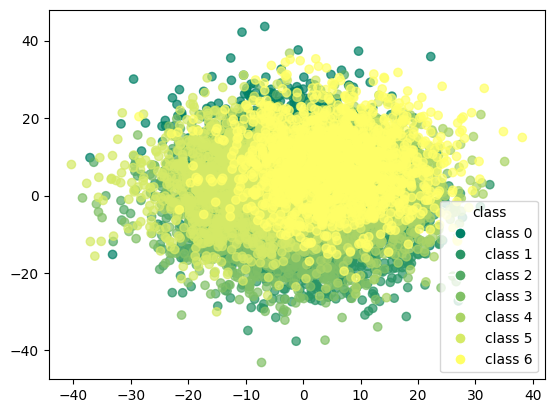

In [1369]:
scatter = plt.scatter(df_pam_pca.iloc[:, 0],df_pam_pca.iloc[:, 1], 
                      c=df_pam_pca['target'],cmap='summer',alpha=0.7)

unique_labels = np.unique(df_pam_pca['target'])
legend_elements = [Line2D([0], [0],marker='o',color='w',label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements,title="class")
plt.show()

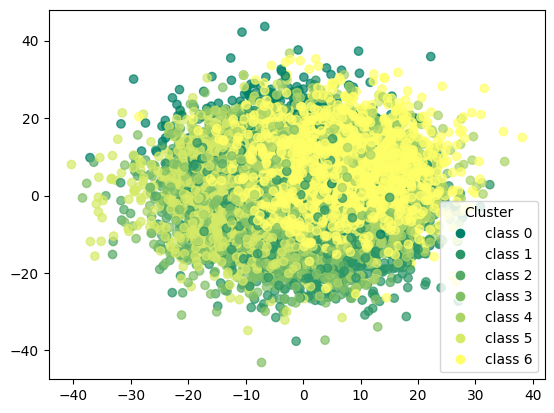

In [1370]:
scatter = plt.scatter(df_pam_pca.iloc[:, 0],df_pam_pca.iloc[:, 1], 
                      c=df_pam_pca['pam_pca'],cmap='summer',alpha=0.7)

unique_labels = np.unique(df_pam_pca['pam_pca'])
legend_elements = [Line2D([0], [0],marker='o',color='w',label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements,title="Cluster")
plt.show()

In [1371]:
print(confusion_matrix(df_pam_pca['target'],df_pam_pca['pam_pca']))

[[1245    0    7    4  128   38    6]
 [   0 1028   98   92   54  133   23]
 [  16   76 1115    0  107  113    1]
 [  17  142    5  865   21  346   32]
 [ 131   57   54   14  989   31  152]
 [  30  242   54  246   63  783   10]
 [   8   47    0   58  134    5 1176]]


In [1372]:
print(classification_report(df_pam_pca['target'],df_pam_pca['pam_pca']))

              precision    recall  f1-score   support

           0       0.86      0.87      0.87      1428
           1       0.65      0.72      0.68      1428
           2       0.84      0.78      0.81      1428
           3       0.68      0.61      0.64      1428
           4       0.66      0.69      0.68      1428
           5       0.54      0.55      0.54      1428
           6       0.84      0.82      0.83      1428

    accuracy                           0.72      9996
   macro avg       0.72      0.72      0.72      9996
weighted avg       0.72      0.72      0.72      9996



### pam with t-SNE

In [1373]:
initial_medoids = np.random.choice(len(X_pca),7,replace=False)

In [1374]:
metric = distance_metric(type_metric.EUCLIDEAN)

In [1375]:
pam_tsne = kmedoids(X_tsne,initial_medoids,metric=metric)

In [1376]:
pam_tsne.process()

In [1377]:
clusters = pam_tsne.get_clusters()

In [1378]:
medoids = pam_tsne.get_medoids()

In [1379]:
labels = np.zeros(len(X_tsne))
for cluster_idx, cluster in enumerate(clusters):
    for data_idx in cluster:
        labels[data_idx] = cluster_idx

In [1380]:
df_pam_tsne = corr_dataset.copy()

In [1381]:
df_pam_tsne['pam_tsne'] = labels

In [1382]:
df_pam_tsne

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,pam_tsne
0,1.135599,-10.400164,22.240662,-14.375857,0.285828,-9.783858,-26.381334,-4.637778,-2.740705,1.743482,...,11.350963,-31.249533,-9.930586,-0.504532,-11.931650,-10.868683,-9.337304,-14.927016,0,1.0
1,-15.869938,30.712240,-0.025704,0.628227,-17.122823,18.190145,-0.849106,15.540172,-2.035509,5.398190,...,20.635088,-3.838711,0.645310,-7.577490,-11.899058,-5.253737,-6.015310,-18.292091,0,1.0
2,3.316589,8.227358,-7.540726,-7.554103,-20.017507,5.402220,-0.876915,16.187409,11.503358,7.266798,...,4.752239,0.735842,1.421823,-7.926857,-12.432923,5.163713,-0.165397,-0.865351,0,3.0
3,-8.785581,8.997587,14.979347,8.468662,4.665399,-5.067845,-6.632648,-0.394280,-1.918146,8.114945,...,0.289233,2.665186,-9.949996,-17.098222,2.250262,1.172018,8.048921,-14.501370,0,1.0
4,12.464566,8.084375,-5.661159,-10.314443,-9.338559,-21.631719,-3.503240,10.117544,1.547501,-1.978617,...,7.975446,-3.748869,-9.303115,-18.775814,2.284411,-3.585064,-0.298347,-0.286966,0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9991,13.602651,12.648593,-4.732800,-11.572356,5.292685,15.708583,7.092831,18.167018,-3.220895,11.391614,...,1.435046,-20.917259,-1.677670,-8.697209,6.713519,1.937871,0.365403,-4.306066,6,5.0
9992,14.248154,4.176920,10.842006,9.077210,-3.409314,-4.760856,3.128806,-1.921522,-2.321112,-5.009046,...,-30.782598,-2.936667,15.868474,8.922822,-14.560461,12.943139,6.379438,15.065089,6,5.0
9993,6.828329,20.077587,7.990726,-16.197304,-8.602133,-11.404849,4.256457,18.669150,-19.029304,-12.182654,...,-3.038526,3.793316,26.509104,-0.027349,-0.629210,-4.523955,-2.546196,18.075697,6,5.0
9994,7.850504,9.102936,8.316825,4.925269,3.083185,9.232224,-1.591306,19.958951,-10.621306,-6.009115,...,-2.341835,-2.623850,-9.134532,-0.850230,-3.572674,-15.113896,-15.954749,4.366197,6,3.0


In [1383]:
y_true = df_pam_tsne['target'].values  
y_kmeans = df_pam_tsne['pam_tsne'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_pam_tsne['pam_tsne'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_pam_tsne['pam_tsne'] == y_true))

accuracy before: 0.11854741896758704
accuracy after: 0.741296518607443


In [1384]:
df_pam_tsne

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,pam_tsne
0,1.135599,-10.400164,22.240662,-14.375857,0.285828,-9.783858,-26.381334,-4.637778,-2.740705,1.743482,...,11.350963,-31.249533,-9.930586,-0.504532,-11.931650,-10.868683,-9.337304,-14.927016,0,0
1,-15.869938,30.712240,-0.025704,0.628227,-17.122823,18.190145,-0.849106,15.540172,-2.035509,5.398190,...,20.635088,-3.838711,0.645310,-7.577490,-11.899058,-5.253737,-6.015310,-18.292091,0,0
2,3.316589,8.227358,-7.540726,-7.554103,-20.017507,5.402220,-0.876915,16.187409,11.503358,7.266798,...,4.752239,0.735842,1.421823,-7.926857,-12.432923,5.163713,-0.165397,-0.865351,0,4
3,-8.785581,8.997587,14.979347,8.468662,4.665399,-5.067845,-6.632648,-0.394280,-1.918146,8.114945,...,0.289233,2.665186,-9.949996,-17.098222,2.250262,1.172018,8.048921,-14.501370,0,0
4,12.464566,8.084375,-5.661159,-10.314443,-9.338559,-21.631719,-3.503240,10.117544,1.547501,-1.978617,...,7.975446,-3.748869,-9.303115,-18.775814,2.284411,-3.585064,-0.298347,-0.286966,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9991,13.602651,12.648593,-4.732800,-11.572356,5.292685,15.708583,7.092831,18.167018,-3.220895,11.391614,...,1.435046,-20.917259,-1.677670,-8.697209,6.713519,1.937871,0.365403,-4.306066,6,6
9992,14.248154,4.176920,10.842006,9.077210,-3.409314,-4.760856,3.128806,-1.921522,-2.321112,-5.009046,...,-30.782598,-2.936667,15.868474,8.922822,-14.560461,12.943139,6.379438,15.065089,6,6
9993,6.828329,20.077587,7.990726,-16.197304,-8.602133,-11.404849,4.256457,18.669150,-19.029304,-12.182654,...,-3.038526,3.793316,26.509104,-0.027349,-0.629210,-4.523955,-2.546196,18.075697,6,6
9994,7.850504,9.102936,8.316825,4.925269,3.083185,9.232224,-1.591306,19.958951,-10.621306,-6.009115,...,-2.341835,-2.623850,-9.134532,-0.850230,-3.572674,-15.113896,-15.954749,4.366197,6,4


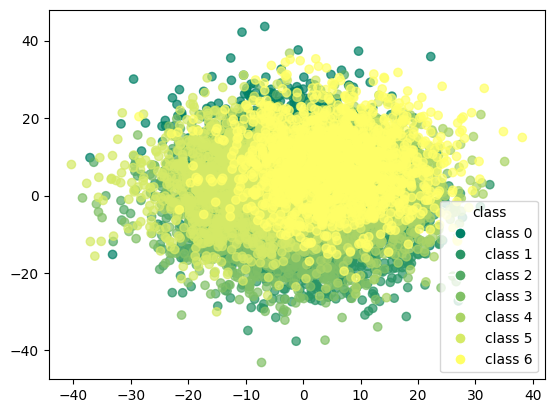

In [1385]:
scatter = plt.scatter(df_pam_tsne.iloc[:, 0],df_pam_tsne.iloc[:, 1], 
                      c=df_pam_tsne['target'],cmap='summer',alpha=0.7)

unique_labels = np.unique(df_pam_tsne['target'])
legend_elements = [Line2D([0], [0],marker='o',color='w',label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements,title="class")
plt.show()

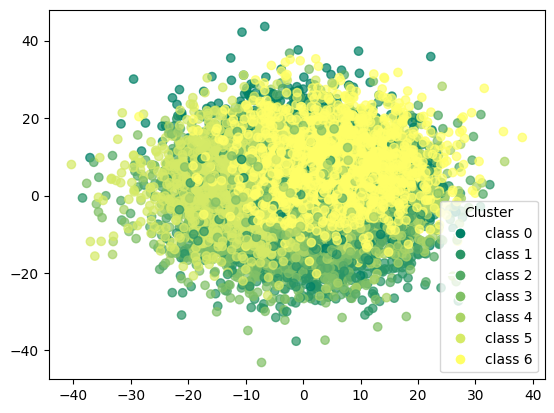

In [1386]:
scatter = plt.scatter(df_pam_tsne.iloc[:, 0],df_pam_tsne.iloc[:, 1], 
                      c=df_pam_tsne['pam_tsne'],cmap='summer',alpha=0.7)

unique_labels = np.unique(df_pam_tsne['pam_tsne'])
legend_elements = [Line2D([0], [0],marker='o',color='w',label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements,title="Cluster")
plt.show()

In [1387]:
print(confusion_matrix(df_pam_tsne['target'],df_pam_tsne['pam_tsne']))

[[1219    4   23   18  124    4   36]
 [   3 1006   90  130   56   85   58]
 [   8   75 1060   12  173   94    6]
 [   8  187   11 1075   58   13   76]
 [ 248   12  319   25  700    4  120]
 [  11   71   46   64   64 1143   29]
 [  16   26   28   81   65    5 1207]]


In [1388]:
print(classification_report(df_pam_tsne['target'],df_pam_tsne['pam_tsne']))

              precision    recall  f1-score   support

           0       0.81      0.85      0.83      1428
           1       0.73      0.70      0.72      1428
           2       0.67      0.74      0.71      1428
           3       0.77      0.75      0.76      1428
           4       0.56      0.49      0.52      1428
           5       0.85      0.80      0.82      1428
           6       0.79      0.85      0.82      1428

    accuracy                           0.74      9996
   macro avg       0.74      0.74      0.74      9996
weighted avg       0.74      0.74      0.74      9996



### pam with umap

In [1389]:
initial_medoids = np.random.choice(len(X_pca),7,replace=False)

In [1390]:
metric = distance_metric(type_metric.EUCLIDEAN)

In [1391]:
pam_umap = kmedoids(X_umap,initial_medoids,metric=metric)

In [1392]:
pam_umap.process()

In [1393]:
clusters = pam_umap.get_clusters()

In [1394]:
medoids = pam_umap.get_medoids()

In [1395]:
labels = np.zeros(len(X_umap))
for cluster_idx, cluster in enumerate(clusters):
    for data_idx in cluster:
        labels[data_idx] = cluster_idx

In [1396]:
df_pam_umap = corr_dataset.copy()

In [1397]:
df_pam_umap['pam_umap'] = labels

In [1398]:
df_pam_umap

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,pam_umap
0,1.135599,-10.400164,22.240662,-14.375857,0.285828,-9.783858,-26.381334,-4.637778,-2.740705,1.743482,...,11.350963,-31.249533,-9.930586,-0.504532,-11.931650,-10.868683,-9.337304,-14.927016,0,0.0
1,-15.869938,30.712240,-0.025704,0.628227,-17.122823,18.190145,-0.849106,15.540172,-2.035509,5.398190,...,20.635088,-3.838711,0.645310,-7.577490,-11.899058,-5.253737,-6.015310,-18.292091,0,0.0
2,3.316589,8.227358,-7.540726,-7.554103,-20.017507,5.402220,-0.876915,16.187409,11.503358,7.266798,...,4.752239,0.735842,1.421823,-7.926857,-12.432923,5.163713,-0.165397,-0.865351,0,3.0
3,-8.785581,8.997587,14.979347,8.468662,4.665399,-5.067845,-6.632648,-0.394280,-1.918146,8.114945,...,0.289233,2.665186,-9.949996,-17.098222,2.250262,1.172018,8.048921,-14.501370,0,0.0
4,12.464566,8.084375,-5.661159,-10.314443,-9.338559,-21.631719,-3.503240,10.117544,1.547501,-1.978617,...,7.975446,-3.748869,-9.303115,-18.775814,2.284411,-3.585064,-0.298347,-0.286966,0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9991,13.602651,12.648593,-4.732800,-11.572356,5.292685,15.708583,7.092831,18.167018,-3.220895,11.391614,...,1.435046,-20.917259,-1.677670,-8.697209,6.713519,1.937871,0.365403,-4.306066,6,1.0
9992,14.248154,4.176920,10.842006,9.077210,-3.409314,-4.760856,3.128806,-1.921522,-2.321112,-5.009046,...,-30.782598,-2.936667,15.868474,8.922822,-14.560461,12.943139,6.379438,15.065089,6,1.0
9993,6.828329,20.077587,7.990726,-16.197304,-8.602133,-11.404849,4.256457,18.669150,-19.029304,-12.182654,...,-3.038526,3.793316,26.509104,-0.027349,-0.629210,-4.523955,-2.546196,18.075697,6,1.0
9994,7.850504,9.102936,8.316825,4.925269,3.083185,9.232224,-1.591306,19.958951,-10.621306,-6.009115,...,-2.341835,-2.623850,-9.134532,-0.850230,-3.572674,-15.113896,-15.954749,4.366197,6,1.0


In [1399]:
y_true = df_pam_umap['target'].values  
y_kmeans = df_pam_umap['pam_umap'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_pam_umap['pam_umap'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_pam_umap['pam_umap'] == y_true))

accuracy before: 0.1400560224089636
accuracy after: 0.8681472589035614


In [1400]:
df_pam_umap

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,pam_umap
0,1.135599,-10.400164,22.240662,-14.375857,0.285828,-9.783858,-26.381334,-4.637778,-2.740705,1.743482,...,11.350963,-31.249533,-9.930586,-0.504532,-11.931650,-10.868683,-9.337304,-14.927016,0,0
1,-15.869938,30.712240,-0.025704,0.628227,-17.122823,18.190145,-0.849106,15.540172,-2.035509,5.398190,...,20.635088,-3.838711,0.645310,-7.577490,-11.899058,-5.253737,-6.015310,-18.292091,0,0
2,3.316589,8.227358,-7.540726,-7.554103,-20.017507,5.402220,-0.876915,16.187409,11.503358,7.266798,...,4.752239,0.735842,1.421823,-7.926857,-12.432923,5.163713,-0.165397,-0.865351,0,4
3,-8.785581,8.997587,14.979347,8.468662,4.665399,-5.067845,-6.632648,-0.394280,-1.918146,8.114945,...,0.289233,2.665186,-9.949996,-17.098222,2.250262,1.172018,8.048921,-14.501370,0,0
4,12.464566,8.084375,-5.661159,-10.314443,-9.338559,-21.631719,-3.503240,10.117544,1.547501,-1.978617,...,7.975446,-3.748869,-9.303115,-18.775814,2.284411,-3.585064,-0.298347,-0.286966,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9991,13.602651,12.648593,-4.732800,-11.572356,5.292685,15.708583,7.092831,18.167018,-3.220895,11.391614,...,1.435046,-20.917259,-1.677670,-8.697209,6.713519,1.937871,0.365403,-4.306066,6,6
9992,14.248154,4.176920,10.842006,9.077210,-3.409314,-4.760856,3.128806,-1.921522,-2.321112,-5.009046,...,-30.782598,-2.936667,15.868474,8.922822,-14.560461,12.943139,6.379438,15.065089,6,6
9993,6.828329,20.077587,7.990726,-16.197304,-8.602133,-11.404849,4.256457,18.669150,-19.029304,-12.182654,...,-3.038526,3.793316,26.509104,-0.027349,-0.629210,-4.523955,-2.546196,18.075697,6,6
9994,7.850504,9.102936,8.316825,4.925269,3.083185,9.232224,-1.591306,19.958951,-10.621306,-6.009115,...,-2.341835,-2.623850,-9.134532,-0.850230,-3.572674,-15.113896,-15.954749,4.366197,6,6


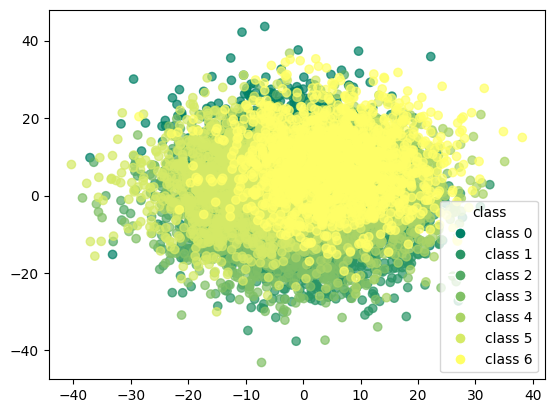

In [1401]:
scatter = plt.scatter(df_pam_umap.iloc[:, 0],df_pam_umap.iloc[:, 1], 
                      c=df_pam_umap['target'],cmap='summer',alpha=0.7)

unique_labels = np.unique(df_pam_umap['target'])
legend_elements = [Line2D([0], [0],marker='o',color='w',label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements,title="class")
plt.show()

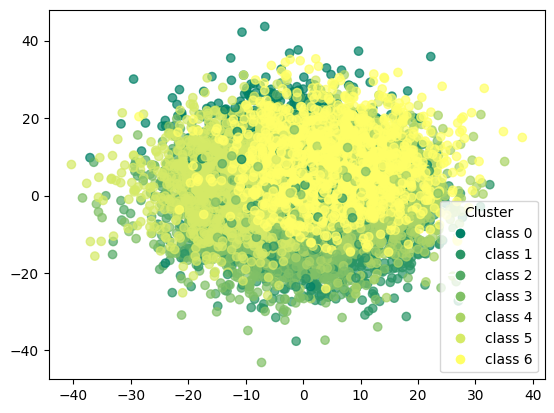

In [1402]:
scatter = plt.scatter(df_pam_umap.iloc[:, 0],df_pam_umap.iloc[:, 1], 
                      c=df_pam_umap['pam_umap'],cmap='summer',alpha=0.7)

unique_labels = np.unique(df_pam_umap['pam_umap'])
legend_elements = [Line2D([0], [0],marker='o',color='w',label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements,title="Cluster")
plt.show()

In [1403]:
print(confusion_matrix(df_pam_umap['target'],df_pam_umap['pam_umap']))

[[1269    4   30   14   74    9   28]
 [   3 1127   63  104   49   58   24]
 [   9   40 1282   18   41   34    4]
 [  14   71   11 1264   26   14   28]
 [  81   22   36   22 1184   15   68]
 [  17   47   29   26   20 1276   13]
 [  12   22    1   48   51   18 1276]]


In [1404]:
print(classification_report(df_pam_umap['target'],df_pam_umap['pam_umap']))

              precision    recall  f1-score   support

           0       0.90      0.89      0.90      1428
           1       0.85      0.79      0.82      1428
           2       0.88      0.90      0.89      1428
           3       0.84      0.89      0.86      1428
           4       0.82      0.83      0.82      1428
           5       0.90      0.89      0.89      1428
           6       0.89      0.89      0.89      1428

    accuracy                           0.87      9996
   macro avg       0.87      0.87      0.87      9996
weighted avg       0.87      0.87      0.87      9996



# overall results k-means

## basic

In [1405]:
print(classification_report(df_kmeans['target'],df_kmeans['k_means']))

              precision    recall  f1-score   support

           0       0.92      0.91      0.92      1428
           1       0.87      0.85      0.86      1428
           2       0.91      0.92      0.91      1428
           3       0.88      0.91      0.90      1428
           4       0.88      0.86      0.87      1428
           5       0.92      0.91      0.92      1428
           6       0.91      0.93      0.92      1428

    accuracy                           0.90      9996
   macro avg       0.90      0.90      0.90      9996
weighted avg       0.90      0.90      0.90      9996



In [1406]:
print(confusion_matrix(df_kmeans['target'],df_kmeans['k_means']))

[[1302    3   19   18   56   12   18]
 [   2 1213   43   72   25   42   31]
 [  10   45 1308   15   26   21    3]
 [  13   63    9 1298   14    9   22]
 [  60   27   35   15 1228   14   49]
 [  14   34   24   21   17 1305   13]
 [  12   16    2   33   25   15 1325]]


## + pca

In [1407]:
print(classification_report(df_pca_kmeans['target'],df_pca_kmeans['kmeans_pca']))

              precision    recall  f1-score   support

           0       0.86      0.87      0.87      1428
           1       0.66      0.72      0.69      1428
           2       0.83      0.79      0.81      1428
           3       0.67      0.61      0.64      1428
           4       0.67      0.69      0.68      1428
           5       0.54      0.54      0.54      1428
           6       0.84      0.82      0.83      1428

    accuracy                           0.72      9996
   macro avg       0.72      0.72      0.72      9996
weighted avg       0.72      0.72      0.72      9996



In [1408]:
print(confusion_matrix(df_pca_kmeans['target'],df_pca_kmeans['kmeans_pca']))

[[1237    0   11   14  129   31    6]
 [   0 1025   89   82   52  154   26]
 [  12   75 1127    0   94  119    1]
 [  17  135    5  878   19  343   31]
 [ 127   58   66   19  991   17  150]
 [  30  228   63  258   61  775   13]
 [   9   40    0   68  140    2 1169]]


## + t-SNE

In [1409]:
print(classification_report(df_tsne_kmeans['target'],df_tsne_kmeans['kmeans_tsne'])) 

              precision    recall  f1-score   support

           0       0.81      0.88      0.84      1428
           1       0.74      0.72      0.73      1428
           2       0.65      0.67      0.66      1428
           3       0.72      0.74      0.73      1428
           4       0.57      0.48      0.52      1428
           5       0.84      0.80      0.82      1428
           6       0.78      0.84      0.81      1428

    accuracy                           0.73      9996
   macro avg       0.73      0.73      0.73      9996
weighted avg       0.73      0.73      0.73      9996



In [1410]:
print(confusion_matrix(df_tsne_kmeans['target'],df_tsne_kmeans['kmeans_tsne'])) 

[[1260    3   21   30   84    4   26]
 [   4 1022  103  106   53   79   61]
 [  10   59  960   17  260  114    8]
 [   8  216   16 1061   36   14   77]
 [ 239    9  309   50  688    4  129]
 [  12   61   46   75   64 1142   28]
 [  27   13   28  127   27    5 1201]]


## + UMAP

In [1411]:
print(classification_report(df_umap_kmeans['target'],df_umap_kmeans['kmeans_umap'])) 

              precision    recall  f1-score   support

           0       0.90      0.89      0.90      1428
           1       0.85      0.79      0.82      1428
           2       0.89      0.90      0.89      1428
           3       0.84      0.89      0.87      1428
           4       0.82      0.83      0.83      1428
           5       0.89      0.90      0.89      1428
           6       0.88      0.90      0.89      1428

    accuracy                           0.87      9996
   macro avg       0.87      0.87      0.87      9996
weighted avg       0.87      0.87      0.87      9996



In [1412]:
print(confusion_matrix(df_umap_kmeans['target'],df_umap_kmeans['kmeans_umap'])) 

[[1272    4   30   14   71    9   28]
 [   3 1123   59  111   46   60   26]
 [   9   40 1279   18   43   35    4]
 [  15   66   10 1268   25   15   29]
 [  81   27   33   20 1180   16   71]
 [  18   44   29   25   19 1279   14]
 [  12   21    1   46   47   19 1282]]


# overall results trimmed k-means

## basic

In [1413]:
print(classification_report(df_trim_kmeans['target'],df_trim_kmeans['trim_kmeans']))

              precision    recall  f1-score   support

           0       0.92      0.92      0.92      1280
           1       0.87      0.85      0.86      1289
           2       0.91      0.92      0.91      1286
           3       0.89      0.91      0.90      1278
           4       0.89      0.86      0.87      1285
           5       0.92      0.91      0.92      1293
           6       0.91      0.93      0.92      1285

    accuracy                           0.90      8996
   macro avg       0.90      0.90      0.90      8996
weighted avg       0.90      0.90      0.90      8996



In [1414]:
print(confusion_matrix(df_trim_kmeans['target'],df_trim_kmeans['trim_kmeans']))

[[1173    2   17   14   53    9   12]
 [   2 1100   38   64   22   35   28]
 [  11   40 1181   13   22   17    2]
 [  13   54    9 1165   10    7   20]
 [  54   24   27   13 1105   15   47]
 [  12   34   24   15   16 1181   11]
 [  10   15    1   28   20   14 1197]]


## + pca

In [1415]:
print(classification_report(df_pca_trim_kmeans['target'],df_pca_trim_kmeans['trim_kmeans_pca']))

              precision    recall  f1-score   support

           0       0.87      0.83      0.85      1280
           1       0.62      0.69      0.66      1289
           2       0.79      0.75      0.77      1286
           3       0.62      0.59      0.61      1278
           4       0.64      0.69      0.67      1285
           5       0.53      0.54      0.53      1293
           6       0.84      0.80      0.82      1285

    accuracy                           0.70      8996
   macro avg       0.70      0.70      0.70      8996
weighted avg       0.70      0.70      0.70      8996



In [1416]:
print(confusion_matrix(df_pca_trim_kmeans['target'],df_pca_trim_kmeans['trim_kmeans_pca']))

[[1066   38   11   10  122   30    3]
 [   0  895  116   78   51  125   24]
 [   6   76  964   43   76  119    2]
 [  15  122   10  757   52  294   28]
 [ 106   54   61   22  885   34  123]
 [  22  215   54  240   61  692    9]
 [   4   36    5   68  128   17 1027]]


## + t-SNE

In [1417]:
print(classification_report(df_tsne_trim_kmeans['target'],df_tsne_trim_kmeans['trim_kmeans_tsne'])) 

              precision    recall  f1-score   support

           0       0.86      0.89      0.88      1280
           1       0.76      0.73      0.75      1289
           2       0.68      0.69      0.69      1286
           3       0.75      0.78      0.76      1278
           4       0.60      0.54      0.57      1285
           5       0.85      0.83      0.84      1293
           6       0.81      0.87      0.84      1285

    accuracy                           0.76      8996
   macro avg       0.76      0.76      0.76      8996
weighted avg       0.76      0.76      0.76      8996



In [1418]:
print(confusion_matrix(df_tsne_trim_kmeans['target'],df_tsne_trim_kmeans['trim_kmeans_tsne'])) 

[[1145    1   10   17   80    4   23]
 [   2  945  100   89   55   57   41]
 [   6   52  886   20  208  107    7]
 [   7  165   13  991   30   10   62]
 [ 149   12  239   75  699    2  109]
 [  11   54   34   37   63 1073   21]
 [  12    9   17   94   29    5 1119]]


## + UMAP

In [1419]:
print(classification_report(df_umap_trim_kmeans['target'],df_umap_trim_kmeans['trim_kmeans_umap'])) 

              precision    recall  f1-score   support

           0       0.93      0.92      0.93      1318
           1       0.90      0.84      0.87      1241
           2       0.93      0.94      0.93      1286
           3       0.88      0.92      0.90      1304
           4       0.89      0.86      0.88      1238
           5       0.93      0.94      0.94      1301
           6       0.91      0.94      0.93      1308

    accuracy                           0.91      8996
   macro avg       0.91      0.91      0.91      8996
weighted avg       0.91      0.91      0.91      8996



In [1420]:
print(confusion_matrix(df_umap_trim_kmeans['target'],df_umap_trim_kmeans['trim_kmeans_umap'])) 

[[1219    3   11   13   53    6   13]
 [   1 1042   35   88   21   33   21]
 [   6   23 1204   16   14   19    4]
 [  12   39    7 1205   14    6   21]
 [  61   11   22   11 1068   12   53]
 [   8   25   13   13   12 1223    7]
 [   7   14    0   23   21   14 1229]]


# overall results dbscan

## basic

In [1421]:
print(classification_report(df_dbscan['target'],df_dbscan['dbscan']))

              precision    recall  f1-score   support

          -1       0.00      0.00      0.00       0.0
           0       0.00      0.00      0.00    1428.0
           1       0.00      0.00      0.00    1428.0
           2       0.00      0.00      0.00    1428.0
           3       0.00      0.00      0.00    1428.0
           4       0.00      0.00      0.00    1428.0
           5       0.00      0.00      0.00    1428.0
           6       0.00      0.00      0.00    1428.0

    accuracy                           0.00    9996.0
   macro avg       0.00      0.00      0.00    9996.0
weighted avg       0.00      0.00      0.00    9996.0



In [1422]:
print(confusion_matrix(df_dbscan['target'],df_dbscan['dbscan']))

[[   0    0    0    0    0    0    0    0]
 [1428    0    0    0    0    0    0    0]
 [1428    0    0    0    0    0    0    0]
 [1428    0    0    0    0    0    0    0]
 [1428    0    0    0    0    0    0    0]
 [1428    0    0    0    0    0    0    0]
 [1428    0    0    0    0    0    0    0]
 [1428    0    0    0    0    0    0    0]]


## + pca

In [1423]:
print(classification_report(df_pca_dbscan['target'],df_pca_dbscan['dbscan_pca']))

              precision    recall  f1-score   support

          -1       0.00      0.00      0.00         0
           0       0.00      0.00      0.00      1428
           1       0.00      0.00      0.00      1428
           2       0.00      0.00      0.00      1428
           3       0.14      0.90      0.25      1428
           4       0.00      0.00      0.00      1428
           5       0.00      0.00      0.00      1428
           6       1.00      0.01      0.02      1428

    accuracy                           0.13      9996
   macro avg       0.14      0.11      0.03      9996
weighted avg       0.16      0.13      0.04      9996



In [1424]:
print(confusion_matrix(df_pca_dbscan['target'],df_pca_dbscan['dbscan_pca']))

[[   0    0    0    0    0    0    0    0]
 [ 196    0    0    0 1232    0    0    0]
 [ 118    0    0    0 1310    0    0    0]
 [ 210    0    0    0 1218    0    0    0]
 [ 139    0    0    0 1289    0    0    0]
 [ 109    0    0    0 1319    0    0    0]
 [  53    0    0    0 1375    0    0    0]
 [ 200    0    0    0 1212    0    0   16]]


## + t-SNE

In [1425]:
print(classification_report(df_tsne_dbscan['target'],df_tsne_dbscan['dbscan_tsne']))

              precision    recall  f1-score   support

          -1       0.00      0.00      0.00         0
           0       1.00      0.01      0.01      1428
           1       0.00      0.00      0.00      1428
           2       0.00      0.00      0.00      1428
           3       0.00      0.00      0.00      1428
           4       0.80      0.01      0.01      1428
           5       0.00      0.00      0.00      1428
           6       0.00      0.00      0.00      1428

    accuracy                           0.00      9996
   macro avg       0.23      0.00      0.00      9996
weighted avg       0.26      0.00      0.00      9996



In [1426]:
print(confusion_matrix(df_tsne_dbscan['target'],df_tsne_dbscan['dbscan_tsne']))

[[   0    0    0    0    0    0    0    0]
 [1408   10    0   10    0    0    0    0]
 [1428    0    0    0    0    0    0    0]
 [1428    0    0    0    0    0    0    0]
 [1428    0    0    0    0    0    0    0]
 [1420    0    0    0    0    8    0    0]
 [1407    0   11    0    0    0    0   10]
 [1416    0    0    0    0    2   10    0]]


## + UMAP

In [1427]:
print(classification_report(df_umap_dbscan['target'],df_umap_dbscan['dbscan_umap']))

              precision    recall  f1-score   support

           0       0.14      1.00      0.25      1428
           1       0.00      0.00      0.00      1428
           2       0.00      0.00      0.00      1428
           3       0.00      0.00      0.00      1428
           4       0.00      0.00      0.00      1428
           5       0.00      0.00      0.00      1428
           6       0.00      0.00      0.00      1428

    accuracy                           0.14      9996
   macro avg       0.02      0.14      0.04      9996
weighted avg       0.02      0.14      0.04      9996



In [1428]:
print(confusion_matrix(df_umap_dbscan['target'],df_umap_dbscan['dbscan_umap']))

[[1428    0    0    0    0    0    0]
 [1428    0    0    0    0    0    0]
 [1428    0    0    0    0    0    0]
 [1428    0    0    0    0    0    0]
 [1428    0    0    0    0    0    0]
 [1428    0    0    0    0    0    0]
 [1428    0    0    0    0    0    0]]


# overall results GMM

## basic

In [1429]:
print(classification_report(df_gmm['target'],df_gmm['gmm']))

              precision    recall  f1-score   support

           0       0.92      0.79      0.85      1428
           1       0.00      0.00      0.00      1428
           2       0.92      0.90      0.91      1428
           3       0.47      0.96      0.63      1428
           4       0.90      0.75      0.82      1428
           5       0.89      0.92      0.90      1428
           6       0.90      0.91      0.90      1428

    accuracy                           0.75      9996
   macro avg       0.71      0.75      0.72      9996
weighted avg       0.71      0.75      0.72      9996



In [1430]:
print(confusion_matrix(df_gmm['target'],df_gmm['gmm']))

[[1130  179   23   23   34   17   22]
 [   1    1   41 1281   27   56   21]
 [   8    3 1283   62   22   45    5]
 [  14    1    6 1368   11    9   19]
 [  58  123   28   56 1075   24   64]
 [  11    2   19   52    8 1317   19]
 [   7   11    1   71   18   16 1304]]


## + pca

In [1431]:
print(classification_report(df_pca_gmm['target'],df_pca_gmm['gmm_pca']))

              precision    recall  f1-score   support

           0       0.56      0.97      0.71      1428
           1       0.21      0.12      0.15      1428
           2       0.38      0.88      0.53      1428
           3       0.62      0.57      0.60      1428
           4       0.41      0.19      0.26      1428
           5       0.44      0.08      0.14      1428
           6       0.83      0.71      0.77      1428

    accuracy                           0.50      9996
   macro avg       0.49      0.50      0.45      9996
weighted avg       0.49      0.50      0.45      9996



In [1432]:
print(confusion_matrix(df_pca_gmm['target'],df_pca_gmm['gmm_pca']))

[[1388    1   16   15    0    4    4]
 [  11  166  949   30  253   14    5]
 [  74    1 1252    5   36   59    1]
 [  46  205  268  820    8   75    6]
 [ 796   44  130    8  265    0  185]
 [  98  129  650  415   13  120    3]
 [  76  242    4   21   64    0 1021]]


## + t-SNE

In [1433]:
print(classification_report(df_tsne_gmm['target'],df_tsne_gmm['gmm_tsne']))

              precision    recall  f1-score   support

           0       0.57      0.89      0.70      1428
           1       0.72      0.62      0.66      1428
           2       0.71      0.84      0.77      1428
           3       0.68      0.79      0.73      1428
           4       0.31      0.28      0.29      1428
           5       0.95      0.53      0.68      1428
           6       0.80      0.64      0.71      1428

    accuracy                           0.65      9996
   macro avg       0.68      0.65      0.65      9996
weighted avg       0.68      0.65      0.65      9996



In [1434]:
print(confusion_matrix(df_tsne_gmm['target'],df_tsne_gmm['gmm_tsne']))

[[1275    0   26   28   75    3   21]
 [  19  879   83  170  220   18   39]
 [  19   26 1200   42  126   10    5]
 [  27   49    9 1122   90    5  126]
 [ 779    5  168   60  394    3   19]
 [  22  266  191  137   42  751   19]
 [  78    3    4   91  329    3  920]]


## + UMAP

In [1435]:
print(classification_report(df_umap_gmm['target'],df_umap_gmm['gmm_umap']))

              precision    recall  f1-score   support

           0       0.60      0.93      0.73      1428
           1       0.88      0.75      0.81      1428
           2       0.64      0.92      0.75      1428
           3       0.92      0.80      0.86      1428
           4       0.07      0.02      0.03      1428
           5       0.89      0.89      0.89      1428
           6       0.89      0.88      0.89      1428

    accuracy                           0.74      9996
   macro avg       0.70      0.74      0.71      9996
weighted avg       0.70      0.74      0.71      9996



In [1436]:
print(confusion_matrix(df_umap_gmm['target'],df_umap_gmm['gmm_umap']))

[[1327    2   43    8   16    8   24]
 [  11 1066  108   60   93   67   23]
 [  16   32 1317   12   11   36    4]
 [  23   48   30 1144  151   11   21]
 [ 791   12  504    7   31   15   68]
 [  21   33   40    8   50 1267    9]
 [  29   12   30    6   83   16 1252]]


# overall results pam

## basic

In [1437]:
print(confusion_matrix(df_pam['target'],df_pam['pam']))

[[1028    0   58   14  155   81   92]
 [   0  953   43   75   49  164  144]
 [  27  156 1162   13   18   13   39]
 [  14   95   61 1098   55   59   46]
 [  55   36   70    8  868   60  331]
 [  31   62  125   13   78 1061   58]
 [   7    8   10   39  100   43 1221]]


In [1438]:
print(classification_report(df_pam['target'],df_pam['pam']))

              precision    recall  f1-score   support

           0       0.88      0.72      0.79      1428
           1       0.73      0.67      0.70      1428
           2       0.76      0.81      0.79      1428
           3       0.87      0.77      0.82      1428
           4       0.66      0.61      0.63      1428
           5       0.72      0.74      0.73      1428
           6       0.63      0.86      0.73      1428

    accuracy                           0.74      9996
   macro avg       0.75      0.74      0.74      9996
weighted avg       0.75      0.74      0.74      9996



## + pca

In [1439]:
print(confusion_matrix(df_pam_pca['target'],df_pam_pca['pam_pca']))

[[1245    0    7    4  128   38    6]
 [   0 1028   98   92   54  133   23]
 [  16   76 1115    0  107  113    1]
 [  17  142    5  865   21  346   32]
 [ 131   57   54   14  989   31  152]
 [  30  242   54  246   63  783   10]
 [   8   47    0   58  134    5 1176]]


In [1440]:
print(classification_report(df_pam_pca['target'],df_pam_pca['pam_pca']))

              precision    recall  f1-score   support

           0       0.86      0.87      0.87      1428
           1       0.65      0.72      0.68      1428
           2       0.84      0.78      0.81      1428
           3       0.68      0.61      0.64      1428
           4       0.66      0.69      0.68      1428
           5       0.54      0.55      0.54      1428
           6       0.84      0.82      0.83      1428

    accuracy                           0.72      9996
   macro avg       0.72      0.72      0.72      9996
weighted avg       0.72      0.72      0.72      9996



## + t-SNE

In [1441]:
print(confusion_matrix(df_pam_tsne['target'],df_pam_tsne['pam_tsne']))

[[1219    4   23   18  124    4   36]
 [   3 1006   90  130   56   85   58]
 [   8   75 1060   12  173   94    6]
 [   8  187   11 1075   58   13   76]
 [ 248   12  319   25  700    4  120]
 [  11   71   46   64   64 1143   29]
 [  16   26   28   81   65    5 1207]]


In [1442]:
print(classification_report(df_pam_tsne['target'],df_pam_tsne['pam_tsne']))

              precision    recall  f1-score   support

           0       0.81      0.85      0.83      1428
           1       0.73      0.70      0.72      1428
           2       0.67      0.74      0.71      1428
           3       0.77      0.75      0.76      1428
           4       0.56      0.49      0.52      1428
           5       0.85      0.80      0.82      1428
           6       0.79      0.85      0.82      1428

    accuracy                           0.74      9996
   macro avg       0.74      0.74      0.74      9996
weighted avg       0.74      0.74      0.74      9996



## + umap

In [1443]:
print(confusion_matrix(df_pam_umap['target'],df_pam_umap['pam_umap']))

[[1269    4   30   14   74    9   28]
 [   3 1127   63  104   49   58   24]
 [   9   40 1282   18   41   34    4]
 [  14   71   11 1264   26   14   28]
 [  81   22   36   22 1184   15   68]
 [  17   47   29   26   20 1276   13]
 [  12   22    1   48   51   18 1276]]


In [1444]:
print(classification_report(df_pam_umap['target'],df_pam_umap['pam_umap']))

              precision    recall  f1-score   support

           0       0.90      0.89      0.90      1428
           1       0.85      0.79      0.82      1428
           2       0.88      0.90      0.89      1428
           3       0.84      0.89      0.86      1428
           4       0.82      0.83      0.82      1428
           5       0.90      0.89      0.89      1428
           6       0.89      0.89      0.89      1428

    accuracy                           0.87      9996
   macro avg       0.87      0.87      0.87      9996
weighted avg       0.87      0.87      0.87      9996

